# Load Functions

In [1]:
setwd('./placeholder_project/code/')
source('./placeholder_project/code/jupyter_R/myFun.R')
source('./placeholder_project/code/jupyter_R/markerlist.R')
# Load required libraries
library(ggtree)
library(ape)
library(dplyr)
library(igraph)
library(forcats)
library(ggnewscale)
library(dplyr)
library(Seurat)
expanded_colors <- c(
  "#D7191C", "#E6804D", "#FF6F61", "#F18A99", "#E6AB02",
  "#D95F02", "#FFB347", "#E4A8A3", "#EBEBEB", "#FADFC3",
  "#A6CD48", "#A0D6F7", "#94D3B6", "#FDAE61", "#FEE08B",
  "#A6D96A", "#1F78B4", "#7570B3", "#A6761D", "#D73027",
  "#ABDDA4", "#2B83BA", "#F46D43", "#D8B365", "#BDBDBD",
  "#A6BD8B", "#C9948B", "#D6616B", "#7B9E23", "#B69DAE",
  "#73C2A3", "#969696", "#6A9AC4", "#B97CAA", "#7AAE3C",
  "#D5B8E5", "#4DBBD5FF", "#E64B35FF", "#00A087FF", "#A65628",
  "#FF95A8FF", "#BCBD22FF", "#FDBF6F", "#3C5488FF", "#F39B7FFF",
  "#B09C85FF", "#7876B1FF", "#377EB8", "#4DAF4A", "#97A1A7FF",
  "#984EA3", "#FF7F00", "#F781BF", "#B2DF8A", "#5050FFFF",
  "#82581FFF", "#E5614CFF", "#F0E685FF", "#D595A7FF", "#CDDEB7FF",
  "#612A79FF", "#AE1F63FF", "#1B1919FF", "#99CC00FF", "#CC9900FF",
  "#9467BDFF", "#EFD500FF", "#ADE2D0FF", "#CE3D32FF", "#749B58FF",
  "#466983FF", "#BA6338FF", "#5DB1DDFF", "#802268FF", "#6BD76BFF",
  "#924822FF", "#837B8DFF", "#C75127FF", "#D58F5CFF", "#7A65A5FF",
  "#E4AF69FF", "#3B1B53FF", "#E7C76FFF", "#5A655EFF", "#33CC00FF",
  "#00CC33FF", "#00CC99FF", "#0099CCFF", "#0A47FFFF", "#4775FFFF",
  "#FFC20AFF", "#FFD147FF", "#990033FF", "#991A00FF", "#996600FF",
  "#809900FF", "#339900FF", "#00991AFF", "#009966FF", "#008099FF",
  "#003399FF", "#1A0099FF", "#660099FF", "#990080FF", "#D60047FF",
  "#FF1463FF", "#00D68FFF",
  # 50 new colors
  "#C22E29", "#F68712", "#FCD34D", "#16A34A", "#10B981",
  "#0EA5E9", "#6366F1", "#8B5CF6", "#EC4899", "#F43F5E",
  "#FF9F43", "#FFDA77", "#A3E635", "#4ADE80", "#2DD4BF",
  "#38BDF8", "#818CF8", "#A78BFA", "#E879F9", "#F87171",
  "#EF4444", "#FB923C", "#FACC15", "#84CC16", "#22D3EE",
  "#60A5FA", "#818CF8", "#C084FC", "#F472B6", "#FB7185",
  "#DC2626", "#EA580C", "#FBBF24", "#4D7C0F", "#064E3B",
  "#0F766E", "#075985", "#4338CA", "#6D28D9", "#DB2777",
  "#9D174D", "#7C2D12", "#78350F", "#365314", "#14532D",
  "#164E63", "#1E3A8A", "#312E81", "#581C87", "#701A75"
)
expanded_colors2 = c("#4dbbd5ff" ,"#E64b35ff", "#00a087ff" ,"#a65628", "#FF95A8FF","#BCBD22FF", "#fdbf6f", "#3c5488ff",
                   "#f39b7fff", "#b09c85ff", "#7876b1ff", "#377eb8",  "#4daf4a","#97A1A7FF" ,
                   "#984ea3" , "#ff7f00",  "#f781bf", "#b2df8a", "#5050FFFF", "#82581FFF" , "#E5614CFF",
                   "#F0E685FF", "#D595A7FF", "#CDDEB7FF","#612A79FF" ,"#AE1F63FF","#1B1919FF",
                   "#99CC00FF","#CC9900FF" ,"#9467BDFF", "#EFD500FF" , "#ADE2D0FF",pal_igv()(50))
distribution_func<-function(meta, group_col, group_row, color=NULL, position='fill'){
  if(is.null(color)){
    color = c("#4dbbd5ff" ,"#E64b35ff", "#00a087ff" ,"#a65628", "#FF95A8FF","#BCBD22FF", "#fdbf6f", "#3c5488ff",
                       "#f39b7fff", "#b09c85ff", "#7876b1ff", "#377eb8",  "#4daf4a","#97A1A7FF" ,
                       "#984ea3" , "#ff7f00",  "#f781bf", "#b2df8a", "#5050FFFF", "#82581FFF" , "#E5614CFF",
                       "#F0E685FF", "#D595A7FF", "#CDDEB7FF","#612A79FF" ,"#AE1F63FF","#1B1919FF",
                       "#99CC00FF","#CC9900FF" ,"#9467BDFF", "#EFD500FF" , "#ADE2D0FF",pal_igv()(50))
  }
  a=meta %>%
    #dplyr::filter(sample_id!='0726_P1') %>%
    ggplot(aes_string(x=group_col))+
    geom_bar(aes_string(fill=group_row), stat='count', position = position)+
    scale_fill_manual(values = color)+
    theme_bw()+
    labs(y='Cells')+
    theme(panel.grid = element_blank(),
          axis.title.x = element_blank(),
          axis.text.x = element_text(angle=60,hjust = 1,vjust=1))
  return(a)
}

distribution_ht_func<-function(meta, group_col, group_row, scale='none', show='count', size=6){
  orig_df = as.data.frame.matrix(table(meta[,group_row], meta[,group_col]))
  if(scale=='row'){
    df = orig_df / rowSums(orig_df)
  }else if(scale=='column'){
    df = t(t(orig_df) / colSums(orig_df))
  }else{
    df=orig_df
  }
  if(show=='count'){
    display_num=orig_df
  }else{
    display_num = round(df,2)
  }
  pheatmap::pheatmap(df, 
                     display_numbers = display_num,
                     border_color = 'white',
                     number_color = 'black',
                     fontsize = size,
                     color = grDevices::colorRampPalette(c('#2C7BB6','#ABD9E9','#FFFFFF','#FDAE61','#D7191C'))(100),
                     cluster_cols = F,cluster_rows = F)
}
distribution_Roe_func <- function(obj, group_by1, group_by2, show.sign=FALSE, 
                                  angle_col=45,order=NULL,obj_is_meta=FALSE,size=6){
  if(!obj_is_meta){
    metadata = obj@meta.data
  }else{
    metadata = obj
  }
  #metadata = obj@meta.data
  # Roe for each cluster
  observe_data1 = metadata %>% 
    dplyr::group_by_(group_by1, group_by2) %>% 
    dplyr::summarise(cell_num=n())
  colnames(observe_data1) = c('group_by1', 'group_by2', 'cell_num')
  
  observe_data1 = observe_data1 %>% tidyr::spread(key =group_by1, value = cell_num, fill=0) %>% as.data.frame()
  
  rownames(observe_data1) = observe_data1[,1]
  observe_data1 = observe_data1[, 2:ncol(observe_data1)]
  observe_data2 = rowSums(observe_data1) - observe_data1
  
  expected_data = observe_data1
  pvalue = c()
  for(i in 1:ncol(observe_data1)){
    chisq_table = matrix(c(observe_data1[,i], observe_data2[,i]), nrow = 2, byrow = TRUE)
    chisq_res = chisq.test(chisq_table)
    expected_data[, i] = chisq_res$expected[1,]
    pvalue = c(pvalue, chisq_res$p.value)
  }
  Reo = observe_data1 / expected_data
  ####
  # plot
  
  if(show.sign=='signif'){
    annote.heatmap = t(Reo)
    annote.heatmap[annote.heatmap>1] = '+++'
    annote.heatmap[annote.heatmap<=1&annote.heatmap>0.8] = '++'
    annote.heatmap[annote.heatmap<=0.8&annote.heatmap>=0.2] = '+'
    annote.heatmap[annote.heatmap<0.2&annote.heatmap>0] = '+/-'
    annote.heatmap[annote.heatmap==0] = '-'
  }else if(show.sign=='value'){
    annote.heatmap = round(t(Reo),2)
  }else{
    annote.heatmap = t(Reo)
    annote.heatmap[annote.heatmap<Inf] = '' 
  }
  bk <- c(seq(0,0.99,by=0.01),seq(1.01,2,by=0.01))
  if(is.null(order)){
    order = colnames(Reo)
  }
  annote.heatmap = annote.heatmap[order,]
  pheatmap::pheatmap(t(Reo[,order]), 
                     cluster_rows = FALSE,
                     cluster_cols = FALSE,
                     treeheight_row = 0,
                     #color = grDevices::colorRampPalette(c(0,0.5,1,1.5,2),
                     #                                    c('#2C7BB6','#ABD9E9','#FFFFFF','#FDAE61','#D7191C'))(100),
                     color = c(colorRampPalette(c('#2C7BB6','#ABD9E9','#FFFFFF'))(length(bk)/2),
                               colorRampPalette(c('#FFFFFF','#FDAE61','#D7191C'))(length(bk)/2)),
                     breaks = bk,
                     display_numbers = annote.heatmap,
                     #cellwidth = 36, cellheight = 16, 
                     border_color = 'white',
                     number_color = 'black',
                     fontsize = size,
                     #border_color = '#ffffff',
                     angle_col=angle_col,
                     main = 'Cluster Dist (Roe)'
  )
  
  res = list('Reo'= t(Reo), 'pvalue'=pvalue, 'annote'=annote.heatmap)
  return(res)
}


method_names = c(
  "tenX","tenXarc","sci-ATAC","sciMAP-ATAC", "snATAC","dscATAC","s3ATAC","txciATAC",   
  "sciATAC3","SPATAC","scifi", "HD-ATAC",
  "AS240726", "AS240606", "AS240806", "AS240823", "AS240815", "AS241017", "AS240903", "AS241018", "AS240905", "AS240722",
  "AS241009", "AS240617", "AS240425", "AS240828", "AS240819", "AS240821", "AS241022", "AS240906", "AS240731", "AS240709"
)
method_color = c(
  "#1C6E8C", # Deep blue-green, muted cool tone
  "#4A7B33", # Deep olive green, low saturation
  "#A06723", # Deep brown-orange, muted warm tone
  "#5C3B8C", # Deep purple, reduced brightness
  "#357D74", # Dark teal, soft cool tone
  "#8C7B00", # Deep golden, darker warm tone
  "#5A2A2A", # Deep reddish brown, avoids conflict with the first color
  "#3D7FF0", # Dark cyan-green, lower saturation
  "#274B9F", # Deep blue, low brightness
  "#7A3D5C", # Deep pink, soft yet distinctive
  "#505050",  # Dark gray, used as a neutral color
  "#FF0000", # Bright red, used as the most prominent color
  "#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000",
  "#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000","#FF0000"
)
names(method_color) = method_names

celltype_round1_color = c('Immune'='#D7191C',
                 'Epithelium'='#1F78B4',
                 'Endothelium'='#FEE08B',
                 'Stroma'='#A6761D')
method_color_keep = c(
  'HD-ATAC'="#FF0000",  # Deep blue - classic and steady (suitable for control group)
  'SPATAC'="#59A14F",  # Natural green - soft but clear
  'CH-ATAC-seq'="#EDC948",  # Golden yellow - bright but not glaring
  'txciATAC'="#B07AA1",  # Violet - neutral and distinctive
  'dsciATACseq'="#4E79A7",  # Bright red - highlight color (key experimental group)
  'tenXarc'="#76B7B2",  # Blue-green - fresh and understated
    'tenX'="#76B7B2",  # Blue-green - fresh and understated
  'sciMAP-ATAC'="#FF9DA7",  # Light pink - soft contrast
  'snATAC'="#9C755F"   # Tan - neutral background color
)

ggtree v3.14.0 Learn more at https://yulab-smu.top/contribution-tree-data/

Please cite:

S Xu, Z Dai, P Guo, X Fu, S Liu, L Zhou, W Tang, T Feng, M Chen, L
Zhan, T Wu, E Hu, Y Jiang, X Bo, G Yu. ggtreeExtra: Compact
visualization of richly annotated phylogenetic data. Molecular Biology
and Evolution. 2021, 38(9):4039-4042. doi: 10.1093/molbev/msab166


Attaching package: 'ggtree'


The following object is masked from 'package:VennDiagram':

    rotate


The following object is masked from 'package:Biostrings':

    collapse


The following object is masked from 'package:tidyr':

    expand


The following object is masked from 'package:Matrix':

    expand


The following object is masked from 'package:magrittr':

    inset


The following object is masked from 'package:ggpubr':

    rotate


The following object is masked from 'package:IRanges':

    collapse


The following object is masked from 'package:S4Vectors':

    expand



Attaching package: 'ape'


The following object is m

In [2]:
pt_to_mm <- function(pt) {
  pt /2.13
}
label_size <-function(x){
    x/2.8453
}
mytheme =     theme_void()+
      theme(panel.border = element_rect(linewidth=pt_to_mm(0.25),fill=NA),
            plot.title = element_text(hjust = 0.5,face = "plain", size=8, margin = margin(t = 0, r = 0, b = 2, l = 0, unit = "pt")),

            axis.title = element_text(size=7),
            axis.title.y= element_text(angle = 90,hjust=0.5, margin = margin(t = 0, r = 2, b = 0, l = 0, unit = "pt")),
            axis.title.x= element_text(margin = margin(t = 2, r = 0, b = 0, l = 0, unit = "pt")),

            axis.text = element_text(size=6),
            axis.text.x = element_text(margin = margin(t = 1, r = 0, b = 0, l = 0, unit = "pt")),
            axis.text.y = element_text(margin = margin(t = 0, r = 1, b = 0, l = 0, unit = "pt")),

            axis.ticks = element_line(size = pt_to_mm(0.2)),
            axis.ticks.length =  unit(1, 'pt'),
            
            legend.spacing = unit(2, 'pt'),
            legend.key.width = unit(3, "mm"),  # width
            legend.key.height = unit(3, "mm"),    # height
            legend.key.spacing = unit(2, 'pt'),
            
            legend.text = element_text(size=6),
            legend.title = element_text(size=6,face = "plain"),
            legend.margin = margin(0, 0, 0, 0)
            )

In [3]:
output_dir='./placeholder_output/figure1/'

# method_comparison

In [4]:
setwd('./placeholder_data/download_data/')

## Example peak consistency with others

In [61]:
sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)
# Replicates of in-house data
umap = read.csv(glue('./placeholder_analysis/round_cluster02/round0/cell_meta.csv'))

In [6]:
best_leiden = 'leiden_0.1_round1'
umap$leiden = umap[,best_leiden]

umap$leiden = factor(umap$leiden, levels = c(0:(length(unique(umap$leiden))-1)))

In [7]:
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

pseudoObj_peaks <- readRDS(glue('./placeholder_analysis/round_cluster02/round0/pseudoObj_peaks.rds'))
pseudoObj_cells <- readRDS(glue('./placeholder_analysis/round_cluster02/round0/pseudoObj_cells.rds'))
pseudoObj_cells@meta.data[umap$X, colnames(umap)] = umap

leiden_levels = 0:(length(unique(pseudoObj_cells@meta.data[,best_leiden]))-1)

pseudoObj_cells$leiden = factor(pseudoObj_cells@meta.data[,best_leiden], levels=leiden_levels)

Idents(pseudoObj_cells) = pseudoObj_cells$leiden

pseudoObj_cells@meta.data[,'nCount_ATAC'] = pseudoObj_cells$n_fragment
pseudoObj_cells@meta.data[,'nFeature_ATAC'] = pseudoObj_cells$n_peaks

## Fragments

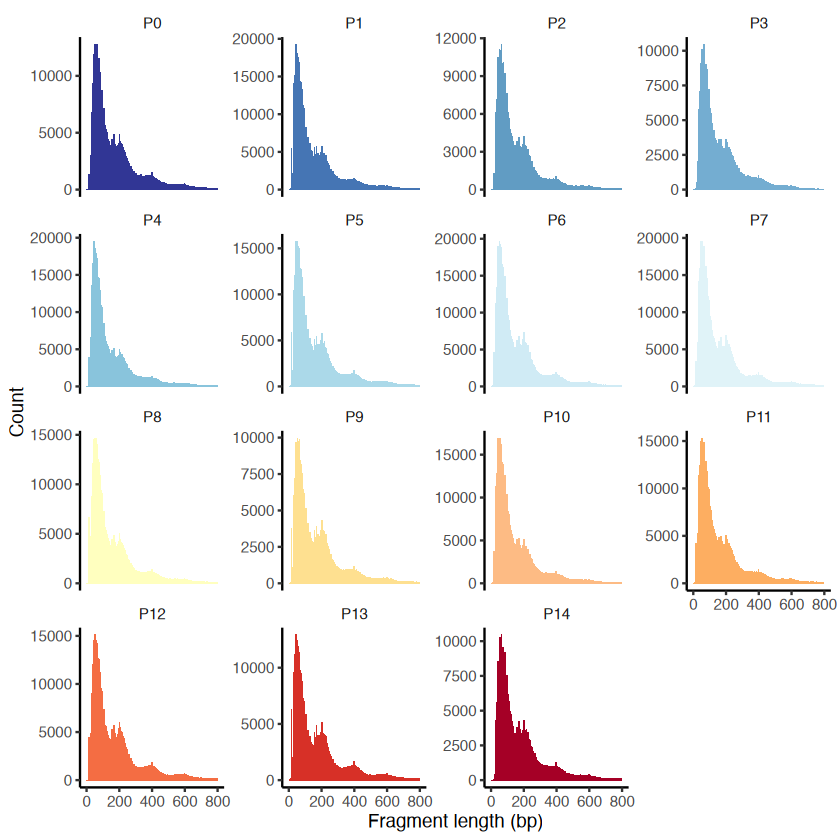

In [ ]:
a=FragmentHistogram(object = pseudoObj_cells, group.by = 'Time') & 
    scale_fill_manual(values = time_color2)
a

In [ ]:
ggsave(glue('{output_dir}/method_comparison_FragmentSize1.pdf'),a,
       width=180, height=140, units='mm', dpi=600, bg='transparent')

In [57]:
pseudoObj_cells_tsse = TSSEnrichment(object = pseudoObj_cells,fast=F, n=5000)

Extracting TSS positions

Finding + strand cut sites

Finding - strand cut sites

Computing mean insertion frequency in flanking regions

Normalizing TSS score



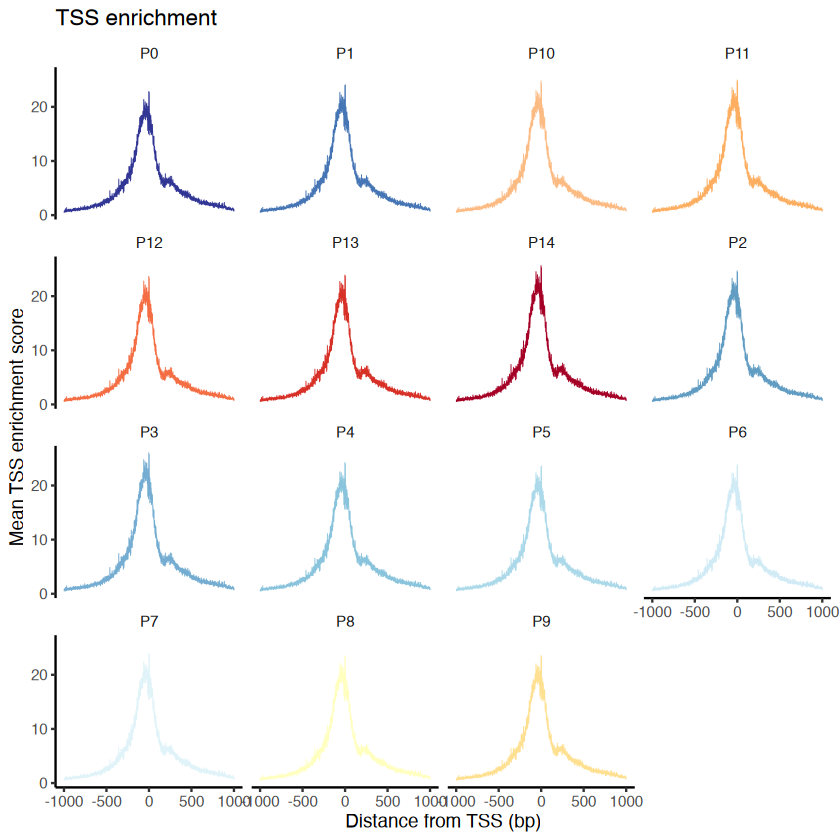

In [ ]:
a=TSSPlot(pseudoObj_cells_tsse, group.by = 'Time') & 
    scale_color_manual(values = time_color2)
a

In [ ]:
ggsave(glue('{output_dir}/method_comparison_TSSe2.pdf'),a,
       width=180, height=140, units='mm', dpi=600, bg='transparent')

In [13]:
pseudoObj_cells[['group']] = 'HD-ATAC Aggregrate'
pseudoObj_cells@meta.data[pseudoObj_cells$sampleID=='AS240709','group'] = 'HD-ATAC P0 rep1'
pseudoObj_cells@meta.data[pseudoObj_cells$sampleID=='AS241009','group'] = 'HD-ATAC P0 rep2'
Idents(pseudoObj_cells) = pseudoObj_cells$group

In [14]:
tmp_srt = subset(pseudoObj_cells, group%in%c('HD-ATAC P0 rep1', 'HD-ATAC P0 rep2'))
fgs = Fragments(tmp_srt)
new_fgs = list()
for(i in 1:length(fgs)){
    if(length(fgs[[i]]@cells)>0){
        new_fgs = c(new_fgs,fgs[[i]])
    }
}
new_fgs

[[1]]
A Fragment object for 38940 cells

[[2]]
A Fragment object for 33854 cells


In [ ]:
peak_matrix = FeatureMatrix(new_fgs, granges(pseudoObj_peaks))

Extracting reads overlapping genomic regions

Extracting reads overlapping genomic regions



In [260]:
saveRDS(peak_matrix, '../pycode/round_cluster02/merge/replication_matrix.rds')

In [15]:
peak_matrix = readRDS('../pycode/round_cluster02/merge/replication_matrix.rds')

In [16]:
set.seed(1234)
sample_peaks = sample(rownames(peak_matrix), 60000)

In [17]:
rep1_count = rowSums(peak_matrix[sample_peaks,
                               rownames(tmp_srt@meta.data[tmp_srt$group=='HD-ATAC P0 rep1',])])

rep2_count = rowSums(peak_matrix[sample_peaks,
                               rownames(tmp_srt@meta.data[tmp_srt$group=='HD-ATAC P0 rep2',])])



In [18]:
rep_count = data.frame('rep1'=log2((rep1_count)/sum(rep1_count)*1e6+1),
                       'rep2'=log2((rep2_count)/sum(rep2_count)*1e6+1)
                      )

In [19]:
head(rep_count)

,rep1,rep2
,<dbl>,<dbl>
chr9-31050815-31051316,1.6163348,1.4243527
chr18-14438645-14439146,0.5746385,0.1638612
chr17-79624961-79625462,1.8946653,1.4243527
chr11-118463106-118463607,1.5905226,1.6063403
chr2-140210181-140210682,1.8077211,2.0025357
chr2-6163952-6164453,3.0971105,3.0385921


In [ ]:
a = rep_count %>%
    # head(10000) %>%
    filter(rep1<7, rep2<7) %>%
    ggplot(aes(x=rep1, y=rep2))+
    ggpointdensity::geom_pointdensity(aes(color=..ndensity..), size=0.1,method.args=list(n=1000))+
    #geom_abline(slope = 1, intercept = 0)+
    theme_classic()+
    scale_color_distiller(palette = "Spectral", direction = -1, breaks=c(0.0,0.5,1), limits=c(0,1))+
    stat_cor(size=label_size(6))+
    labs(x='Replication1(log2CPM)',y='Replication2(log2CPM)')+
    mytheme+
    coord_equal()+
    theme(legend.position=c(0.8,0.2),
          legend.key.width = unit(1.2, "mm"),  # width
            legend.key.height = unit(1.2, "mm"),    # height
         )

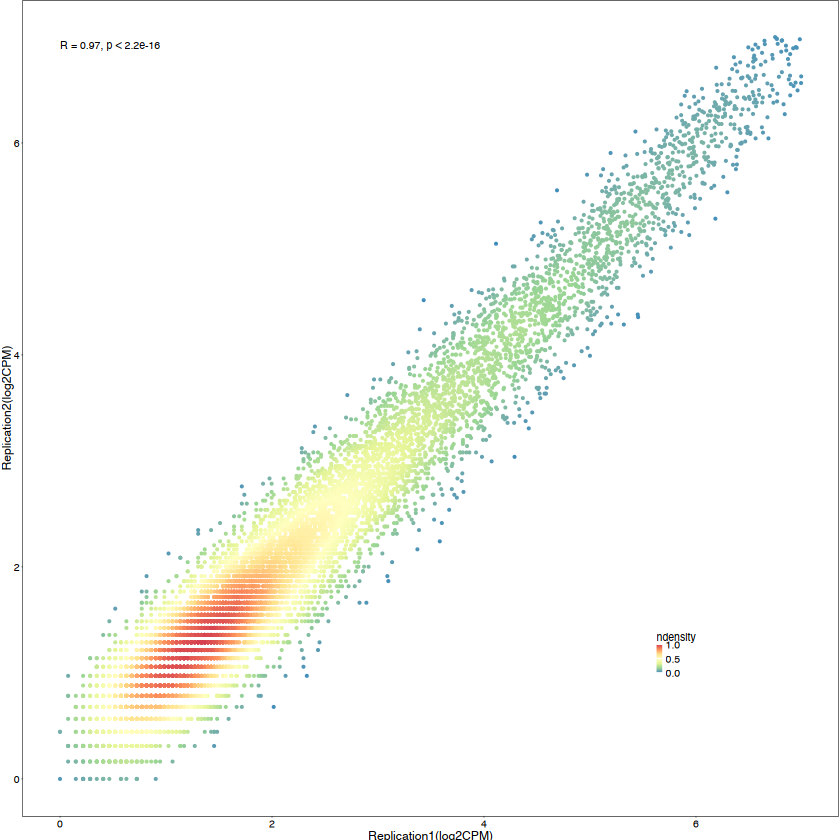

In [22]:
a

In [432]:
ggsave(glue('{output_dir}/method_comparison_reproducibility.pdf'), a,
       width=39, height=39, units='mm', dpi=600, bg='transparent')

## barcode_quality

In [ ]:
# Relationship between barcode and fragments overlapping peaks/unique reads to confirm sample quality 

sample='AS241022'
tmp_sc = read.csv(glue('../aggr_cellranger/{sample}/outs/singlecell.csv'))
tmp_sc = tmp_sc[order(tmp_sc$peak_region_fragments, decreasing = T),]

tmp_sc$index = sapply(tmp_sc$barcode, function(x)strsplit(x,'-')[[1]][2])

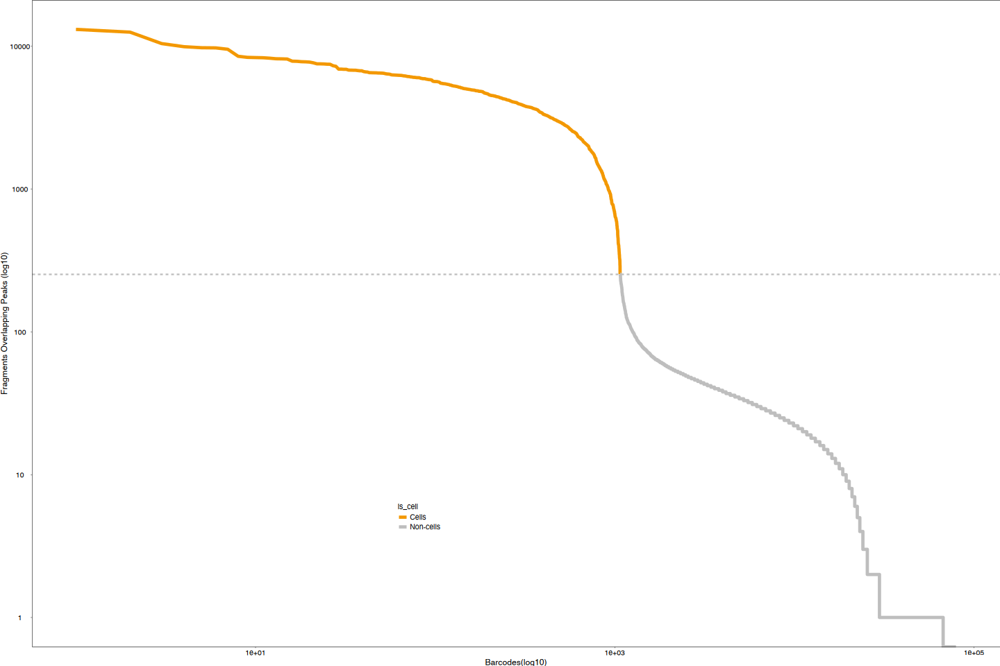

In [467]:

tmp_sc2 = tmp_sc[tmp_sc$index=='4',]
thr= min(tmp_sc2[tmp_sc2$is__cell_barcode==1,'peak_region_fragments'])
tmb_barcode2 = tmp_sc2[tmp_sc2$is__cell_barcode==0&tmp_sc2$peak_region_fragments>thr,
                       'barcode']
tmp_sc2 = tmp_sc2[!tmp_sc2$barcode%in%tmb_barcode2,]
tmp_sc2$barcodes_num = 1:nrow(tmp_sc2)
tmp_sc2$is_cell = ifelse(tmp_sc2$is__cell_barcode, 'Cells', 'Non-cells')
a=tmp_sc2 %>%
  ggplot(aes(x=barcodes_num,y=peak_region_fragments))+
  geom_line(aes(color=as.character(is_cell)), size=1)+
  scale_color_manual(values = c('Cells'='#F39800', 'Non-cells'='gray'), name='is_cell')+
  geom_hline(yintercept = thr, linetype='dashed', color='gray')+
  #facet_wrap(~index, ncol=6, scales = 'free')+
  scale_y_log10()+
  scale_x_log10()+
  labs(x='Barcodes(log10)', y='Fragments Overlapping Peaks (log10)')+
  theme_classic()+
  mytheme+
    theme(legend.position=c(0.4,0.2),
      #legend.key.width = unit(1.2, "mm"),  # width
      #  legend.key.height = unit(1.2, "mm"),    # height
     )

options(repr.plot.width=12, repr.plot.height=8)
a 

In [469]:
ggsave(glue('{output_dir}/method_comparison_barcode_quality.pdf'), a,
       width=43, height=39, units='mm', dpi=600, bg='transparent')

## TSSe

In [131]:
keep_method = c('HD-ATAC', 'SPATAC',  'txciATAC','tenXarc', 'dsciATACseq')#,'CH-ATAC-seq')#,'sciMAP-ATAC', 'snATAC')'scifi','sciATAC3',

In [132]:
all_method_qc = readRDS('./placeholder_processed/all.rds')

In [133]:
table(all_method_qc$method)


CH-ATAC-seq     dscATAC dsciATACseq     HD-ATAC      s3ATAC    sci-ATAC 
       3000        4518        4959     1193659         835        3857 
   sciATAC3       scifi sciMAP-ATAC      snATAC      SPATAC        tenX 
      72662       89990        8010        3034        1341        8067 
    tenXarc    txciATAC 
       4816      197397 

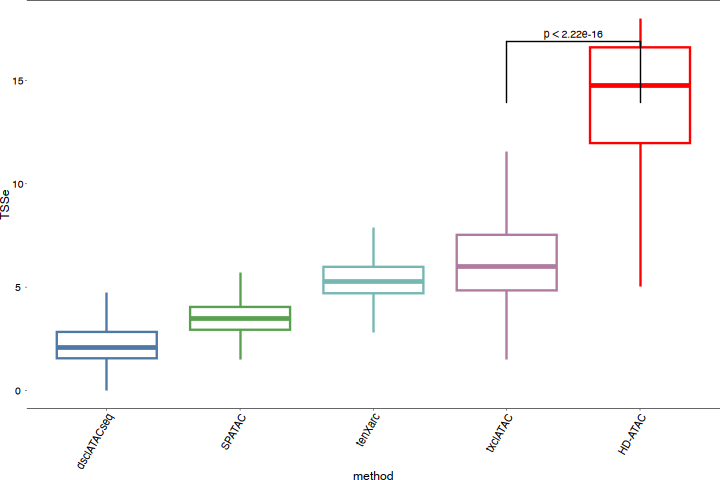

In [143]:

tsse_plot=all_method_qc %>%
  filter(!is.na(TSSe)) %>%
  filter(method%in%keep_method) %>%
  mutate(method=fct_reorder(method, TSSe)) %>%
  ggplot(aes(x=method, y=TSSe))+
  geom_boxplot(aes(color=method),outlier.shape = NA, size=0.5)+
  scale_color_manual(values = method_color_keep)+
  stat_compare_means(comparisons=list(c('HD-ATAC','txciATAC')), label = "p.format", label.y = 12, size=label_size(6))+
  lims(y=c(0,18))+
  theme_bw()+
   mytheme+
  theme(panel.grid = element_blank(),
        axis.text.x=element_text(angle = 60, hjust=1,vjust=1),
        legend.position = 'none')+
    NoLegend()
options(repr.plot.width=6, repr.plot.height=4)
tsse_plot
# all_method_qc2 = all_method_qc
# all_method_qc2[all_method_qc2$method=='HD-ATAC', 'method']=all_method_qc2[all_method_qc2$method=='HD-ATAC', 'sample']
# all_method_qc2 %>%
#   filter(!is.na(TSSe)) %>%
#   mutate(method=fct_reorder(method, TSSe)) %>%
#   ggplot(aes(x=method, y=TSSe))+
#   geom_boxplot(aes(color=method),outlier.shape = NA, size=0.5)+
#   scale_color_manual(values = method_color)+
#   lims(y=c(0,30))+
#   theme_bw()+
#   theme(panel.grid = element_blank(),
#         axis.text.x=element_text(angle = 60, hjust=1,vjust=1),
#         legend.position = 'none')

In [144]:
ggsave(glue('{output_dir}/method_comparison_TSSe_box_plot.pdf'), tsse_plot,
       width=80, height=40, units='mm', dpi=600, bg='transparent')

## FRiTSS

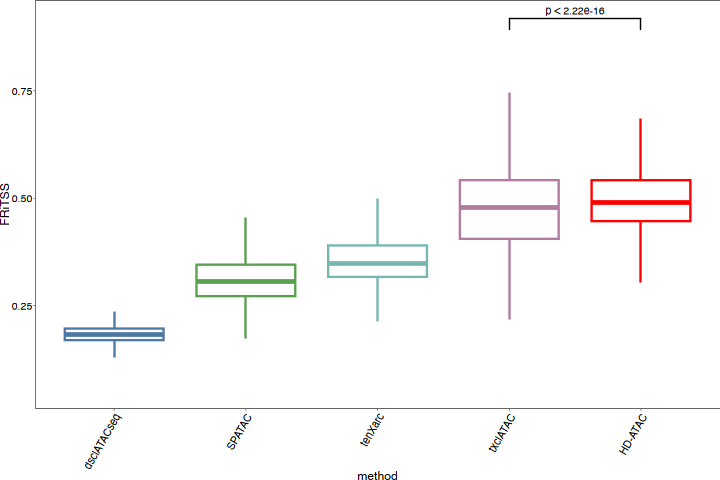

In [146]:
Fritss_plot=all_method_qc %>%
  filter(!is.na(FRiTSS)) %>%
  filter(method%in%keep_method) %>%
  mutate(method=fct_reorder(method, FRiTSS)) %>%
  ggplot(aes(x=method, y=FRiTSS))+
  geom_boxplot(aes(color=method),outlier.shape = NA, size=0.5)+
  scale_color_manual(values = method_color_keep)+
   # stat_compare_means(comparisons=list(c('HD-ATAC','txciATAC')), label = "p.format",  size=label_size(6))+
  #lims(y=c(0,30))+
  theme_bw()+
    mytheme+
  theme(panel.grid = element_blank(),
        axis.text.x=element_text(angle = 60, hjust=1,vjust=1),
        legend.position = 'none')
Fritss_plot

In [1269]:
ggsave(glue('{output_dir}/method_comparison_FRiTSS_box_plot.pdf'), Fritss_plot,
       width=60, height=40, units='mm', dpi=600, bg='transparent')

## Unique Fragments

In [544]:
head(all_method_qc)

,nCounts,nPeaks,TSS_counts,TSSe,Total,Unique,FRiP,FRiTSS,sample,method
,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AAACGAAAGCTCCGGT-1,32588,14192,9499,5.038754,56205,34419,0.5105029,0.2759813,mouse_cortex,tenX
AAACGAAAGGACTTTC-1,18313,8196,6670,5.192932,35924,21499,0.4603005,0.3102470,mouse_cortex,tenX
AAACGAAAGGTACACG-1,49233,21072,13008,5.166598,79593,51862,0.5121283,0.2508195,mouse_cortex,tenX
AAACGAAAGGTAGGCT-1,10023,4445,3390,8.302441,14421,8438,0.6194596,0.4017540,mouse_cortex,tenX
AAACGAAAGTCTGGGA-1,13276,6073,4395,6.251949,22361,12892,0.5531337,0.3409091,mouse_cortex,tenX
AAACGAACACCGTCTT-1,31908,12913,10736,6.204582,60711,33689,0.5077919,0.3186797,mouse_cortex,tenX


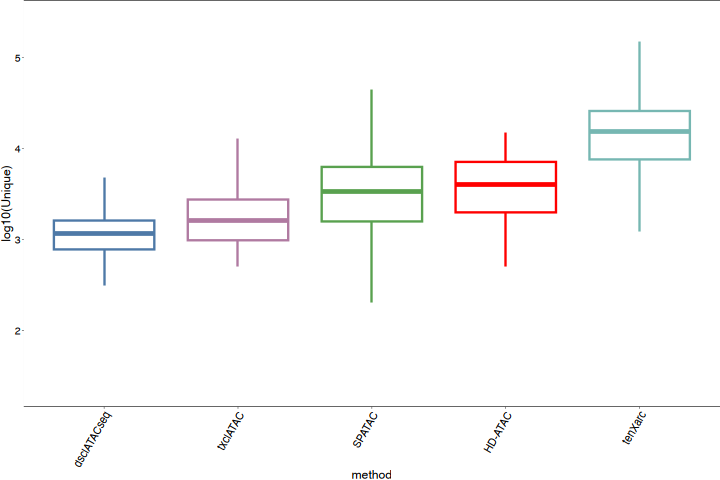

In [1271]:
Counts_plot=all_method_qc %>%
  filter(!is.na(Unique)) %>%
  filter(method%in%keep_method) %>%
  mutate(method=fct_reorder(method, Unique)) %>%
  ggplot(aes(x=method, y=log10(Unique)))+
  geom_boxplot(aes(color=method),outlier.shape = NA, size=0.5)+
  scale_color_manual(values = method_color_keep)+
  #lims(y=c(0,30))+
  theme_bw()+
    mytheme+
  theme(panel.grid = element_blank(),
        axis.text.x=element_text(angle = 60, hjust=1,vjust=1),
        legend.position = 'none')
Counts_plot

In [1272]:
ggsave(glue('{output_dir}/method_comparison_UniqueFrag_box_plot.pdf'), Counts_plot,
       width=60, height=40, units='mm', dpi=600, bg='transparent')

## FRiP

In [496]:
all_method_qc = readRDS('./placeholder_processed/all.rds')

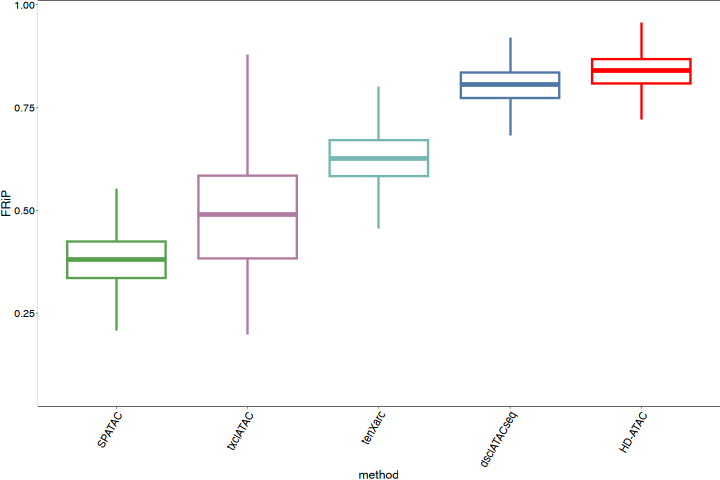

In [1273]:
Firp_plot = all_method_qc %>%
  filter(method%in%keep_method) %>%
  mutate(method=fct_reorder(method, FRiP)) %>%
  ggplot(aes(x=method, y=FRiP))+
  geom_boxplot(aes(color=method),outlier.shape = NA, size=0.5)+
  scale_color_manual(values = method_color_keep)+
   mytheme+
  theme(panel.grid = element_blank(),
        axis.text.x=element_text(angle = 60, hjust=1,vjust=1),
        legend.position = 'none')+

    NoLegend()
options(repr.plot.width=6, repr.plot.height=4)
Firp_plot

In [1274]:
ggsave(glue('{output_dir}/method_comparison_FRiP_box_plot.pdf'), Firp_plot,
       width=60, height=40, units='mm', dpi=600, bg='transparent')

## comparison_different_depths

In [1214]:
# -------comparison_different_depthsUnique fragments  --------
all_method_qc = readRDS('./placeholder_processed/all.rds')
all_method_qc[all_method_qc$method=='CH-ATAC-seq',
              'Total'] = all_method_qc[all_method_qc$method=='CH-ATAC-seq', 
                                       'Unique']


In [1215]:
tmp_depth = all_method_qc %>% group_by(method) %>% dplyr::summarise(depth=mean(Unique))
all_nPeaks2 = all_method_qc %>% filter(Total<=50000)
all_nPeaks2 = all_nPeaks2 %>% left_join(tmp_depth)
all_nPeaks2$cut = cut(all_nPeaks2$Total, c(0, 1000, 5000, 10000, 20000,30000,40000, 50000),
                      labels = c(1000, 5000, 10000, 20000,30000,40000, 50000)/1000)

#all_nPeaks2$cut = cut(all_nPeaks2$Total, c(800, 1200, 4500,5500, 9500, 10500, 20000))
cell_num = all_nPeaks2 %>%
  #filter(method%in%c('txciATAC', 'scifi', 'SPATAC','HD-ATAC','sciATAC3')) %>%
  group_by(cut, method)%>%
  dplyr::summarise(num = n())
# FRiP
a=all_nPeaks2 %>%
  #filter(method%in%c('txciATAC', 'scifi', 'SPATAC','HD-ATAC','sciATAC3')) %>%
  group_by(cut, method)%>%
  dplyr::summarise(Unique = mean(FRiP)) %>%
  ggplot(aes(x=cut, y=Unique, color=method, group=method))+
  geom_point()+
  geom_line()+
  labs(x='Sequencing depth\n(x1000 reads per cell)', y='FRiP')+
  scale_color_manual(values = method_color)+
  theme_bw()+
  theme(panel.grid = element_blank())
# TSSe
b=all_nPeaks2 %>%
  #filter(method%in%c('txciATAC', 'scifi', 'SPATAC','HD-ATAC','sciATAC3')) %>%
  group_by(cut, method)%>%
  dplyr::summarise(Unique = mean(TSSe)) %>%
  ggplot(aes(x=cut, y=Unique, color=method, group=method))+
  geom_point()+
  geom_line()+
  labs(x='Sequencing depth\n(x1000 reads per cell)', y='TSSe')+
  scale_color_manual(values = method_color)+
  theme_bw()+
  theme(panel.grid = element_blank())

# FRiTSS
c=all_nPeaks2 %>%
  #filter(method%in%c('txciATAC', 'scifi', 'SPATAC','HD-ATAC','sciATAC3')) %>%
  group_by(cut, method)%>%
  dplyr::summarise(Unique = mean(FRiTSS)) %>%
  ggplot(aes(x=cut, y=Unique, color=method, group=method))+
  geom_point()+
  geom_line()+
  labs(x='Sequencing depth\n(x1000 reads per cell)', y='FRiTSS')+
  scale_color_manual(values = method_color)+
  theme_bw()+
  theme(panel.grid = element_blank())

Joining with `by = join_by(method)`
`summarise()` has grouped output by 'cut'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'cut'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'cut'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'cut'. You can override using the `.groups` argument.


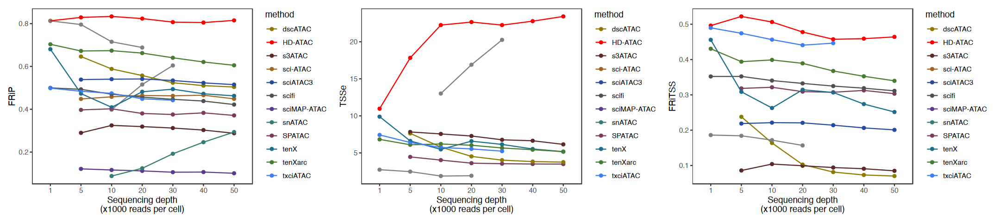

In [1216]:
options(repr.plot.width=18, repr.plot.height=4)
a+b+c

In [50]:
ggsave(glue('{output_dir}/method_comparison_different_depths_line_plot.pdf'), a+b+c,
       width=330, height=80, units='mm', dpi=600, bg='transparent')

In [558]:
head(all_nPeaks2)

,nCounts,nPeaks,TSS_counts,TSSe,Total,Unique,FRiP,FRiTSS,sample,method,depth,cut
,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>
1,18313,8196,6670,5.192932,35924,21499,0.4603005,0.3102470,mouse_cortex,tenX,24535.29,40
2,10023,4445,3390,8.302441,14421,8438,0.6194596,0.4017540,mouse_cortex,tenX,24535.29,20
3,13276,6073,4395,6.251949,22361,12892,0.5531337,0.3409091,mouse_cortex,tenX,24535.29,30
4,26148,11896,6944,4.968488,41549,26587,0.5262722,0.2611803,mouse_cortex,tenX,24535.29,50
5,7691,3317,2940,9.420054,12912,5902,0.6809556,0.4981362,mouse_cortex,tenX,24535.29,20
6,3159,1533,1199,5.783308,10116,5660,0.3007067,0.2118375,mouse_cortex,tenX,24535.29,20


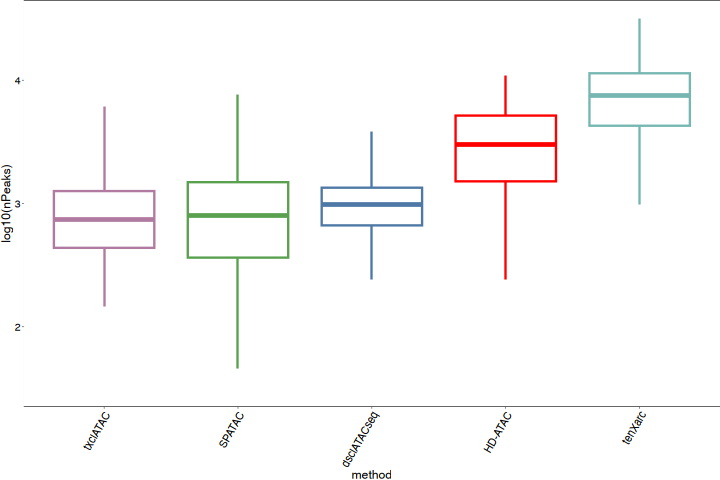

In [1275]:
nPeaks_plot = all_method_qc %>%
  filter(method%in%keep_method) %>%
  mutate(method=fct_reorder(method, nPeaks)) %>%
  ggplot(aes(x=method, y=log10(nPeaks)))+
  geom_boxplot(aes(color=method),outlier.shape = NA, size=0.5)+
  scale_color_manual(values = method_color_keep)+
  lims(y=c(1.5,4.5))+
   mytheme+
  theme(panel.grid = element_blank(),
        axis.text.x=element_text(angle = 60, hjust=1,vjust=1),
        legend.position = 'none')+

    NoLegend()
options(repr.plot.width=6, repr.plot.height=4)
nPeaks_plot

In [1276]:
ggsave(glue('{output_dir}/method_comparison_nPeaks_box_plot.pdf'), nPeaks_plot,
       width=60, height=40, units='mm', dpi=600, bg='transparent')

## throughput_comparison

In [1189]:
my_cellnumber = read.table('../pycode/output/qc_recorde.txt', header = T)
sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)
my_cellnumber$Time = sample_info[my_cellnumber$sample, 'Time']


# my_cellnumber = my_cellnumber %>% filter(total>15000)
cell_number = my_cellnumber %>% group_by(Time) %>% dplyr::summarise(cells=sum(after_doublet)) %>% as.data.frame()
cell_number$method='HD-ATAC'
cell_number = rbind(cell_number, data.frame(Time='tenX',cells=c(7729,8067,7749,5297,9374,5537,6639), 
                                            method='tenX'))
tmp_meta = readRDS('./placeholder_processed/scifi_seq2.RDS')
#tmp_meta = as.data.frame(tmp_meta[tmp_meta$tech=='scifi',])
cell_number = rbind(cell_number, data.frame(Time='scifi',cells=as.vector(table(tmp_meta$library)), 
                                            method='scifi'))

#tmp_srt = fread('./GSE215901/GSM6645255_SL1_Cell_Ranger_metadata.csv.gz')
#tmp_srt = tmp_srt[(tmp_srt$is_GRCh38_cell_barcode+tmp_srt$is_mm10_cell_barcode)==1,]
#tmp_srt = fread('./GSE215901/GSE215901_RAW/GSM6645256_SL2_Cell_Ranger_metadata.csv.gz')
#tmp_srt = tmp_srt[(tmp_srt$is_GRCh38_cell_barcode+tmp_srt$is_mm10_cell_barcode)==1,]
meta1 = fread('./GSE231708/GSE231708_phased_txci.cc16ko_wt_mm10_lung_metadata.txt.gz')
meta2 = fread('./GSE231708/GSE231708_standard_txci.cc16ko_wt_mm10_lung_metadata.txt.gz')
meta3 = fread('./GSE231708/GSE231708_standard_txci.native_hg38_lung_metadata.txt.gz')
meta4 = fread('./GSE231708/GSE231708_standard_txci.native_mm10_liver_metadata.txt.gz')
meta5 = fread('./GSE231708/GSE231708_standard_txci.native_mm10_lung_metadata.txt.gz')

cell_number = rbind(cell_number, data.frame(Time='txciATAC',cells=c(as.vector(table(meta1$Replicate)),
                                                                 as.vector(table(meta2$Replicate)),
                                                                 as.vector(table(meta3$Replicate)),
                                                                 as.vector(table(meta4$Replicate)),
                                                                 as.vector(table(meta5$Replicate))
), 
                                            method='txciATAC'))
tmp_meta = readRDS('./placeholder_processed/sciATAC_seq3.RDS')
cell_number = rbind(cell_number, data.frame(Time='sciATAC3',cells=as.vector(table(tmp_meta$donor_id)), 
                                            method='sciATAC3'))


cell_number = rbind(cell_number, data.frame(Time='SPATAC',cells=c(9696,10203,9244,22487,23257,
                                                                  15751,17723,33078,16138,47518,
                                                                  73396,33079,72331,111471,60271,
                                                                  59929,43232,40175,101793,87645), 
                                            method='SPATAC'))

data_summary <- function(data, varname, groupnames){
  require(plyr)
  summary_func <- function(x, col){
    c(mean = mean(x[[col]], na.rm=TRUE),
      sd = sd(x[[col]], na.rm=TRUE))
  }
  data_sum<-ddply(data, groupnames, .fun=summary_func,
                  varname)
  data_sum <- rename(data_sum, c("mean" = varname))
  return(data_sum)
}

df2 <- data_summary(cell_number, varname="cells", 
                    groupnames=c("method"))



In [1190]:
# Convert dose to a factor variable
a = cell_number %>%
  group_by(method) %>%
  dplyr::summarise(cells=round(mean(cells))) %>%
  mutate(method = factor(method, levels=c('HD-ATAC','SPATAC','txciATAC','scifi','sciATAC3',  'tenX'))) %>%
  ggplot(aes(x=method, y=cells))+
  geom_bar(aes(fill=method), color='black',stat='identity')+
  geom_text(aes(y=cells-3000,label=cells), color='white')+
  geom_errorbar(aes(x=method,ymin=cells,ymax=cells+sd),data=df2, width=0.2, inherit.aes = F)+
  scale_fill_manual(values = method_color)+
  theme_bw()+
  theme(panel.grid = element_blank())

# b = cell_number %>%
#   mutate(Time=fct_reorder(Time,cells)) %>%
#   ggplot(aes(x=Time, y=cells))+
#   geom_bar(aes(fill=method), color='black',stat='identity', size=0.3)+
#   geom_hline(yintercept = 8000, linetype='dashed', color='black')+
#   geom_text(aes(x='tenX',y=8000+3000,label='8k'), inherit.aes = F, size=4)+
#   geom_hline(yintercept = 80000, linetype='dashed', color='black')+
#   geom_text(aes(x='tenX',y=80000+3000,label='80k'), inherit.aes = F, size=4)+
#   scale_fill_manual(values = method_color)+
#   
#   theme_bw()+
#   theme(panel.grid = element_blank())

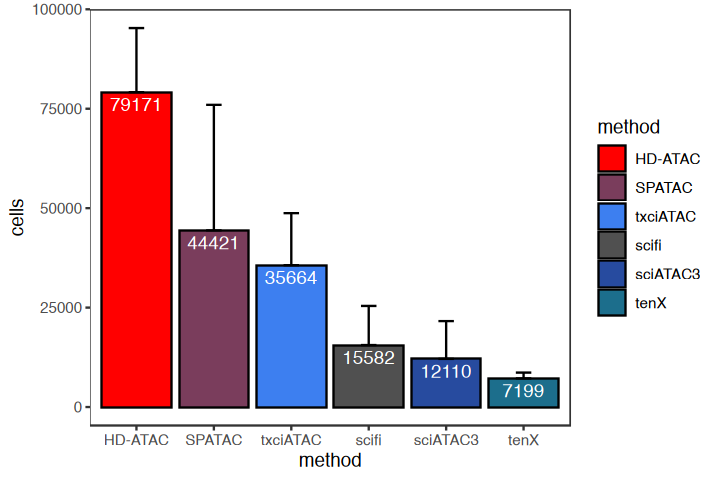

In [1191]:
options(repr.plot.width=6, repr.plot.height=4)
a

In [392]:
ggsave(glue('{output_dir}/method_comparison_throughput.pdf'), a,
       width=140, height=80, units='mm', dpi=600, bg='transparent')

In [1192]:
df3 = df2 %>% filter(method%in%c('HD-ATAC','tenX'))

In [1195]:
df3[2,1] = 'tenXarc'

In [1200]:
cell_number2 = cell_number
cell_number2[cell_number2$method=='tenX', 'method'] = 'tenXarc'

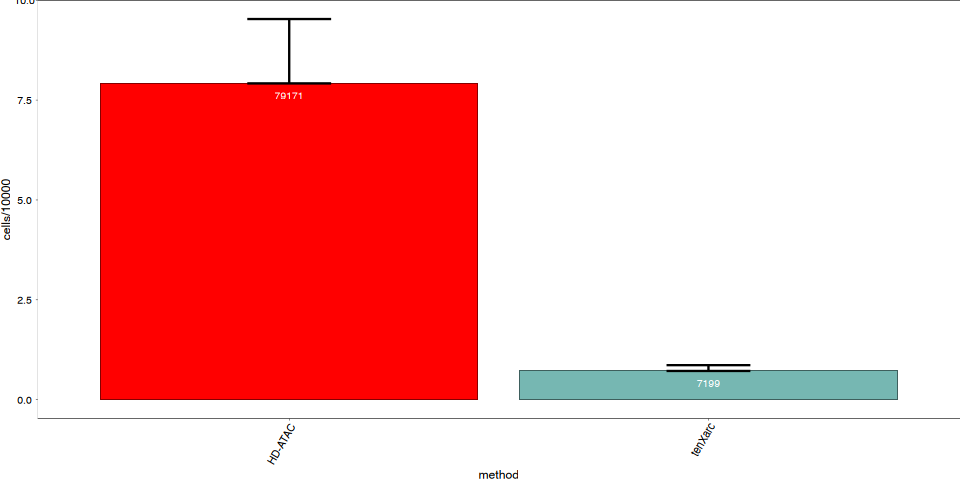

In [1286]:
# Convert dose to a factor variable
cell_number_plot = cell_number2 %>%
  group_by(method) %>%
  dplyr::summarise(cells=round(mean(cells))) %>%
  filter(method%in%c('HD-ATAC','tenXarc')) %>%
  mutate(method = factor(method, levels=c('HD-ATAC', 'tenXarc'))) %>%
  ggplot(aes(x=method, y=cells/10000))+
  geom_bar(aes(fill=method), color='black',stat='identity', size=0.1)+
  geom_text(aes(y=(cells-3000)/10000,label=cells), color='white', size=label_size(6))+
  geom_errorbar(aes(x=method,ymin=cells/10000,ymax=(cells+sd)/10000),data=df3, width=0.2, inherit.aes = F)+
  scale_fill_manual(values = method_color_keep)+
     mytheme+
  theme(panel.grid = element_blank(),
        axis.text.x=element_text(angle = 60, hjust=1,vjust=1),
        legend.position = 'none')+

    NoLegend()
cell_number_plot

In [1287]:
ggsave(glue('{output_dir}/method_comparison_throughput2.pdf'), a,
       width=24, height=40, units='mm', dpi=600, bg='transparent')

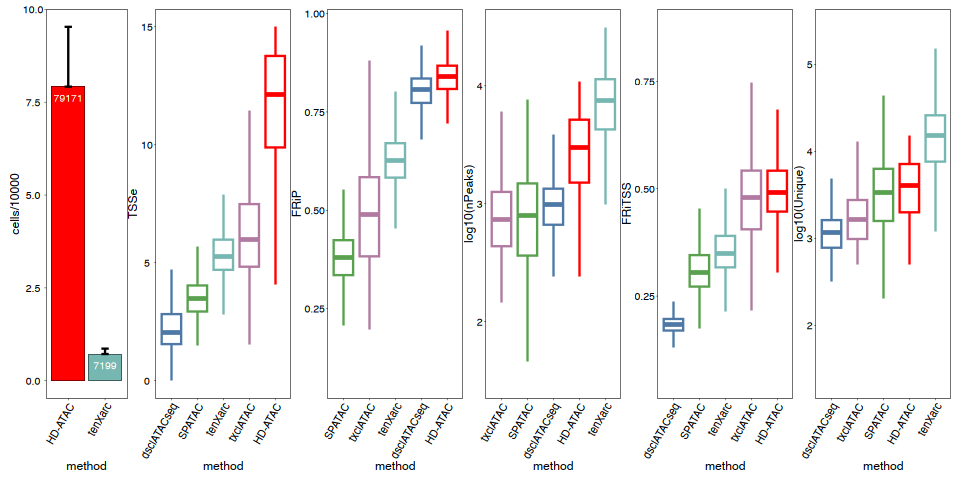

In [1288]:
options(repr.plot.width=8, repr.plot.height=4)
all_qc_plot = (cell_number_plot|tsse_plot|Firp_plot|nPeaks_plot|Fritss_plot|Counts_plot)+
    patchwork::plot_layout(widths = c(0.6,1,1,1,1,1))
all_qc_plot

In [1289]:
ggsave(glue('{output_dir}/method_comparison_all.pdf'), all_qc_plot,
       width=160, height=35, units='mm', dpi=600, bg='transparent')

## collision

In [199]:
base_dir = './placeholder_collision/AS240118A1_Combine2/'

In [208]:
peaks.path  = glue('{base_dir}/filtered_peak_bc_matrix/peaks.bed')
peaks <- read.table(file = peaks.path,col.names = c("chr", "start", "end"))
gr <- makeGRangesFromDataFrame(peaks)
fragPath = glue('{base_dir}/fragments.tsv.gz')
singlecells = glue('{base_dir}/filtered_peak_bc_matrix/barcodes.tsv')
singlecells = read.csv(singlecells, header = F)
singlecells = singlecells[,1]
# Fragments
frags <- CreateFragmentObject(path = fragPath,cells = singlecells)
# Counts
obj.counts <- FeatureMatrix(fragments = frags,
                            features = gr,
                            cells = singlecells,process_n = 1e6)
# Assay
Frag.assay <- CreateChromatinAssay(obj.counts, fragments = frags)
# Object
merge.obj <- CreateSeuratObject(Frag.assay, assay = "ATAC")

Computing hash

Extracting reads overlapping genomic regions



In [223]:
merge.obj$group = ifelse(merge.obj$nCount_ATAC>median(merge.obj$nCount_ATAC), 'HighDepth', 'LowDepth')

In [225]:
table(merge.obj$group )


HighDepth  LowDepth 
     4591      4591 

In [226]:
granges(merge.obj)

GRanges object with 360247 ranges and 0 metadata columns:
                  seqnames        ranges strand
                     <Rle>     <IRanges>  <Rle>
       [1]     GRCh38_chr1    9655-10538      *
       [2]     GRCh38_chr1   28856-29641      *
       [3]     GRCh38_chr1   90856-91776      *
       [4]     GRCh38_chr1 104541-105432      *
       [5]     GRCh38_chr1 138723-139566      *
       ...             ...           ...    ...
  [360243] mm10_GL456216.1   48792-49697      *
  [360244] mm10_GL456216.1   50750-51644      *
  [360245] mm10_JH584292.1   11302-12073      *
  [360246] mm10_JH584292.1   14013-14922      *
  [360247] mm10_JH584295.1     1514-1976      *
  -------
  seqinfo: 68 sequences from an unspecified genome; no seqlengths

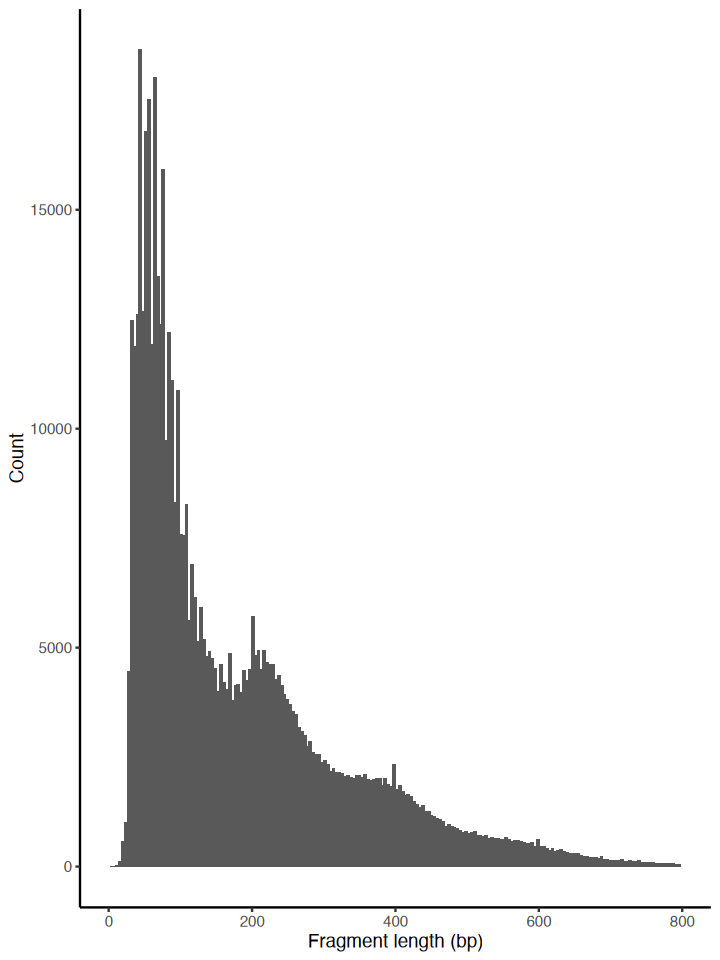

In [ ]:
a=FragmentHistogram(object = merge.obj)
a


In [229]:
ggsave(glue('{output_dir}/method_comparison_FragmentSize_collision.pdf'),a,
       width=80, height=80, units='mm', dpi=600, bg='transparent')

In [232]:
annotation <- GetGRangesFromEnsDb(ensdb = EnsDb.Hsapiens.v86)
seqlevels(annotation) <- paste0('GRCh38_chr', seqlevels(annotation))

In [233]:
Annotation(merge.obj) = annotation

Extracting TSS positions

Finding + strand cut sites

Finding - strand cut sites

Computing mean insertion frequency in flanking regions

Normalizing TSS score



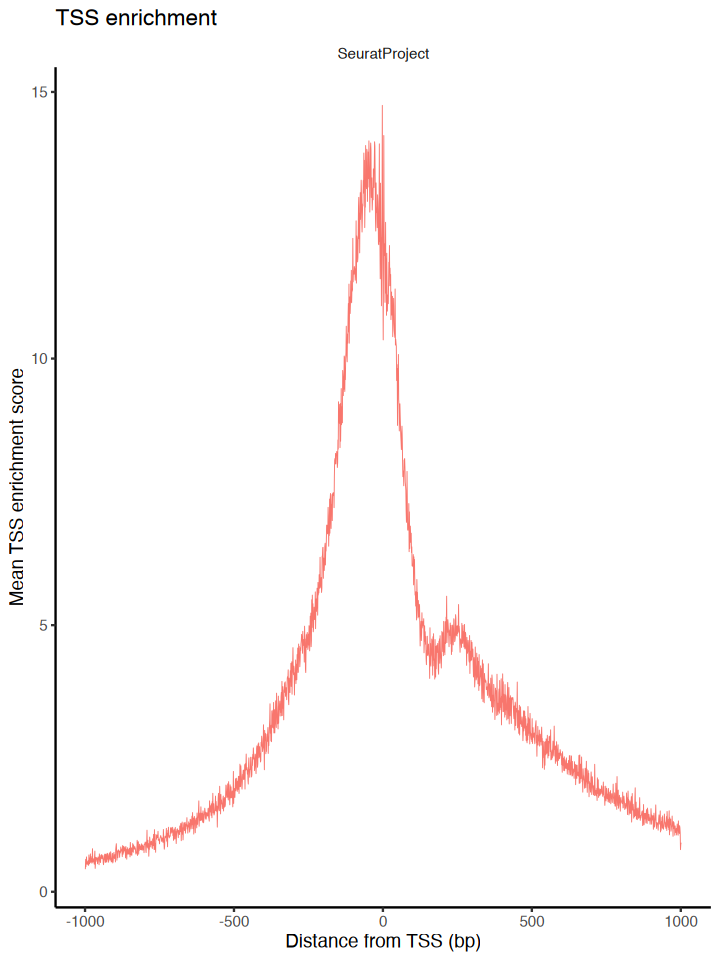

In [236]:
merge.obj = TSSEnrichment(object =  merge.obj,fast=F, n=20000)
a=TSSPlot(merge.obj)
a


In [237]:
ggsave(glue('{output_dir}/method_comparison_TSSe_collision.pdf'),a,
       width=100, height=100, units='mm', dpi=600, bg='transparent')

In [1290]:
base_dir = './placeholder_collision/AS240118A1_Combine2/'
combine_meta = read.table(glue('{base_dir}/singlecell.csv'), sep=',', header = T)
combine_meta_2 = combine_meta[(combine_meta[,'is_mm10_cell_barcode']+
                               combine_meta[,'is_GRCh38_cell_barcode'])>0,]
new_type = apply(combine_meta_2, 1, function(x){
    thr = 500
    hg_count = as.numeric(x['passed_filters_GRCh38'])
    ms_count = as.numeric(x['passed_filters_mm10'])
    if(min(ms_count,hg_count)>thr){
        return('Collisions')
    }else{
        if(hg_count>ms_count){
            return('GRCh38')
        }else{
            return('mm10')
        }
    }
})

combine_meta_2[, 'type'] = new_type


A549_meta = read.table('./placeholder_collision/AS240118A1_A549_hg38_mm10_singlecell.csv',
                       sep=',', header = T)
AML12_meta = read.table('./placeholder_collision/AS240118A1_AML12_hg38_mm10_singlecell.csv',
                       sep=',', header = T)

A549_meta = A549_meta[(A549_meta[,'is_mm10_cell_barcode']+
                               A549_meta[,'is_GRCh38_cell_barcode'])>0,]
AML12_meta = AML12_meta[(AML12_meta[,'is_mm10_cell_barcode']+
                               AML12_meta[,'is_GRCh38_cell_barcode'])>0,]

A549_meta$source='A549'
AML12_meta$source='AML12'
split_meta = rbind(A549_meta,AML12_meta)

split_meta[, 'type'] = 'GRCh38'
split_meta[split_meta[,'is_mm10_cell_barcode']>0, 'type'] = 'mm10'
split_meta[(split_meta[,'is_mm10_cell_barcode']+
                                    split_meta[,'is_GRCh38_cell_barcode'])==2, 'type'] = 'Collisions'

new_type = apply(split_meta, 1, function(x){
    thr = 500
    hg_count = as.numeric(x['passed_filters_GRCh38'])
    ms_count = as.numeric(x['passed_filters_mm10'])
    if(min(ms_count,hg_count)>thr){
        return('Collisions')
    }else{
        if(hg_count>ms_count){
            return('GRCh38')
        }else{
            return('mm10')
        }
    }
})

split_meta[, 'type'] = new_type


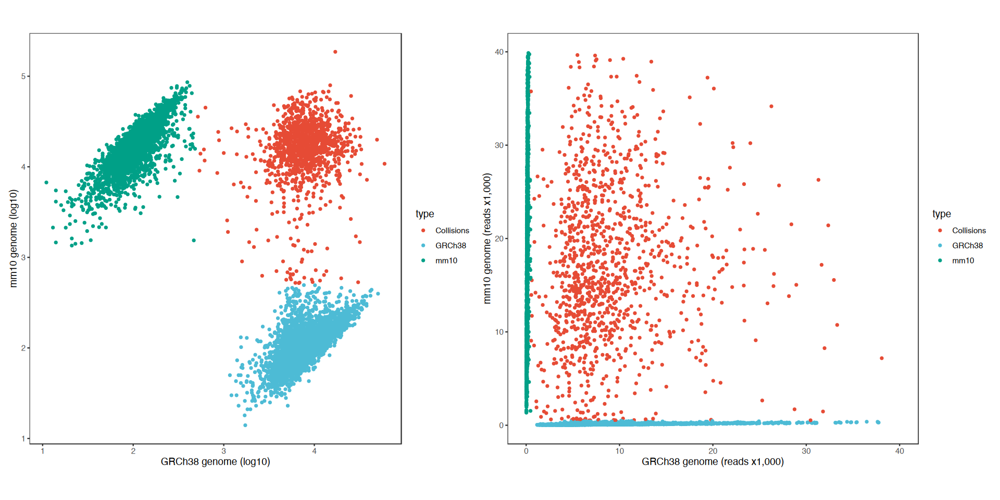

In [1291]:
options(repr.plot.width=8, repr.plot.height=8)
options(repr.plot.width=16, repr.plot.height=8)
c=combine_meta_2 %>%
    ggplot(aes(x=passed_filters_GRCh38/1000, y=passed_filters_mm10/1000, color=type)) +
    geom_point(size=1)+
    lims(x=c(0,40), y=c(0,40))+
    labs(x='GRCh38 genome (reads x1,000)',y='mm10 genome (reads x1,000)')+
    scale_color_npg()+
    theme_bw()+
    theme(panel.grid=element_blank())+
    coord_equal()
a=combine_meta_2 %>%
    ggplot(aes(x=log10(passed_filters_GRCh38), y=log10(passed_filters_mm10), color=type)) +
    geom_point(size=1)+
    #lims(x=c(0,40), y=c(0,40))+
    labs(x='GRCh38 genome (log10)',y='mm10 genome (log10)')+
    scale_color_npg()+
    theme_bw()+
    theme(panel.grid=element_blank())+
    coord_equal()
a+c

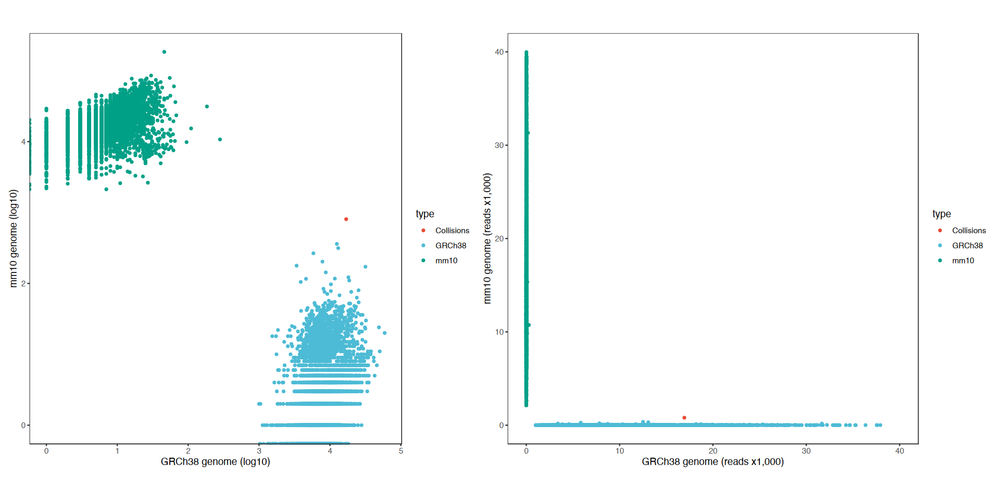

In [361]:
options(repr.plot.width=16, repr.plot.height=8)
d=split_meta %>%
    ggplot(aes(x=(passed_filters_GRCh38/1000), y=(passed_filters_mm10/1000), color=type)) +
    geom_point(size=1)+
    lims(x=c(0,40), y=c(0,40))+
        labs(x='GRCh38 genome (reads x1,000)',y='mm10 genome (reads x1,000)')+
    scale_color_npg()+
    theme_bw()+
    theme(panel.grid=element_blank())+
    coord_equal()
b=split_meta %>%
    ggplot(aes(x=log10(passed_filters_GRCh38), y=log10(passed_filters_mm10), color=type)) +
    geom_point(size=1)+
    #lims(x=c(0,40), y=c(0,40))+
    labs(x='GRCh38 genome (log10)',y='mm10 genome (log10)')+
    scale_color_npg()+
    theme_bw()+
    theme(panel.grid=element_blank())+
    coord_equal()
b+d

In [73]:
options(repr.plot.width=16, repr.plot.height=16)
ggsave(glue('{output_dir}/method_comparison_collisions_scatter_plot.pdf'), a+b+c+d,
       width=200, height=200, units='mm', dpi=600, bg='transparent')

In [387]:
c=combine_meta_2 %>%
    mutate(type = factor(type, c('mm10', 'GRCh38', 'Collisions'))) %>%
    arrange(type) %>%
    ggplot(aes(x=passed_filters_GRCh38/1000, y=passed_filters_mm10/1000, color=type)) +
    geom_point(size=0.1)+
    lims(x=c(0,40), y=c(0,40))+
    labs(x='GRCh38 genome (reads x1,000)',y='mm10 genome (reads x1,000)')+
    scale_color_manual(values = c('mm10'='gray', 'GRCh38'='#9e9e9e', 'Collisions'='red'))+
    mytheme+
    coord_equal()
d=split_meta %>%
    mutate(type = factor(type, c('mm10', 'GRCh38', 'Collisions'))) %>%
    arrange(type) %>%
    ggplot(aes(x=(passed_filters_GRCh38/1000), y=(passed_filters_mm10/1000), color=type)) +
    geom_point(size=0.1)+
    lims(x=c(0,40), y=c(0,40))+
        labs(x='GRCh38 genome (reads x1,000)',y='mm10 genome (reads x1,000)')+
    scale_color_manual(values = c('mm10'='gray', 'GRCh38'='#9e9e9e', 'Collisions'='red'))+
    mytheme+
    coord_equal()

In [388]:
ggsave(glue('{output_dir}/method_comparison_collisions_scatter_plot2.pdf'), (c+d)+plot_layout(guides = 'collect'),
       width=100, height=50, units='mm', dpi=600, bg='transparent')

In [384]:
plot.df = as.data.frame.table(table(combine_meta_2$type))
colnames(plot.df) = c('Source', 'Freq')
plot.df$percent = plot.df$Freq/sum(plot.df$Freq)
plot.df <- plot.df %>% 
    arrange(desc(Source)) %>%
    mutate(ypos = cumsum(percent)- 0.5*percent)

pl1 = ggplot(plot.df, aes(x="", y=percent, fill=Source))+
  geom_bar(width = 1, stat = "identity")+
  coord_polar("y", start=0) +
  #geom_text(aes(x=.5,y = ypos, label = paste0(round(percent,1),'%')), size=5)+
  geom_text_repel(aes(x=1,y = ypos, label = paste0(Source,'(',round(percent,4)*100,')%')), 
                  size=5, color='black')+
  theme_void()+
  scale_fill_npg()+
  scale_color_igv()+
  #labs(title = 'ChipSeeker') +
  theme( plot.title = element_text(hjust = 0.5),
       legend.position='none')
pl2 = ggplot(plot.df, aes(x="", y=percent, fill=Source))+
 geom_bar(width = 1, stat = "identity")+
 coord_polar("y", start=0) +
 #geom_text(aes(x=1.5,y = ypos, label = paste0(round(percent,1),'%')), size=5)+
 geom_text_repel(aes(x=1,y = ypos, label = paste0(Source,'(',round(percent,4)*100,')%')), 
                 size=5, color='black')+
 theme_void()+
 scale_fill_manual(values=c('mm10'='gray', 'GRCh38'='#9e9e9e', 'Collisions'='red'))+
 #scale_color_npg()+
 #labs(title = 'ChipSeeker') +
 theme( plot.title = element_text(hjust = 0.5),
      legend.position='none')



plot.df = as.data.frame.table(table(split_meta$type))
colnames(plot.df) = c('Source', 'Freq')
plot.df$percent = plot.df$Freq/sum(plot.df$Freq)
plot.df <- plot.df %>% 
    arrange(desc(Source)) %>%
    mutate(ypos = cumsum(percent)- 0.5*percent)

pl3 = ggplot(plot.df, aes(x="", y=percent, fill=Source))+
  geom_bar(width = 1, stat = "identity")+
  coord_polar("y", start=0) +
  #geom_text(aes(x=.5,y = ypos, label = paste0(round(percent,1),'%')), size=5)+
  geom_text_repel(aes(x=1,y = ypos, label = paste0(Source,'(',round(percent,4)*100,')%')), 
                  size=5, color='white')+
  theme_void()+
  scale_fill_npg()+
  scale_color_igv()+
  #labs(title = 'ChipSeeker') +
  theme( plot.title = element_text(hjust = 0.5),
       legend.position='none')
pl4 = ggplot(plot.df, aes(x="", y=percent, fill=Source))+
 geom_bar(width = 1, stat = "identity")+
 coord_polar("y", start=0) +
 #geom_text(aes(x=1.5,y = ypos, label = paste0(round(percent,1),'%')), size=5)+
 geom_text_repel(aes(x=1,y = ypos, label = paste0(Source,'(',round(percent,4)*100,')%')), 
                 size=5, color='white')+
 theme_void()+
 scale_fill_manual(values=c('mm10'='gray', 'GRCh38'='#9e9e9e', 'Collisions'='red'))+
 #scale_color_npg()+
 #labs(title = 'ChipSeeker') +
 theme( plot.title = element_text(hjust = 0.5),
      legend.position='none')

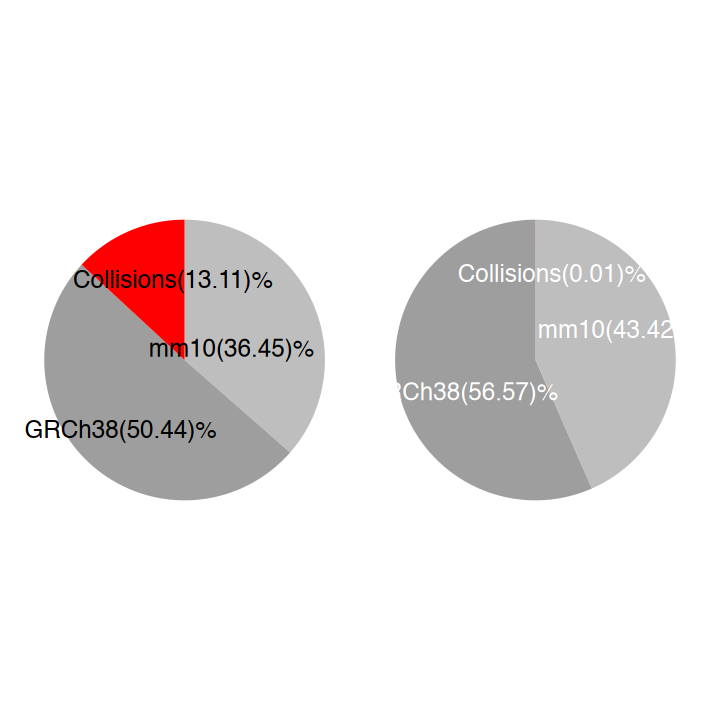

In [385]:
options(repr.plot.width=6, repr.plot.height=6)
pl2+pl4

In [386]:
ggsave(glue('{output_dir}/method_comparison_collisions_pie_chart.pdf'), pl2+pl4,
       width=150, height=75, units='mm', dpi=600, bg='transparent')

# major_cluster_umap

In [181]:
sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)

base_path='./placeholder_analysis/round_cluster02/'
merge_path='./placeholder_analysis/round_cluster02/merge'

umap = read.csv(glue('{merge_path}/cell_meta.csv'))
tsne = umap

umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)

tsne[, c('UMAP_1', 'UMAP_2')] = tsne[, c('TSNE_1', 'TSNE_2')]

In [190]:
dim(umap)

[1] 1185619      60

In [184]:
table(umap$Celltype_round1)


Endothelium  Epithelium      Immune      Stroma 
     361275      170835      390513      262996 

In [188]:
xx=round(table(umap$Celltype_round1)/dim(umap)[1],4)
xx


Endothelium  Epithelium      Immune      Stroma 
     0.3047      0.1441      0.3294      0.2218 

In [191]:
xx = table(umap$Celltype_round4)
xx


                  Airway_Acp7        Airway_Cilitated_Lypd2 
                         7428                          7115 
       Airway_Cilitated_Muc16           Airway_Club_Scgb1a1 
                         5292                          1665 
            Airway_Club_Sftpb                 Airway_Spock3 
                        11909                           275 
        Alveolar_Fibro_Gpr111           Alveolar_Fibro_Irx3 
                         9751                          7954 
     Alveolar_Fibro_Serpina3n                           AT1 
                         3864                         21018 
                      AT1_Agt                      AT1_Mfrp 
                        10315                         12555 
                    AT1_Nek10                     AT1_Tldc2 
                        17096                          6126 
                          AT2                     AT2_Gfra1 
                        35205                         28072 
                     AT

In [193]:
min(xx)
max(xx)
median(xx)
mean(xx)
length(xx)

[1] 166

[1] 97960

[1] 5439

[1] 9190.845

[1] 129

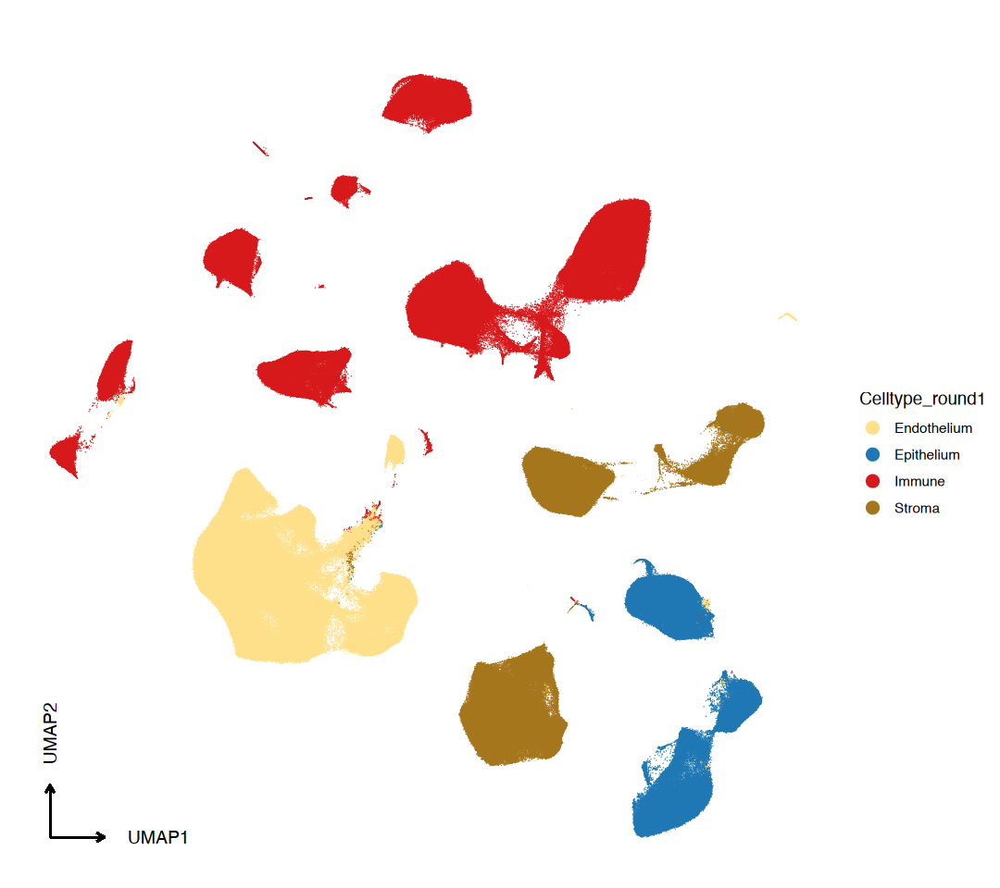

In [182]:
options(repr.plot.width=9, repr.plot.height=8)
a=myDimPlot(umap, groupby='Celltype_round1', label=F, group_color=celltype_round1_color, point_size=0.1)
a

In [112]:
ggsave(glue('{output_dir}/major_cluster_umap_round1_legend.pdf'), get_legend(a),
       width=50, height=50, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/major_cluster_umap_round1_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [183]:
ggsave(glue('{output_dir}/major_cluster_umap_round1_cells.png'), a,
       width=180, height=160, units='mm', dpi=600, bg='transparent')

In [986]:
# round1 TSNE
a=myDimPlot(tsne, groupby='Celltype_round1', label=F, group_color=celltype_round1_color, point_size=0.1)

ggsave(glue('{output_dir}/major_cluster_tsne_round1_legend.pdf'), get_legend(a),
       width=50, height=50, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/major_cluster_tsne_round1_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [987]:
# round4 TSNE
a=myDimPlot(tsne, groupby='Celltype_round4', label=F, group_color=expanded_colors, point_size=0.1)
ggsave(glue('{output_dir}/major_cluster_tsne_round4_legend.pdf'), get_legend(a),
       width=450, height=250, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/major_cluster_tsne_round4_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [121]:
# Round4 UMAP
a=myDimPlot(umap, groupby='Celltype_round4', label=T, group_color=expanded_colors, point_size=0.1)
ggsave(glue('{output_dir}/major_cluster_umap_round4_legend.pdf'), get_legend(a),
       width=450, height=250, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/major_cluster_umap_round4_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [620]:
# UMAP Time
a = myDimPlot(umap, groupby='Time', label=FALSE, group_color=time_color2, point_size=0.1)
ggsave(glue('{output_dir}/major_cluster_umap_Time_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/major_cluster_umap_Time_cells.pdf'), a+NoLegend(),
       width=60, height=60, units='mm', dpi=600, bg='transparent')

In [214]:
xx = table(umap$Celltype_round4)
cluster_num = 1:129
names(cluster_num) = names(xx[order(xx)])

In [228]:
cluster_num[cluster_num==22]

Myeloid_Neutrophils_Cpne8 
                       22

In [217]:
umap$cluster_num = cluster_num[umap$Celltype_round4]

In [291]:
celltype_meta = umap %>% 
    group_by(Celltype_round1,Celltype_round2,Celltype_round3,Celltype_round4) %>%
    dplyr::summarise(n=n())
celltype_meta$cluster_num = cluster_num[celltype_meta$Celltype_round4]
write.table(celltype_meta, './placeholder_analysis/round_cluster02/merge/celltype_modify.csv',
            sep=',', row.names=F)

`summarise()` has grouped output by 'Celltype_round1', 'Celltype_round2', 'Celltype_round3'. You can override using the `.groups`
argument.


In [71]:
set.seed(1234)
sample_ix = sample(1:nrow(umap), 200000)

In [376]:
head(umap)

,X,sample,leiden_0.1,leiden_0.2,leiden_0.3,leiden_0.4,leiden_0.5,leiden_0.6,leiden_0.7,leiden_0.8,⋯,sample_id,leiden,UMAP_1,UMAP_2,TSNE_1,TSNE_2,UMAP3_1,UMAP3_2,UMAP3_3,cluster_num
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,AS240819_AAACAAGCAAAGTGAA-14,AS240819,9,9,9,9,14,16,15,19,⋯,0819_P5,18,9.5581390,2.608145,9.5552340,-5.812831,8.137222,1.291306,2.179303,88
2,AS240819_AAACAAGCAAAGTGAA-37,AS240819,1,1,1,1,1,3,3,2,⋯,0819_P5,22,3.9003136,-7.967577,28.3201640,-11.812177,1.264753,-4.429750,-1.789772,89
3,AS240819_AAACAAGCAAATATGC-24,AS240819,8,8,8,8,9,9,10,10,⋯,0819_P5,9,-0.7771832,17.423262,-31.3245470,2.164661,1.345104,11.563835,-1.967232,108
4,AS240819_AAACAAGCAACAGGCT-16,AS240819,0,0,14,14,16,15,17,17,⋯,0819_P5,16,-6.8199964,-4.235188,17.9789240,5.854744,-2.721172,-1.093577,9.133885,25
5,AS240819_AAACAAGCAACAGGCT-33,AS240819,0,0,0,0,0,0,0,8,⋯,0819_P5,3,-6.5087233,-1.785686,1.5777426,18.966606,-4.849679,-1.880019,7.827541,128
6,AS240819_AAACAAGCAACAGGCT-4,AS240819,11,13,13,13,12,13,13,14,⋯,0819_P5,25,-14.4807000,3.780998,-0.8789766,-11.505660,-5.868028,8.554812,-2.400949,111


In [377]:
write.table(umap[sample_ix, 'X'], './placeholder_analysis/round_cluster02/merge/sample20wcells.txt',
           quote=F)

In [238]:
round4_color = expanded_colors[1:129]
names(round4_color) = names(xx)

In [1297]:
saveRDS(cluster_num,'./placeholder_analysis/round_cluster02/merge/round4_cluster_num.rds')

saveRDS(round4_color,'./placeholder_analysis/round_cluster02/merge/round4_color.rds')

In [241]:
a=cluster_num[cluster_num==108]
round4_color[names(a)] = '#FFa90AFF'
a=cluster_num[cluster_num==77]
round4_color[names(a)] = '#136d33FF'
a=cluster_num[cluster_num==122]
round4_color[names(a)] = '#296223FF'

In [313]:
round4_color2 = round4_color
names(round4_color2) = 1:129

In [240]:
a=cluster_num[cluster_num%in%c(122,60)]
a
round4_color[names(a)] 

Myeloid_Neutrophils_Scimp Myeloid_Neutrophils_Daam2 
                       60                       122

Myeloid_Neutrophils_Scimp Myeloid_Neutrophils_Daam2 
              "#991A00FF"               "#990033FF"

In [242]:
library(ggtext)
darken_color <- function(color, factor = 1.5) {
  col <- col2rgb(color)
  col <- col / factor  # 
  col <- rgb(t(col), maxColorValue = 255)
  return(col)
}


In [288]:
label_data = umap[sample_ix, ] %>% 
    group_by(cluster_num) %>% 
    dplyr::summarise(x=median(TSNE_1),y=median(TSNE_2), Celltype_round4=unique(Celltype_round4))

a=umap[sample_ix, ] %>%
  ggplot(aes(x=TSNE_1, y=TSNE_2))+
  geom_point(aes(,fill=Celltype_round4),size=0.3, shape=21, stroke=NA)+
  #geom_point(aes(x=x,y=y,label=cluster_num,color=Celltype_round4),
  #           data=label_data, shape=21, stroke=0.5, size=5,
  #           fill=alpha('#eeeeee', 0.4),)+
  #geom_text(aes(x=x,y=y,label=cluster_num), color='black',          
  #           data=label_data,size=label_size(4))+
  geom_label_repel(aes(x=x,y=y,label=cluster_num,color=Celltype_round4),data=label_data,
                   fill=alpha('#eeeeee', 0.5),
                   #color='black',
                   #label.color='black',segment.colour='black',
                   size=label_size(6), #label.r=unit(0.25, 'lines'),
                   #label.size=label_size(0.5),
                   label.padding=0.1,
                  segment.size=0.3,
                  max.overlaps=1000,
                   force=0.008,force_pull=0.008
                  )+
  scale_fill_manual(values = round4_color)+
  scale_color_manual(values = darken_color(round4_color, factor=1.15))+
  theme_void()+
  guides(fill = guide_legend(override.aes = list(size=4, stroke=NA,shape=21)))

ggsave(glue('{output_dir}/major_cluster_tsne_round4_cells_raster.pdf'), a+NoLegend(),
       width=100, height=100, units='mm', dpi=1200, bg='transparent')

In [144]:
a=umap[sample_ix, ] %>%
  ggplot(aes(x=UMAP_1, y=UMAP_2,fill=Time))+
  geom_point(size=0.3, shape=21, stroke=NA)+
  scale_fill_manual(values = time_color2)+
  theme_void()+
  guides(fill = guide_legend(override.aes = list(size=4, stroke=NA,shape=21)))

ggsave(glue('{output_dir}/major_cluster_umap_time_cells_raster.pdf'), a+NoLegend(),
       width=60, height=60, units='mm', dpi=1200, bg='transparent')

In [75]:
a=umap[sample_ix, ] %>%
  ggplot(aes(x=TSNE_1, y=TSNE_2,fill=Time))+
  geom_point(size=0.2, shape=21, stroke=NA)+
  scale_fill_manual(values = time_color2)+
  theme_void()+
  guides(fill = guide_legend(override.aes = list(size=4, stroke=NA,shape=21)))

In [76]:
ggsave(glue('{output_dir}/major_cluster_tsne_time_cells_raster.pdf'), a+NoLegend(),
       width=60, height=60, units='mm', dpi=1200, bg='transparent')

In [24]:
# TSNE Time
a = myDimPlot(tsne, groupby='Time', label=FALSE, group_color=time_color2, point_size=0.1)
ggsave(glue('{output_dir}/major_cluster_tsne_Time_legend.pdf'), get_legend(a),
       width=150, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/major_cluster_tsne_Time_cells.png'), a+NoLegend(),
       width=60, height=60, units='mm', dpi=600, bg='transparent')

# quality_plots

## sample_qc_bar_plot

In [238]:
# -----sample_qc_bar_plot----------------------------------------------------------
qc_res = read.table('../pycode/output/qc_recorde.txt', header = T)
qc_res = reshape2::melt(qc_res, id='sample')
sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)
qc_res$sample_id = factor(sample_info[qc_res$sample, 'sample_time'], levels=sample_levels)
qc_res$Time = factor(sample_info[qc_res$sample, 'Time'], levels=time_levels)

In [239]:
qc_res = qc_res%>%dplyr::group_by(Time, variable) %>% dplyr::summarise(value=sum(value))

`summarise()` has grouped output by 'Time'. You can override using the `.groups` argument.


In [ ]:
qc_res %>%
  filter(variable=='after_doublet')

Time,variable,value
<fct>,<fct>,<int>
P0,after_doublet,72704
P1,after_doublet,86460
P2,after_doublet,73931
P3,after_doublet,60151
P4,after_doublet,96259
P5,after_doublet,93818
P6,after_doublet,108565
P7,after_doublet,95973
P8,after_doublet,77257


In [156]:
xx = qc_res %>%
  filter(variable=='after_doublet')
sum(xx$value)

[1] 1187571

In [161]:
xx=umap %>%
    group_by(Time) %>%
    dplyr::summarise(n=n())
min(xx$n)
max(xx$n)
mean(xx$n)

[1] 52310

[1] 108348

[1] 79041.27

In [163]:
xx=umap %>%
    group_by(Time) %>%
    dplyr::summarise(n=mean(n_fragment))
min(xx$n)
max(xx$n)
mean(xx$n)

[1] 3496.591

[1] 5398.509

[1] 4190.955

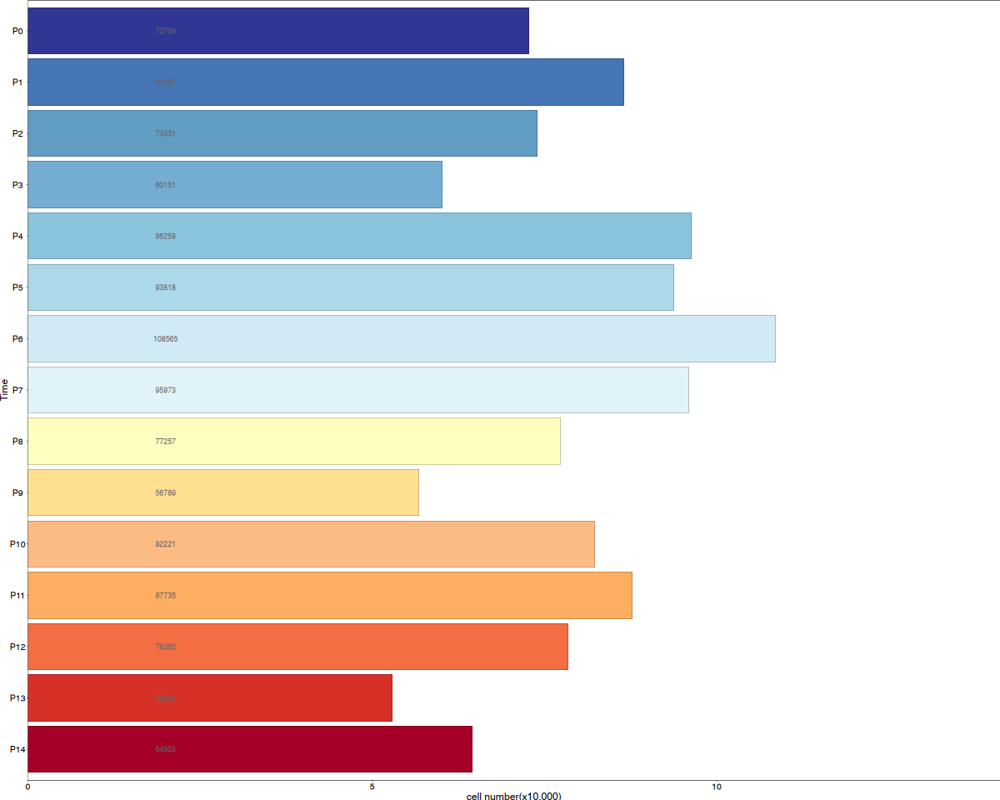

In [153]:
options(repr.plot.width=10, repr.plot.height=8)
a=qc_res %>%
  filter(variable=='after_doublet') %>%
  #mutate(variable=factor(variable, levels=rev(c('total', 'after_qc', 'after_doublet')))) %>%
  mutate(Time=factor(Time, rev(time_levels))) %>%
  ggplot(aes(x=value/10000, y=Time,fill=Time))+
  geom_bar(color='black',stat='identity', position = 'dodge', width=0.9, size=pt_to_mm(0.1))+
  geom_text(aes(label=value,x=2),
            size=label_size(5),
            color='#666666'
            #position = position_dodge(width =0.9), hjust=1.2
           )+
  scale_fill_manual(values = time_color2)+
  #scale_fill_manual(values = c('total'='#f0f3db', 'after_qc'='#a8ddb5', 'after_doublet'='#43a2ca'))+
  labs(x='cell number(x10,000)')+
  #scale_fill_manual(values = c('total', 'after_qc', 'after_doublet'))+
  scale_x_continuous(expand = expansion(mult = c(0,0.3)))+
  theme_classic()+
  mytheme+
  NoLegend()
a

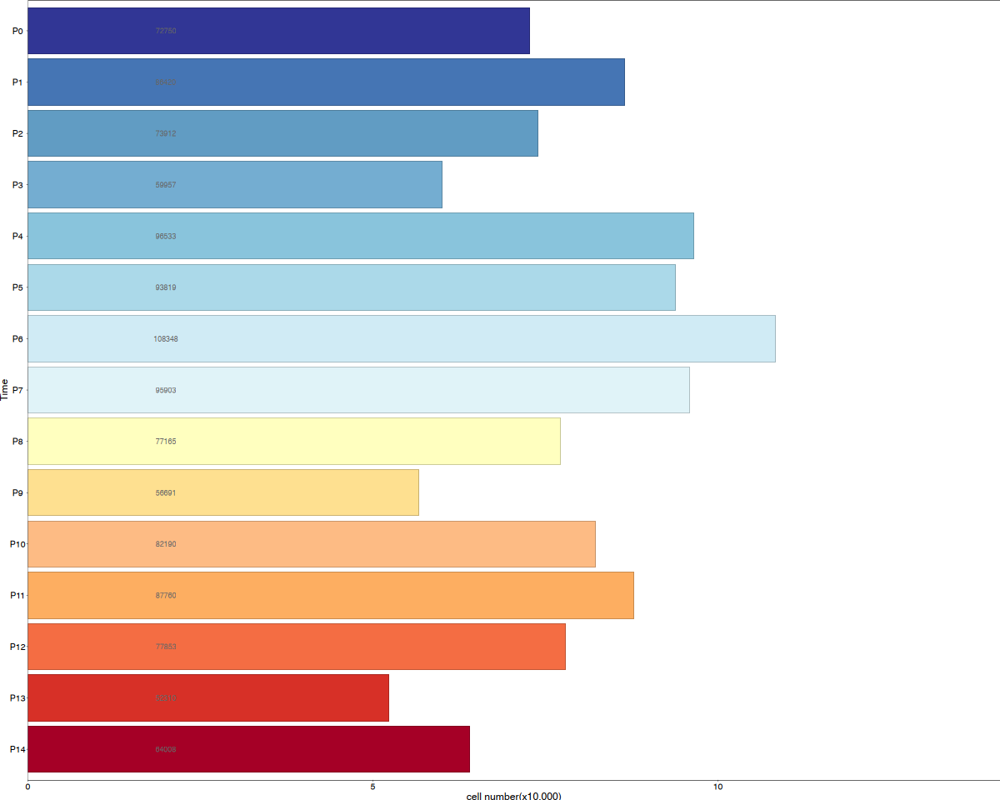

In [249]:
options(repr.plot.width=10, repr.plot.height=8)
a=umap %>%
    group_by(Time) %>%
    dplyr::summarise(n=n()) %>%
  #mutate(variable=factor(variable, levels=rev(c('total', 'after_qc', 'after_doublet')))) %>%
  mutate(Time=factor(Time, rev(time_levels))) %>%
  ggplot(aes(x=n/10000, y=Time,fill=Time))+
  geom_bar(color='black',stat='identity', position = 'dodge', width=0.9, size=pt_to_mm(0.1))+
  geom_text(aes(label=n,x=2),
            size=label_size(5),
            color='#666666'
            #position = position_dodge(width =0.9), hjust=1.2
           )+
  scale_fill_manual(values = time_color2)+
  #scale_fill_manual(values = c('total'='#f0f3db', 'after_qc'='#a8ddb5', 'after_doublet'='#43a2ca'))+
  labs(x='cell number(x10,000)')+
  #scale_fill_manual(values = c('total', 'after_qc', 'after_doublet'))+
  scale_x_continuous(expand = expansion(mult = c(0,0.3)))+
  theme_classic()+
  mytheme+
  NoLegend()
a

In [160]:
ggsave(glue('{output_dir}/quality_filtered_cell_counts.pdf'), a,
       width=30, height=60, units='mm', dpi=600, bg='transparent')

In [253]:
tmp_qc = umap %>%
    group_by(Time) %>%
    dplyr::summarise(n=n()) %>%
  #mutate(variable=factor(variable, levels=rev(c('total', 'after_qc', 'after_doublet')))) %>%
  mutate(Time=factor(Time, rev(time_levels)))

In [ ]:
qc_res[qc_res$variable=='after_doublet', 'value'] = tmp_qc$n

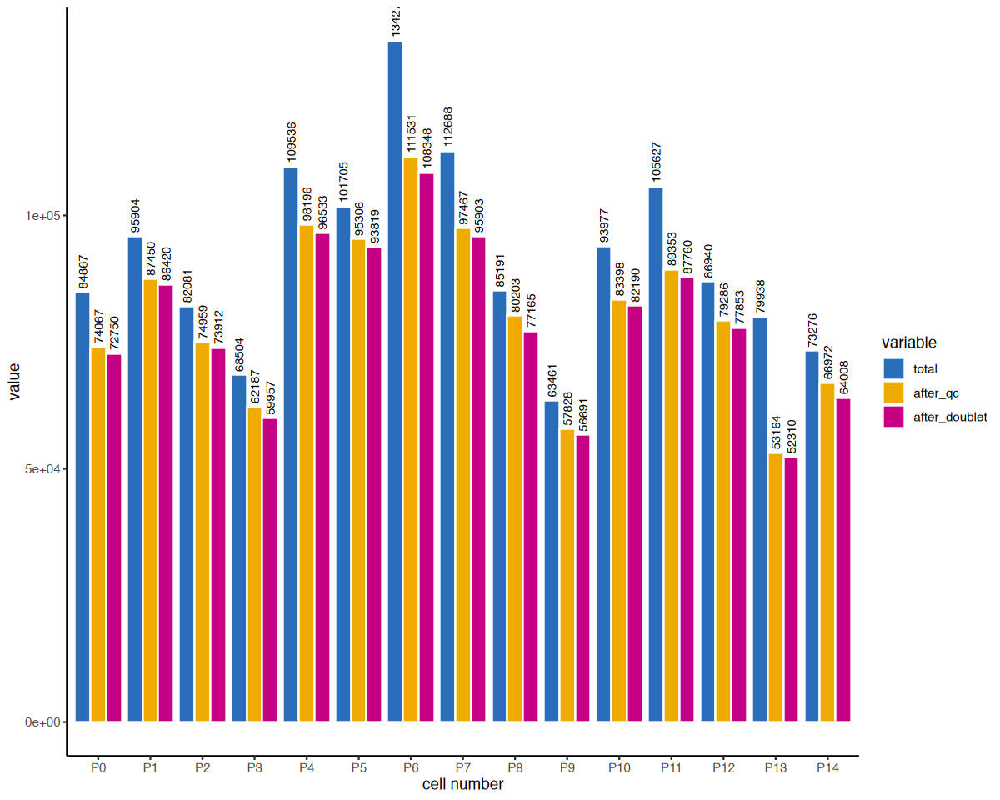

In [255]:
a=qc_res %>%
  mutate(variable=factor(variable, levels=(c('total', 'after_qc', 'after_doublet')))) %>%
  ggplot(aes(y=value, x=Time,fill=variable))+
  geom_bar(color='white',stat='identity', position = 'dodge', width=0.9)+
  geom_text(aes(label=value),
            size=3,
            position = position_dodge(width =0.9), hjust=-0.1, angle=90)+
  scale_fill_bmj()+
  labs(x='cell number')+
  #scale_fill_manual(values = c('total', 'after_qc', 'after_doublet'))+
  #scale_x_continuous(expand = expansion(mult = c(0,0.3)))+
  theme_classic()
a

In [256]:
ggsave(glue('{output_dir}/quality_filtered_cell_steps.pdf'), a,
       width=180, height=60, units='mm', dpi=600, bg='transparent')

## sample_qc_violin_plot

In [138]:
# -----sample_qc_violin_plot----------------------------------------------------------
# define lable fun
give.n = function(x) {
  la.df = data.frame(y = mean(x)+ max(x) / 10,label = round(mean(x), 2));
  return(la.df)
}
# umap = read.csv('./placeholder_analysis/round_cluster02/merge/cell_meta.csv')
# sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)
# umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
# umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
# rownames(umap) = umap$X

In [149]:
median(umap$n_fragment)

[1] 3489

In [150]:
mean(umap$n_fragment)

[1] 4159.938

In [164]:
mean(umap$tsse)

[1] 20.96231

In [165]:
a=umap %>%
  ggplot(aes(x=Time, y=n_fragment))+
  geom_violin(aes(fill=Time), size=0.1,trim = TRUE)+
  scale_fill_manual(values = time_color2)+
  theme_classic()+
  #stat_summary(fun = mean, geom = "point", col = "black") +  # Add points to plot
  #stat_summary(fun.data = give.n,size = 3,position = 'identity',
  #             geom = "text",
  #             col = "black")+
  #theme(axis.text.x = element_text(angle=60, hjust = 1,vjust = 1))+
  NoLegend()
b=umap %>%
  ggplot(aes(x=Time, y=n_peaks))+
  geom_violin(aes(fill=Time), size=0.1,trim = TRUE)+
  scale_fill_manual(values = time_color2)+
  theme_classic()+
  #stat_summary(fun = mean, geom = "point", col = "black") +  # Add points to plot
  #stat_summary(fun.data = give.n,size = 3,position = 'identity',
  #             geom = "text",
  #             col = "black")+
  #theme(axis.text.x = element_text(angle=60, hjust = 1,vjust = 1))+
  NoLegend()
c=umap %>%
  ggplot(aes(x=Time, y=tsse))+
  geom_violin(aes(fill=Time), size=0.1,trim = TRUE)+
  scale_fill_manual(values = time_color2)+
  theme_classic()+
  #stat_summary(fun = mean, geom = "point", col = "black") +  # Add points to plot
  #stat_summary(fun.data = give.n,size = 3,position = 'identity',
  #             geom = "text",
  #             col = "black")+
  #theme(axis.text.x = element_text(angle=60, hjust = 1,vjust = 1))+
  NoLegend()
d=umap %>%
  ggplot(aes(x=Time, y=Frip))+
  geom_violin(aes(fill=Time), size=0.1,trim = TRUE)+
  scale_fill_manual(values = time_color2)+
  theme_classic()+
  #stat_summary(fun = mean, geom = "point", col = "black") +  # Add points to plot
  #stat_summary(fun.data = give.n,size = 3,position = 'identity',
  #             geom = "text",
  #             col = "black")+
  #theme(axis.text.x = element_text(angle=60, hjust = 1,vjust = 1))+
  NoLegend()

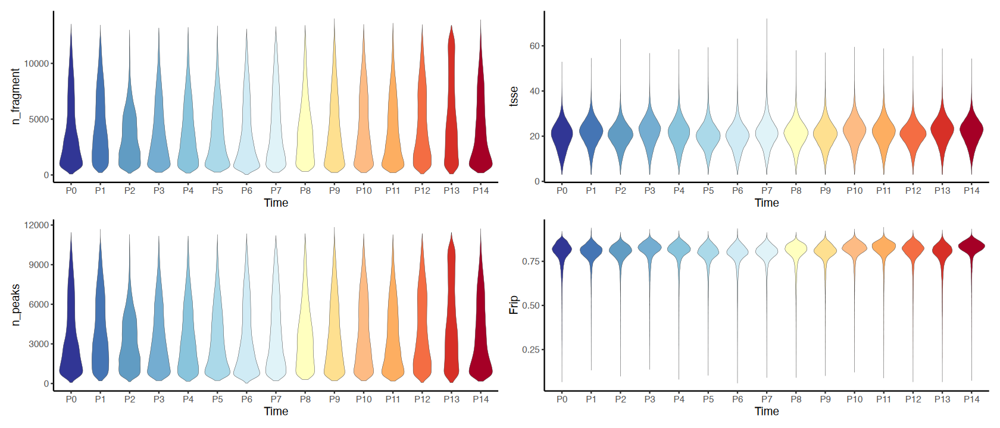

In [166]:
options(repr.plot.width=14, repr.plot.height=6)
a = ((a/b)|(c/d)) #+ plot_layout(align='hv')
#a=::plot_grid(a,b,c,d, ncol=2)
a

In [167]:
ggsave(glue('{output_dir}/quality_metric_violin.pdf'), a,
       width=240, height=80, units='mm', dpi=600, bg='transparent')

# subcluster_umap_per_group

In [168]:
all_umap = read.csv('./placeholder_analysis/round_cluster02/merge/cell_meta.csv')
sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)
all_umap$sample_id = factor(sample_info[all_umap$sample, 'sample_time'], levels=sample_levels)
all_umap$Time = factor(sample_info[all_umap$sample, 'Time'], levels=time_levels)
rownames(all_umap) = all_umap$X

## Immune

In [179]:
base_path='./placeholder_analysis/round_cluster02/round1/Immune/'
umap = read.csv(glue('{base_path}/cell_meta_ann.csv'))
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

same_bc = intersect(umap$X,all_umap$X)

umap[same_bc, 'Celltype_round4'] = all_umap[same_bc, 'Celltype_round4']

umap = umap[same_bc, ]

In [990]:
a = myDimPlot(umap, groupby='Time', label=FALSE, group_color=time_color2, point_size=0.4)
ggsave(glue('{output_dir}/subcluster_umap_immune_time_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/subcluster_umap_immune_time_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [991]:
a = myDimPlot(umap, groupby='Celltype_round4', label=FALSE, group_color=expanded_colors, point_size=0.4)
ggsave(glue('{output_dir}/subcluster_umap_Immune_round4_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/subcluster_umap_immune_round4_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [180]:
a = myDimPlot(umap, groupby='Celltype_round2', label=FALSE, group_color=pal_igv()(10), point_size=1)
ggsave(glue('{output_dir}/subcluster_umap_immune_round2_cells.png'), a,
       width=180, height=160, units='mm', dpi=600, bg='transparent')

In [172]:
base_path='./placeholder_analysis/round_cluster02/round2/Tcell/'
umap = read.csv(glue('{base_path}/cell_meta_ann.csv'))
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

same_bc = intersect(umap$X,all_umap$X)

umap[same_bc, 'Celltype_round4'] = all_umap[same_bc, 'Celltype_round4']

umap = umap[same_bc, ]

In [176]:
a = myDimPlot(umap, groupby='Celltype_round3', label=FALSE, group_color=pal_igv()(10), point_size=1)
ggsave(glue('{output_dir}/subcluster_umap_immune_round3_cells.png'), a,
       width=180, height=160, units='mm', dpi=600, bg='transparent')

In [177]:
base_path='./placeholder_analysis/round_cluster02/round3/CD8/'
umap = read.csv(glue('{base_path}/cell_meta_ann.csv'))
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

same_bc = intersect(umap$X,all_umap$X)

umap[same_bc, 'Celltype_round4'] = all_umap[same_bc, 'Celltype_round4']

umap = umap[same_bc, ]

In [178]:
a = myDimPlot(umap, groupby='Celltype_round4', label=FALSE, group_color=pal_igv()(10), point_size=1)
ggsave(glue('{output_dir}/subcluster_umap_immune_round4_cells.png'), a,
       width=180, height=160, units='mm', dpi=600, bg='transparent')

## Epithelium

In [201]:
base_path='./placeholder_analysis/round_cluster02/round1/Endothelium/'
umap = read.csv(glue('{base_path}/cell_meta_ann.csv'))
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

same_bc = intersect(umap$X,all_umap$X)

umap[same_bc, 'Celltype_round4'] = all_umap[same_bc, 'Celltype_round4']

umap = umap[same_bc, ]

In [202]:
a = myDimPlot(umap, groupby='Time', label=FALSE, group_color=time_color2, point_size=0.4)
ggsave(glue('{output_dir}/subcluster_umap_epithelium_time_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/subcluster_umap_epithelium_time_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [203]:
a = myDimPlot(umap, groupby='Celltype_round4', label=FALSE, group_color=expanded_colors, point_size=0.4)
ggsave(glue('{output_dir}/subcluster_umap_Epithelium_round4_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/subcluster_umap_Epithelium_round4_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

## Endothelium

In [204]:
base_path='./placeholder_analysis/round_cluster02/round1/Epithelium/'
umap = read.csv(glue('{base_path}/cell_meta_ann.csv'))
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

same_bc = intersect(umap$X,all_umap$X)

umap[same_bc, 'Celltype_round4'] = all_umap[same_bc, 'Celltype_round4']

umap = umap[same_bc, ]

In [205]:
a = myDimPlot(umap, groupby='Time', label=FALSE, group_color=time_color2, point_size=0.4)
ggsave(glue('{output_dir}/subcluster_umap_Endothelium_Time_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/subcluster_umap_Endothelium_Time_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [206]:
a = myDimPlot(umap, groupby='Celltype_round4', label=FALSE, group_color=expanded_colors, point_size=0.4)
ggsave(glue('{output_dir}/subcluster_umap_Endothelium_round4_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/subcluster_umap_Endothelium_round4_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

## Stromal

In [207]:
base_path='./placeholder_analysis/round_cluster02/round1/Stroma//'
umap = read.csv(glue('{base_path}/cell_meta_ann.csv'))
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

same_bc = intersect(umap$X,all_umap$X)

umap[same_bc, 'Celltype_round4'] = all_umap[same_bc, 'Celltype_round4']

umap = umap[same_bc, ]

In [208]:
a = myDimPlot(umap, groupby='Time', label=FALSE, group_color=time_color2, point_size=0.4)
ggsave(glue('{output_dir}/subcluster_umap_Stroma_Time_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/subcluster_umap_Stroma_Time_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

In [209]:
a = myDimPlot(umap, groupby='Celltype_round4', label=FALSE, group_color=expanded_colors, point_size=0.4)
ggsave(glue('{output_dir}/subcluster_umap_Stroma_round4_legend.pdf'), get_legend(a),
       width=450, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/subcluster_umap_Stroma_round4_cells.pdf'), a+NoLegend(),
       width=160, height=160, units='mm', dpi=600, bg='transparent')

# cell_type_subcluster_dendrogram_and_differential_accessibility

In [28]:
new_celltype = read.csv('./placeholder_analysis/round_cluster02/merge/celltype_modify.csv')

new_celltype$modify_name = new_celltype$Celltype_round4_new
# new_celltype$modify_name = gsub('Myeloid_', '',new_celltype$modify_name)
# new_celltype$modify_name = gsub('Stroma_', '',new_celltype$modify_name)
# new_celltype$modify_name = gsub('Fibroblast_', 'Fibro_',new_celltype$modify_name)
# new_celltype$modify_name = gsub('Monocytes_', 'Mono_',new_celltype$modify_name)
# new_celltype$modify_name = gsub('Macorphage_', 'Mac_',new_celltype$modify_name)
# 
# new_celltype$modify_name = gsub('Myofibroblast_', 'Myofibro_',new_celltype$modify_name)
# new_celltype$modify_name = gsub('EC_', '',new_celltype$modify_name)
# new_celltype$modify_name = gsub('Airway_', '',new_celltype$modify_name)
# 

In [29]:
head(new_celltype)

,Celltype_round1,Celltype_round2,Celltype_round3,Celltype_round4,n,cluster_num,MainType,SubType,Celltype_round4_new,modify_name
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>
1,Endothelium,EC_Arterial,EC_Arterial_Col4a1,EC_Arterial_Col4a1,9502,86,EC,Arterial,Arterial_Col4a1,Arterial_Col4a1
2,Endothelium,EC_Arterial,EC_Arterial_Gria2,EC_Arterial_Gria2,1025,25,EC,Arterial,Arterial_Gria2,Arterial_Gria2
3,Endothelium,EC_Arterial,EC_Arterial_Lypd6,EC_Arterial_Lypd6,12609,104,EC,Arterial,Arterial_Lypd6,Arterial_Lypd6
4,Endothelium,EC_Grid1,EC_Grid1,EC_Grid1,73130,128,EC,EC,EC_Grid1,EC_Grid1
5,Endothelium,EC_Lfrn1,EC_Lfrn1,EC_Lfrn1,21577,117,EC,EC,EC_Lfrn1,EC_Lfrn1
6,Endothelium,EC_Venous,EC_Venous,EC_Venous,3406,54,EC,Venous,Venous_Nuak1,Venous_Nuak1


In [30]:
all_umap = read.csv('./placeholder_analysis/round_cluster02/merge/cell_meta.csv')
sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)
all_umap$sample_id = factor(sample_info[all_umap$sample, 'sample_time'], levels=sample_levels)
all_umap$Time = factor(sample_info[all_umap$sample, 'Time'], levels=time_levels)
rownames(all_umap) = all_umap$X

tree

In [280]:
# data <- data.frame(
#   level1 = "root",
#   level2 = paste0('r1:',new_celltype$MainType),
#   level3 = paste0('r2:',new_celltype$SubType),
#   level4 = paste0('r3:',new_celltype$cluster_num),
#   level5 = paste0('r4:',new_celltype$MainType,'.',new_celltype$SubType,'.',new_celltype$cluster_num)
# )
# data

In [31]:
data <- data.frame(
  level1 = "root",
  level2 = paste0('r1:',new_celltype$MainType),
  level3 = paste0('r2:',new_celltype$Celltype_round2),
  level4 = paste0('r3:',new_celltype$Celltype_round3),
  level5 = paste0('r4:',new_celltype$modify_name,'.',new_celltype$cluster_num)
)

In [32]:
# data <- data.frame(
#   level1 = "root",
#   level2 = paste0('r1:',all_umap$Celltype_round1),
#   level3 = paste0('r2:',all_umap$Celltype_round2),
#   level4 = paste0('r3:',all_umap$Celltype_round3),
#   level5 = paste0('r4:',all_umap$Celltype_round3,':',all_umap$Celltype_round4)
# )

#data = data[data$level2=='r1:Epithelium',]

# build_hierarchical_relationships:convert_data_to_edge_list
edges <- data %>%
  tidyr::pivot_longer(cols = everything(), names_to = "level", values_to = "node") %>%
  group_by(level) %>%
  mutate(parent = lag(node, default = NA)) %>%
  filter(!is.na(parent)) %>%
  distinct(parent, node) %>%
  ungroup()

edges = edges[edges$level!='level1',]

net <- graph_from_data_frame(edges[,c('parent', 'node')], directed=T)


tree <- as.phylo(net)

In [33]:
branch_col=data[,c('level2','level5')]
branch_col = branch_col[!duplicated(branch_col),]
xx=branch_col$level2
names(xx)=branch_col$level5

celltype_tree <- ggtree(tree, branch.length = 'none')

show_name = c()
levels = c()
for(i in celltype_tree$data$label){
    tmp_x = strsplit(i,':')[[1]]
    show_name = c(show_name, tmp_x[length(tmp_x)])
    levels = c(levels,tmp_x[1])
}

celltype_tree$data$show_name=show_name
celltype_tree$data$levels=levels
celltype_tree$data$branch_group = xx[celltype_tree$data$label]

celltype_tree$data$color_group = sapply(celltype_tree$data$show_name, function(x){
    xx = strsplit(x,'\\.')[[1]]
    as.numeric(xx[length(xx)])
})

In [10]:
celltype_tree$data

parent,node,label,isTip,x,y,branch,angle,show_name,levels,branch_group,color_group
<dbl>,<dbl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
133,1,r4:Arterial_Col4a1.86,TRUE,4,49,3.5,136.74419,Arterial_Col4a1.86,r4,r1:EC,86
134,2,r4:Arterial_Gria2.25,TRUE,4,50,3.5,139.53488,Arterial_Gria2.25,r4,r1:EC,25
135,3,r4:Arterial_Lypd6.104,TRUE,4,51,3.5,142.32558,Arterial_Lypd6.104,r4,r1:EC,104
137,4,r4:EC_Grid1.128,TRUE,4,43,3.5,120.00000,EC_Grid1.128,r4,r1:EC,128
139,5,r4:EC_Lfrn1.117,TRUE,4,44,3.5,122.79070,EC_Lfrn1.117,r4,r1:EC,117
141,6,r4:Venous_Nuak1.54,TRUE,4,64,3.5,178.60465,Venous_Nuak1.54,r4,r1:EC,54
142,7,r4:Venous_Bcorl1.51,TRUE,4,65,3.5,181.39535,Venous_Bcorl1.51,r4,r1:EC,51
143,8,r4:Venous_Cdh13.13,TRUE,4,66,3.5,184.18605,Venous_Cdh13.13,r4,r1:EC,13
144,9,r4:Venous_Jak1.23,TRUE,4,67,3.5,186.97674,Venous_Jak1.23,r4,r1:EC,23


In [11]:
round4_color = readRDS('./placeholder_analysis/round_cluster02/merge/round4_color.rds')
round4_num = readRDS('./placeholder_analysis/round_cluster02/merge/round4_cluster_num.rds')
round4_color2 = round4_color
names(round4_color2) = round4_num[names(round4_color2)]

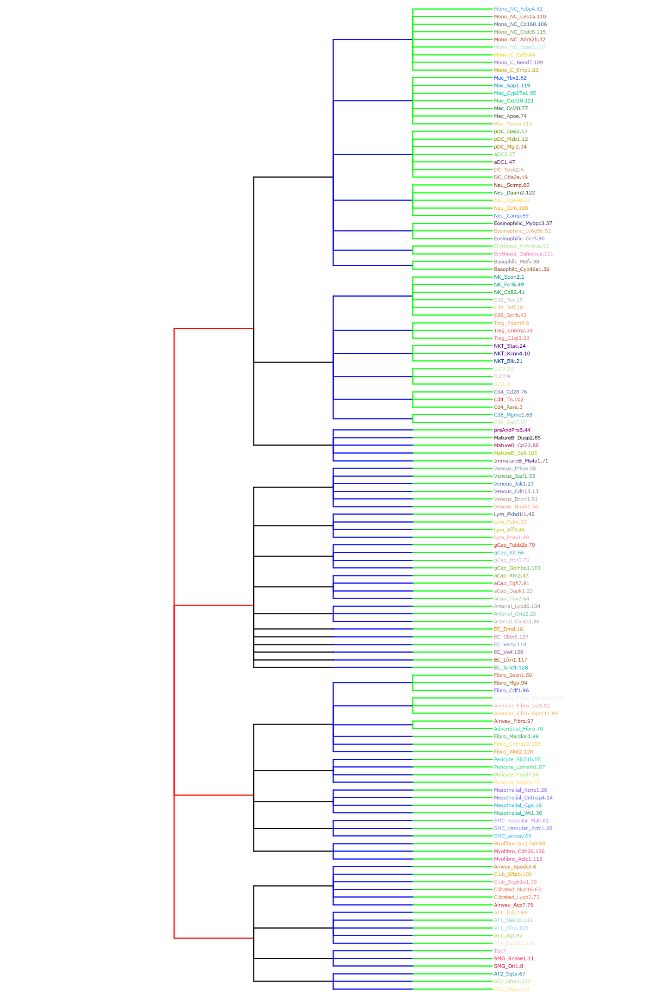

In [34]:
# options(repr.plot.width=12, repr.plot.height=18)
# # use ggtree visualize_tree
# celltype_tree=celltype_tree+aes(color=branch_group)+
#   geom_tiplab(aes(label = show_name)) +
#   geom_text2(aes(label = show_name, subset = !isTip)) +
#     scale_x_continuous(expand = c(0.5,0.1))+
#     scale_color_manual(values=c('New'='black', 'Classical'='gray', 'r1:Immune'='#D7191C',
#                      'r1:Epithelium'='#1F78B4',
#                      'r1:Endothelium'='#FEE08B',
#                      'r1:Stroma'='#A6761D'))
# #celltype_tree
options(repr.plot.width=12, repr.plot.height=18)
# use ggtree visualize_tree
celltype_tree2=celltype_tree+aes(,color=levels)+
  geom_tiplab(aes(label = show_name,color=as.character(color_group)), size=label_size(6)) +
  #geom_text2(aes(label = show_name, subset = !isTip,color=show_name)) +
    scale_x_continuous(expand = c(0.5,0.1))+
    scale_color_manual(values=c('New'='black', 'Classical'='gray', 'r1:Imm'='#D7191C',
                                 'r1:Epi'='#1F78B4',
                                 'r1:EC'='#FEE08B',
                                 'r1:Str'='#A6761D', 
                                'r1'='red', 'r2'='black', 'r3' = 'blue', 'r4'='green',
                                round4_color2))+
    NoLegend()
celltype_tree2

cell_proportion

In [35]:
cluster_num = readRDS('./placeholder_analysis/round_cluster02/merge/round4_cluster_num.rds')

In [36]:
label_odder = celltype_tree$data %>% filter(isTip) %>% arrange(y)
# name_order = sapply(label_odder$label, function(x){
#     xx=strsplit(x,':')[[1]]
#     xx[length(xx)]
# })
name_order = names(cluster_num[label_odder$color_group])
cell_prop_mat = all_umap %>%
    dplyr::group_by(Celltype_round4, Time) %>%
    dplyr::summarise(cell_num=n()) %>%
    reshape2::acast(Celltype_round4~Time, value.var='cell_num',fill = 0)

cell_prop_mat = t(t(cell_prop_mat)/colSums(cell_prop_mat))
cell_prop_mat = cell_prop_mat / rowSums(cell_prop_mat)

`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.


In [37]:
c=melt(cell_prop_mat) %>% 
    mutate(Celltype_round4=factor(Var1, levels = name_order)) %>%
    mutate(Time=factor(Var2, levels = rev(time_levels))) %>%
    ggplot(aes_string(x = 'Celltype_round4', y='value')) + 
    geom_bar(aes_string(fill = 'Time'), stat = "identity") + 
    scale_fill_manual(values = time_color2) + 
    theme_bw() + 
    coord_flip()+
    labs(title = "Time") + 
    theme(panel.grid = element_blank(), 
          axis.title = element_blank(),
          axis.text.y = element_blank(),
         plot.title=element_text(hjust=0.5))
d=all_umap %>%
    dplyr::group_by(Celltype_round4,Celltype_round1) %>%
    dplyr::summarise(number=n()) %>%
    mutate(Celltype_round4=factor(Celltype_round4, name_order)) %>%
    ggplot(aes(x=Celltype_round4, y=log10(number),fill=Celltype_round4))+
    geom_bar(stat='identity', color='white', size=0.1)+
    scale_fill_manual(values = round4_color) + 
    theme_bw() + 
    coord_flip()+
    labs(title = "#Cell(log10)") + 
    theme(panel.grid = element_blank(), 
          axis.title = element_blank(),
          axis.text.y = element_blank(),
          plot.title=element_text(hjust=0.5),
         legend.position='none')


`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.


In [38]:
xx = all_umap %>%
    dplyr::group_by(Celltype_round4,Celltype_round1) %>%
    dplyr::summarise(number=n()) 
median(xx$number)

`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.


[1] 5439

differencepeak and gene

In [39]:
peak_exp_rds = readRDS('./placeholder_analysis/round_cluster02/merge/cluster_gene_avg_expr.rds')

peak_order = peak_exp_rds$right_ann
peak_order$cluster = factor(peak_order$cluster, name_order)
peak_order = peak_order %>% arrange(cluster)

peak_mat = peak_exp_rds$mat[peak_order$gene,name_order]

color_func = circlize::colorRamp2(c(-2,-1.5,0,4,8),c("#2c7bb6",'#abd9e9',"white","#fdae61","#a50026"))
color_range = c(min(peak_mat),max(peak_mat))

peak_exp_plot=melt(peak_mat)%>%
    ggplot(aes(x=Var1,y=Var2, fill=value))+
    geom_tile()+
    scale_fill_gradientn(colors = color_func(color_range[1]:color_range[2]),
                        name='Peak')+
    theme_minimal()+
    labs(title = "Peak") + 
    theme(panel.grid = element_blank(), 
          axis.title = element_blank(),
          plot.title=element_text(hjust=0.5),
          axis.text.x = element_blank(),
         axis.text.y = element_blank())

l1_peak_exp_plot = get_legend(peak_exp_plot)

##########
#gene_exp = read.csv('./placeholder_root/mouse_lung_project/pycode/round_cluster02_gene/cluster_gene_avg_expr.csv')

gene_exp_rds = readRDS('./placeholder_root/mouse_lung_project/pycode/round_cluster02_gene/cluster_gene_avg_expr.rds')

gene_order = gene_exp_rds$right_ann
gene_order$cluster = factor(gene_order$cluster, name_order)
gene_order = gene_order %>% arrange(cluster)

gene_mat = gene_exp_rds$mat[gene_order$gene,name_order]
gene_mat[gene_mat>2] = 2
gene_mat[gene_mat<(-2)] = -2
color_func = circlize::colorRamp2(c(-2,-1,0,1,2),c("#313695",'#74add1',"#ffffbf","#fdae61","#a50026"))
color_range = c(-2,2)

color_func = circlize::colorRamp2(c(-2,-1,0,1,2),c("#440154",'#3b528b',"#21918c","#5dc863","#a50026"))
color_range = c(min(gene_mat),max(gene_mat))
#color_func = circlize::colorRamp2(c(-2,-1,0,1,2),c("#2c7bb6",'#abd9e9',"white","#fdae61","#a50026"))
#color_range = c(min(gene_mat),max(gene_mat))
gene_exp_plot=melt(gene_mat)%>%
    ggplot(aes(x=Var1,y=Var2, fill=value))+
    geom_tile()+
    scale_fill_gradientn(colors = color_func(color_range[1]:color_range[2]),
                        name='GA')+
    theme_minimal()+
    labs(title = "Gene activity") + 
    theme(panel.grid = element_blank(), 
          axis.title = element_blank(),
          plot.title=element_text(hjust=0.5),
          axis.text.x = element_blank(),
         axis.text.y = element_blank())

l1_gene_exp_plot = get_legend(gene_exp_plot)


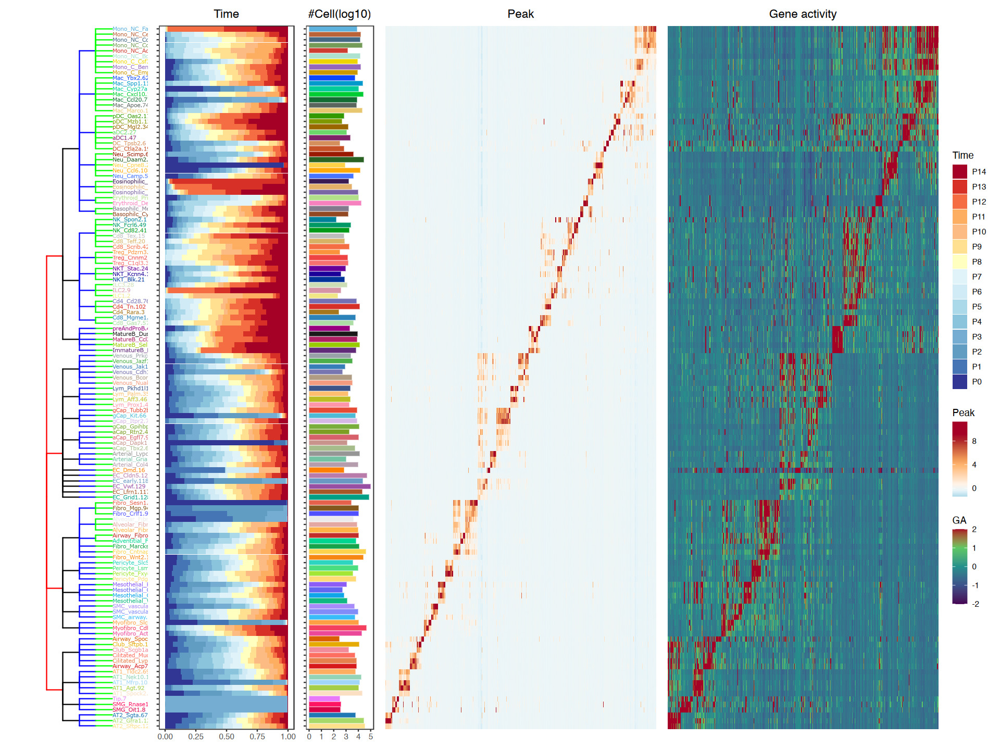

In [40]:
options(repr.plot.width=16, repr.plot.height=12)
( celltype_tree2 | c | d |peak_exp_plot|gene_exp_plot) + 
    plot_layout(guides='collect', widths=c(1,1,0.5,2,2))

In [19]:
a=( celltype_tree2 | c | d |peak_exp_plot|gene_exp_plot) + 
    plot_layout(guides='collect', widths=c(1,1,0.5,2,2))

ggsave(glue('{output_dir}/subcluster_dendrogram_and_accessibility.pdf'), a,
       width=18, height=8, units='in', dpi=600, bg='transparent')

In [372]:
a=( celltype_tree2 | c | d |gene_exp_plot) + 
    plot_layout(guides='collect', widths=c(1,1,0.5,2))

ggsave(glue('{output_dir}/subcluster_dendrogram_and_accessibility2.pdf'), a,
       width=12, height=8, units='in', dpi=600, bg='transparent')

In [269]:
a=( celltype_tree2 | c |d) + 
    plot_layout(guides='collect', widths=c(1,0.3,0.3))

ggsave(glue('{output_dir}/subcluster_dendrogram_and_accessibility3.pdf'), a,
       width=120, height=235, units='mm', dpi=600, bg='transparent')

In [41]:
a=( celltype_tree2 | peak_exp_plot|gene_exp_plot) + 
    plot_layout(guides='collect', widths=c(2,2,2))

ggsave(glue('{output_dir}/subcluster_dendrogram_and_accessibility5.pdf'), a,
       width=16, height=12, units='in', dpi=600, bg='transparent')

In [217]:
ggsave(glue('{output_dir}/subcluster_dendrogram_and_accessibility5.png'), a,
       width=16, height=12, units='in', dpi=600, bg='transparent')

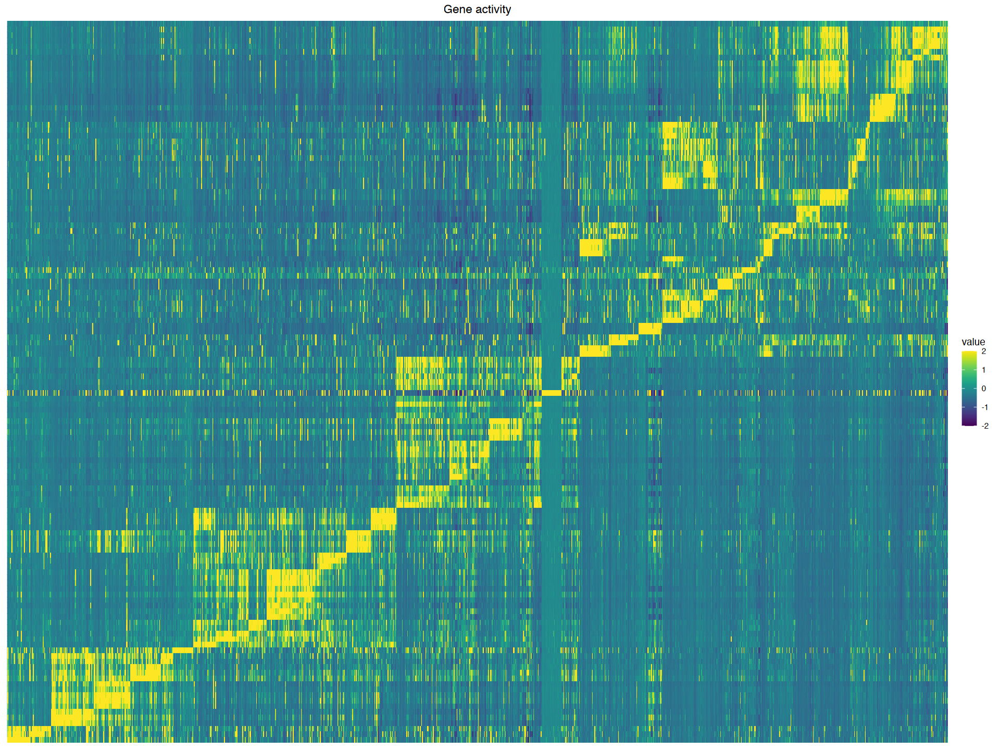

In [375]:
color_func = circlize::colorRamp2(c(-2,-1,0,1,2),c("#440154",'#3b528b',"#21918c","#5dc863","#a50026"))
color_range = c(min(gene_mat),max(gene_mat))
#color_func = circlize::colorRamp2(c(-2,-1,0,1,2),c("#2c7bb6",'#abd9e9',"white","#fdae61","#a50026"))
#color_range = c(min(gene_mat),max(gene_mat))
gene_exp_plot=melt(gene_mat)%>%
    ggplot(aes(x=Var1,y=Var2, fill=value))+
    geom_tile()+
    #scale_fill_gradientn(colors = color_func(color_range[1]:color_range[2]),
    #                    name='GA')+
    scale_fill_viridis()+
    theme_minimal()+
    labs(title = "Gene activity") + 
    theme(panel.grid = element_blank(), 
          axis.title = element_blank(),
          plot.title=element_text(hjust=0.5),
          axis.text.x = element_blank(),
         axis.text.y = element_blank())
gene_exp_plot

In [42]:
au = all_umap %>%
    dplyr::group_by(Celltype_round4,Celltype_round1) %>%
    dplyr::summarise(number=n()) %>%
    as.data.frame()
rownames(au) = au$Celltype_round4
head(au)

`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.


,Celltype_round4,Celltype_round1,number
,<chr>,<chr>,<int>
AT1,AT1,Epithelium,21018
AT1_Agt,AT1_Agt,Epithelium,10315
AT1_Mfrp,AT1_Mfrp,Epithelium,12555
AT1_Nek10,AT1_Nek10,Epithelium,17096
AT1_Tldc2,AT1_Tldc2,Epithelium,6126
AT2,AT2,Epithelium,35205


In [43]:
#
cell_prop_mat = all_umap %>%
    dplyr::group_by(Celltype_round4, Time) %>%
    dplyr::summarise(cell_num=n()) %>%
    reshape2::acast(Celltype_round4~Time, value.var='cell_num',fill = 0)

cell_prop_mat = t(t(cell_prop_mat)/colSums(cell_prop_mat))
cell_prop_mat = cell_prop_mat / rowSums(cell_prop_mat)
rownames(new_celltype) = new_celltype$Celltype_round4
rownames(cell_prop_mat) = paste0(new_celltype[rownames(cell_prop_mat), 'modify_name'],
                                '.',
                                new_celltype[rownames(cell_prop_mat), 'cluster_num'])

rownames(new_celltype) = paste0(new_celltype$modify_name,
                                '.',
                                new_celltype$cluster_num)

`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.



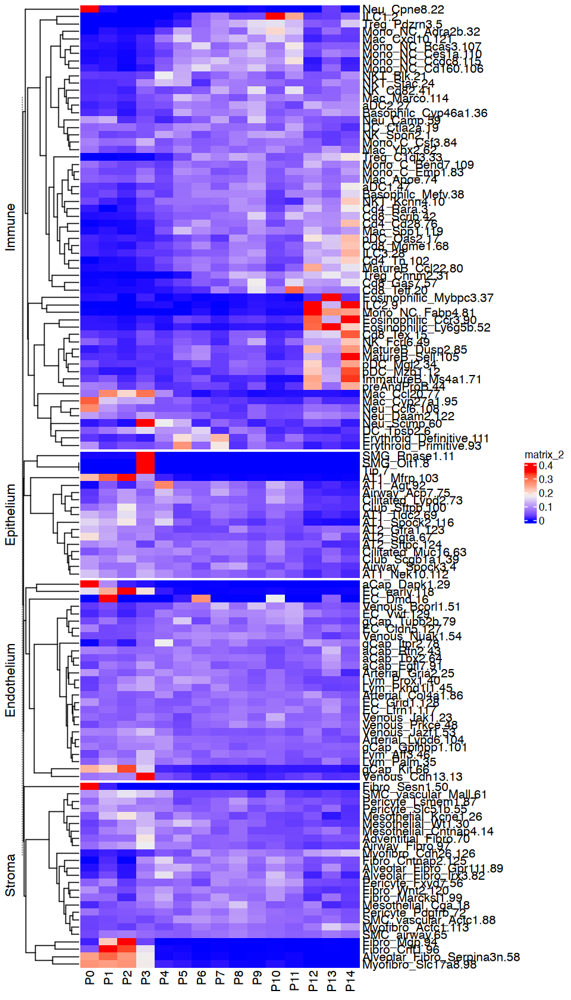

In [44]:
options(repr.plot.width=8, repr.plot.height=14)
ht = Heatmap(cell_prop_mat,cluster_columns = F,
       row_split = new_celltype[rownames(cell_prop_mat), 'Celltype_round1'],
       row_dend_width= unit(20, "mm"),
        clustering_distance_rows='canberra'
       )
draw(ht)

In [45]:
tree_top = as.phylo(as.hclust(row_dend(ht,on_slice=T)))
tree_1 = as.phylo(as.hclust(row_dend(ht)[['Immune']]))
tree_2 = as.phylo(as.hclust(row_dend(ht)[['Epithelium']]))
tree_3 = as.phylo(as.hclust(row_dend(ht)[['Endothelium']]))
tree_4 = as.phylo(as.hclust(row_dend(ht)[['Stroma']]))

In [46]:
new_tree = bind.tree(tree_top, tree_1, where=which(tree_top$tip.label=='Immune'))
new_tree = bind.tree(new_tree, tree_2, where=which(new_tree$tip.label=='Epithelium'))
new_tree = bind.tree(new_tree, tree_3, where=which(new_tree$tip.label=='Endothelium'))
new_tree = bind.tree(new_tree, tree_4, where=which(new_tree$tip.label=='Stroma'))
new_tree


Phylogenetic tree with 129 tips and 128 internal nodes.

Tip labels:
  Cd4_Cd28.76, Cd4_Rara.3, Cd4_Tn.102, Cd8_Gas7.57, Cd8_Mgme1.68, Cd8_Scrib.42, ...

Rooted; includes branch length(s).

In [47]:
tree = new_tree

In [48]:
branch_col=data[,c('level2','level5')]
branch_col = branch_col[!duplicated(branch_col),]
xx=branch_col$level2
names(xx)=branch_col$level5

celltype_tree <- ggtree(tree, branch.length = 'none')

show_name = c()
levels = c()
for(i in celltype_tree$data$label){
    tmp_x = strsplit(i,':')[[1]]
    show_name = c(show_name, tmp_x[length(tmp_x)])
    levels = c(levels,tmp_x[1])
}

celltype_tree$data$show_name=show_name
celltype_tree$data$levels=levels
celltype_tree$data$branch_group = xx[celltype_tree$data$label]

celltype_tree$data$color_group = sapply(celltype_tree$data$show_name, function(x){
    xx = strsplit(x,'\\.')[[1]]
    as.numeric(xx[length(xx)])
})

In [49]:
celltype_tree$data

parent,node,branch.length,label,isTip,x,y,branch,angle,show_name,levels,branch_group,color_group
<int>,<int>,<dbl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
163,1,1.5570876,Cd4_Cd28.76,TRUE,13,46,12.5,128.372093,Cd4_Cd28.76,Cd4_Cd28.76,NA,76
161,2,1.6508681,Cd4_Rara.3,TRUE,13,54,12.5,150.697674,Cd4_Rara.3,Cd4_Rara.3,NA,3
167,3,1.4225656,Cd4_Tn.102,TRUE,13,48,12.5,133.953488,Cd4_Tn.102,Cd4_Tn.102,NA,102
169,4,1.9598681,Cd8_Gas7.57,TRUE,13,43,12.5,120.000000,Cd8_Gas7.57,Cd8_Gas7.57,NA,57
166,5,0.9938561,Cd8_Mgme1.68,TRUE,13,51,12.5,142.325581,Cd8_Mgme1.68,Cd8_Mgme1.68,NA,68
161,6,1.6508681,Cd8_Scrib.42,TRUE,13,55,12.5,153.488372,Cd8_Scrib.42,Cd8_Scrib.42,NA,42
169,7,1.9598681,Cd8_Teff.20,TRUE,13,44,12.5,122.790698,Cd8_Teff.20,Cd8_Teff.20,NA,20
178,8,1.3257488,Cd8_Tex.15,TRUE,13,17,12.5,47.441860,Cd8_Tex.15,Cd8_Tex.15,NA,15
189,9,2.3375131,Erythroid_Definitive.111,TRUE,13,11,12.5,30.697674,Erythroid_Definitive.111,Erythroid_Definitive.111,NA,111


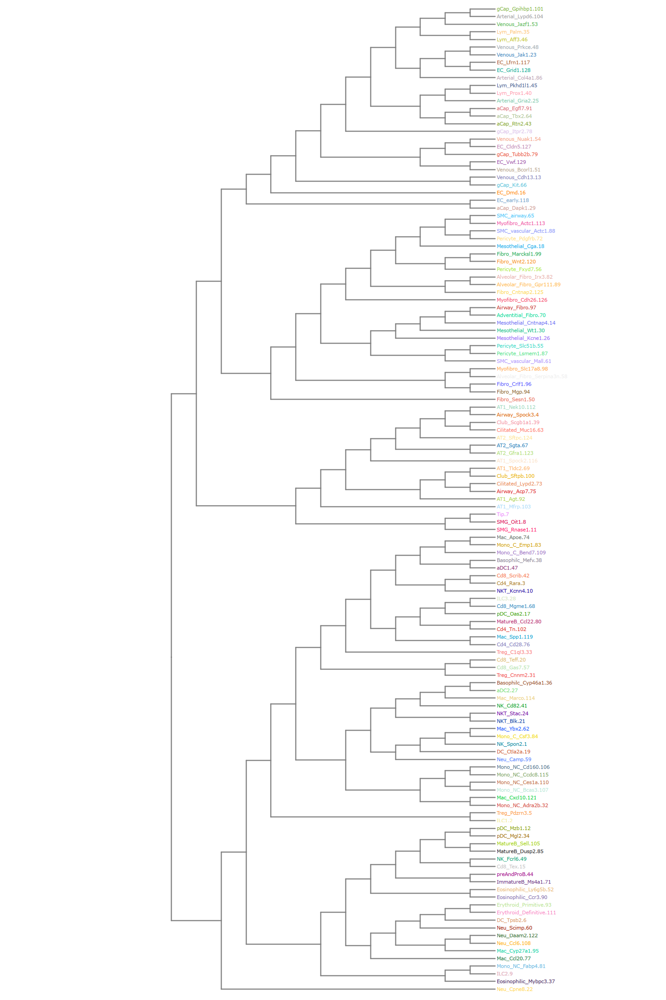

In [50]:
options(repr.plot.width=12, repr.plot.height=18)
# use ggtree visualize_tree
celltype_tree2=celltype_tree+aes(,color=levels)+
  geom_tiplab(aes(label = show_name,color=as.character(color_group)), size=label_size(6)) +
  #geom_text2(aes(label = show_name, subset = !isTip,color=show_name)) +
    scale_x_continuous(expand = c(0.5,0.1))+
    scale_color_manual(values=c('New'='black', 'Classical'='gray', 'r1:Imm'='#D7191C',
                                 'r1:Epi'='#1F78B4',
                                 'r1:EC'='#FEE08B',
                                 'r1:Str'='#A6761D', 
                                'r1'='red', 'r2'='black', 'r3' = 'blue', 'r4'='green',
                                round4_color2))+
    NoLegend()
celltype_tree2

In [51]:
label_odder = celltype_tree$data %>% filter(isTip) %>% arrange(y)

name_order = names(cluster_num[label_odder$color_group])
cell_prop_mat = all_umap %>%
    dplyr::group_by(Celltype_round4, Time) %>%
    dplyr::summarise(cell_num=n()) %>%
    reshape2::acast(Celltype_round4~Time, value.var='cell_num',fill = 0)

cell_prop_mat = t(t(cell_prop_mat)/colSums(cell_prop_mat))
cell_prop_mat = cell_prop_mat / rowSums(cell_prop_mat)

`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.


In [52]:
label_odder

parent,node,branch.length,label,isTip,x,y,branch,angle,show_name,levels,branch_group,color_group
<int>,<int>,<dbl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
131,45,7.3004004,Neu_Cpne8.22,TRUE,13,1,7.5,2.790698,Neu_Cpne8.22,Neu_Cpne8.22,NA,22
171,35,5.0126408,Eosinophilic_Mybpc3.37,TRUE,13,2,12.0,5.581395,Eosinophilic_Mybpc3.37,Eosinophilic_Mybpc3.37,NA,37
172,12,4.3668914,ILC2.9,TRUE,13,3,12.5,8.372093,ILC2.9,ILC2.9,NA,9
172,26,4.3668914,Mono_NC_Fabp4.81,TRUE,13,4,12.5,11.162791,Mono_NC_Fabp4.81,Mono_NC_Fabp4.81,NA,81
183,38,5.5727608,Mac_Ccl20.77,TRUE,13,5,10.5,13.953488,Mac_Ccl20.77,Mac_Ccl20.77,NA,77
185,40,2.4402948,Mac_Cyp27a1.95,TRUE,13,6,12.0,16.744186,Mac_Cyp27a1.95,Mac_Cyp27a1.95,NA,95
186,44,1.1790662,Neu_Ccl6.108,TRUE,13,7,12.5,19.534884,Neu_Ccl6.108,Neu_Ccl6.108,NA,108
186,46,1.1790662,Neu_Daam2.122,TRUE,13,8,12.5,22.325581,Neu_Daam2.122,Neu_Daam2.122,NA,122
187,47,3.8312142,Neu_Scimp.60,TRUE,13,9,11.5,25.116279,Neu_Scimp.60,Neu_Scimp.60,NA,60


In [53]:
name_order

[1] "Myeloid_Neutrophils_Cpne8"     "Myeloid_Eosinophilic_Mybpc3"  
  [3] "ILC2"                          "Monocytes_NonClassical_Fabp4" 
  [5] "Myeloid_Macorphage_Ccl20"      "Myeloid_Macorphage_Cyp27a1"   
  [7] "Myeloid_Neutrophils_Ccl6"      "Myeloid_Neutrophils_Daam2"    
  [9] "Myeloid_Neutrophils_Scimp"     "Myeloid_DC_Tpsb2"             
 [11] "Erythroid_Definitive"          "Erythroid_primitive"          
 [13] "Myeloid_Eosinophilic"          "Myeloid_Eosinophilic_Ly6g5b"  
 [15] "ImmatureB"                     "preAndProB"                   
 [17] "Cd8_Tex"                       "NK_Fcrl6"                     
 [19] "MatureB_(Cd5+)Dusp2"           "MatureB(Cd5-)"                
 [21] "Myeloid_pDC_Mgl2"              "Myeloid_pDC_Mzb1"             
 [23] "ILC1"                          "Treg_Pdzrn3"                  
 [25] "Monocytes_NonClassical_Adra2b" "Myeloid_Macorphage_Cxcl10"    
 [27] "Monocytes_NonClassical"        "Monocytes_NonClassical_Ces1a" 
 [29] "Monocytes_NonClassical_Ccdc8"  "Monocytes_NonClassical_Cd160" 
 [31] "Myeloid_Neutrophils_Camp"      "Myeloid_DC_Ctla2a"            
 [33] "NK_Spon2"                      "Monocytes_Classical_Csf3"     
 [35] "Myeloid_Macorphage_Ybx2"       "NKT"                          
 [37] "NKT_Stac"                      "NK_Cd82"                      
 [39] "Myeloid_Macorphage"            "Myeloid_aDC2"                 
 [41] "Myeloid_Basophilc_Cyp46a1"     "Treg_Cnnm2"                   
 [43] "Cd8_Gas7"                      "Cd8_Teff"                     
 [45] "Treg_C1ql3"                    "Cd4_c0"                       
 [47] "Myeloid_Macorphage_Spp1"       "Cd4_Tn"                       
 [49] "MatureB_(Cd5+)Ccl22"           "Myeloid_pDC_Oas2"             
 [51] "Cd8_Mgme1"                     "ILC3"                         
 [53] "NKT_Kcnn4"                     "Cd4_Rara"                     
 [55] "Cd8_Scrib"                     "Myeloid_aDC1"                 
 [57] "Myeloid_Basophilc_Mefv"        "Monocytes_Classical_Bend7"    
 [59] "Monocytes_Classical"           "Myeloid_Macorphage_Apoe"      
 [61] "SMG_Rnase1"                    "SMG_Oit1"                     
 [63] "Tip"                           "AT1_Mfrp"                     
 [65] "AT1_Agt"                       "Airway_Acp7"                  
 [67] "Airway_Cilitated_Lypd2"        "Airway_Club_Sftpb"            
 [69] "AT1_Tldc2"                     "AT1"                          
 [71] "AT2_Gfra1"                     "AT2_Sgta"                     
 [73] "AT2"                           "Airway_Cilitated_Muc16"       
 [75] "Airway_Club_Scgb1a1"           "Airway_Spock3"                
 [77] "AT1_Nek10"                     "Fibroblast_Wnt2_Mki67_Sesn1"  
 [79] "Fibroblast_Wnt2_Mki67_Mgp"     "Fibroblast_Wnt2_Mki67_Crlf1"  
 [81] "Alveolar_Fibro_Serpina3n"      "Stroma_Myofibroblast_Slc17a8" 
 [83] "Stroma_SMC_vascular_Mall"      "Stroma_Pericyte_Lsmem1"       
 [85] "Stroma_Pericyte_Slc51b"        "Stroma_Mesothelial_Kcne1"     
 [87] "Stroma_Mesothelial"            "Stroma_Mesothelial_Cntnap4"   
 [89] "Stroma_Adventitial_Fibroblast" "Stroma_Airway_Fibroblast"     
 [91] "Stroma_Myofibroblast_Cdh26"    "Stroma_Fibroblast_Cntnap2"    
 [93] "Alveolar_Fibro_Gpr111"         "Alveolar_Fibro_Irx3"          
 [95] "Stroma_Pericyte_Fxyd7"         "Stroma_Fibroblast"            
 [97] "Stroma_Fibroblast_Marcksl1"    "Stroma_Mesothelial_Cga"       
 [99] "Stroma_Pericyte"               "Stroma_SMC_vascular_Actc1"    
[101] "Stroma_Myofibroblast_Actc1"    "Stroma_SMC_airway"            
[103] "EC_aCap_Dapk1"                 "EC_early"                     
[105] "Endothelium"                   "EC_gCap_Kit"                  
[107] "EC_Venous_Cdh13"               "EC_Venous_Bcorl1"             
[109] "EC_Vwf"                        "EC_gCap_Tubb2b"               
[111] "EC_endo"                       "EC_Venous"                    
[113] "EC_gCap_Itpr2"                 "EC_aCap_Rtn2"                 
[115] "EC_aC

In [756]:
output_dir

[1] "./placeholder_root/mouse_lung_project/Figures/raw_figure_output/Figure1/"

In [55]:
length(name_order)

[1] 129

In [54]:
write.csv(name_order, glue('{output_dir}/129cells_tree_order.txt'), row.names=F)

In [56]:
c=melt(cell_prop_mat) %>% 
    mutate(Celltype_round4=factor(Var1, levels = name_order)) %>%
    mutate(Time=factor(Var2, levels = rev(time_levels))) %>%
    ggplot(aes_string(x = 'Celltype_round4', y='value')) + 
    geom_bar(aes_string(fill = 'Time'), stat = "identity") + 
    scale_fill_manual(values = time_color2) + 
    theme_bw() + 
    coord_flip()+
    labs(title = "Time") + 
    theme(panel.grid = element_blank(), 
          axis.title = element_blank(),
          axis.text.y = element_blank(),
         plot.title=element_text(hjust=0.5))
d=all_umap %>%
    dplyr::group_by(Celltype_round4,Celltype_round1) %>%
    dplyr::summarise(number=n()) %>%
    mutate(Celltype_round4=factor(Celltype_round4, name_order)) %>%
    ggplot(aes(x=Celltype_round4, y=log10(number),fill=Celltype_round4))+
    geom_bar(stat='identity', color='white', size=0.1)+
    scale_fill_manual(values = round4_color) + 
    theme_bw() + 
    coord_flip()+
    labs(title = "#Cell(log10)") + 
    theme(panel.grid = element_blank(), 
          axis.title = element_blank(),
          axis.text.y = element_blank(),
          plot.title=element_text(hjust=0.5),
         legend.position='none')


`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.


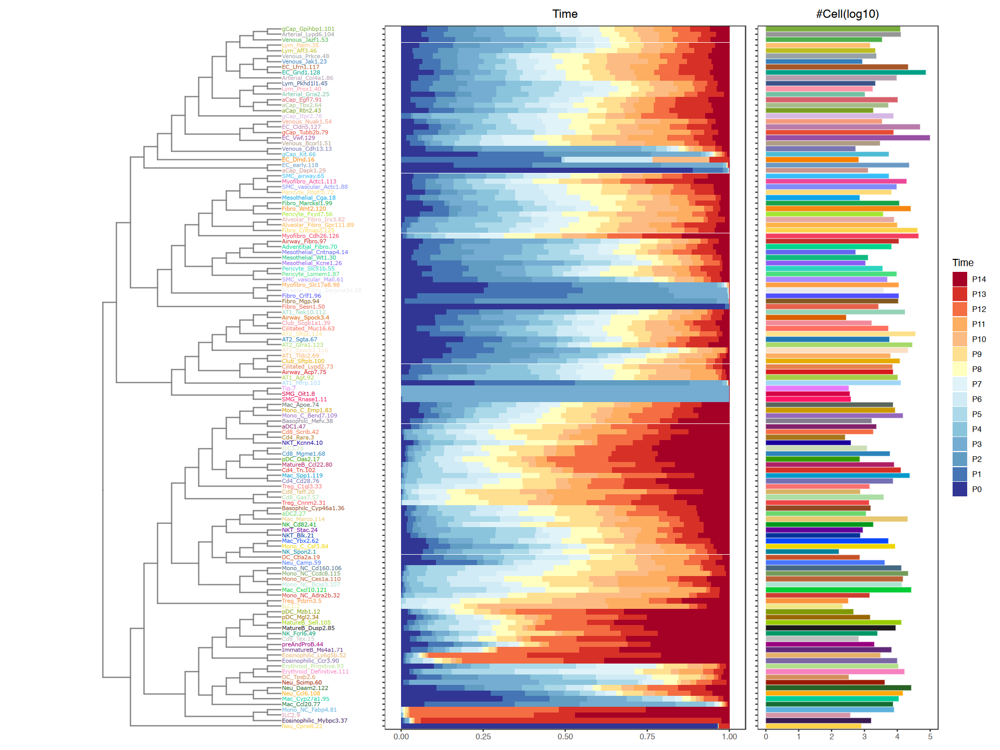

In [57]:
options(repr.plot.width=16, repr.plot.height=12)
( celltype_tree2 | c | d ) + 
    plot_layout(guides='collect', widths=c(1,1,0.5))

In [58]:
a=( celltype_tree2 | c | d ) + 
    plot_layout(guides='collect', widths=c(2,1,1))

ggsave(glue('{output_dir}/subcluster_dendrogram_and_accessibility4.pdf'), a,
       width=4, height=8, units='in', dpi=600, bg='transparent')

# gene_activity_clustering_modules

In [62]:
umap = read.csv('./placeholder_analysis/round_cluster02/merge/cell_meta.csv')
sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

In [ ]:
# usepython
# Figure1_gene_activityNMF

In [59]:
nmf_res = read.csv('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_meta_sample20wcells.csv')

In [27]:
head(nmf_res)

,X,sample,leiden_0.1,leiden_0.2,leiden_0.3,leiden_0.4,leiden_0.5,leiden_0.6,leiden_0.7,leiden_0.8,⋯,M9,M10,M11,M12,M13,M14,M15,M16,M17,M18
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AS240617_TAGCATGCATTCATTG-23,AS240617,4,4,4,4,4,4,4,4,⋯,0.24870764,1.1515432,-0.3135118,6.2693948,-0.788235675,0.03909091,-0.4378198,-0.57839423,-0.4743149,1.01804848
2,AS241018_CCGCTTACATTCAGGA-41,AS241018,0,0,0,0,6,0,7,0,⋯,-0.04504429,-0.1511546,-1.4301578,0.8411721,0.005688014,-0.43240252,2.1652663,0.00587559,0.2244556,-0.07557866
3,AS240617_GGTCCGTGTTACTTCT-14,AS240617,14,15,18,16,20,21,19,24,⋯,-0.86965748,-1.0682063,-2.9683311,-5.4432276,-1.855255039,-2.47333049,-2.2135542,-0.83589082,-1.5516630,-2.40005872
4,AS240828_TTCTGGCAGCATCCTA-24,AS240828,1,1,1,1,1,11,8,11,⋯,-0.65990674,0.4256633,1.3644216,8.0490862,0.071604989,2.05140138,-0.1623450,-0.41894893,-0.0155493,-0.20580232
5,AS240425_TTTAACGGTTTGTAGC-1,AS240425,9,9,9,9,13,14,14,15,⋯,-2.40551277,-1.1544145,-4.5413951,-0.3426034,-3.798320810,-3.51062988,-3.4813758,-1.80790577,-1.2829765,1.73319695
6,AS241017_ACCGGTTTCATGGTCC-1,AS241017,0,0,0,0,0,0,0,0,⋯,-0.28113740,-0.6663743,-1.4897133,1.3221725,-0.128675870,-0.67518961,2.9451245,0.25395033,-0.1666825,1.32544746


In [63]:

#keep_module = setdiff(1:16, c(1,2,7,10,11,13,14,15))
#keep_module

tmp_nmf_score = nmf_res[, paste0('M', 1:18)]
colnames(tmp_nmf_score) = paste0('M',1:ncol(tmp_nmf_score))

moudle_cell = apply(tmp_nmf_score,1,which.max)

moudle_cell = colnames(tmp_nmf_score)[moudle_cell]
names(moudle_cell) = nmf_res$X

nmf_res$cell_module = moudle_cell

nmf_umap = umap[umap$X%in%nmf_res$X, ]

nmf_umap$NMF_modules = moudle_cell[nmf_umap$X]

nmf_umap[, c('UMAP_1', 'UMAP_2')] = nmf_umap[, c('TSNE_1', 'TSNE_2')]

module_color = pal_igv()(19)
#module_color = module_color[c(12,16,3,4,5,6,8,9)]
names(module_color) = colnames(tmp_nmf_score)

In [66]:
write.csv(nmf_umap, './placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_meta_sample20wcells2.csv')
#nmf_umap = read.csv( './placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_meta_sample20wcells2.csv')

In [64]:
rownames(nmf_umap) = nmf_umap$X

In [65]:
head(nmf_umap)

,X,sample,leiden_0.1,leiden_0.2,leiden_0.3,leiden_0.4,leiden_0.5,leiden_0.6,leiden_0.7,leiden_0.8,⋯,sample_id,leiden,UMAP_1,UMAP_2,TSNE_1,TSNE_2,UMAP3_1,UMAP3_2,UMAP3_3,NMF_modules
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AS240819_AAACAAGCAATCATGG-20,AS240819_AAACAAGCAATCATGG-20,AS240819,3,3,3,3,3,2,2,1,⋯,0819_P5,2,-25.711088,-9.200516,-25.711088,-9.200516,1.651417,7.1720300,11.672868,M1
AS240819_AAACAAGCACCAGCTC-42,AS240819_AAACAAGCACCAGCTC-42,AS240819,2,2,2,2,2,1,1,3,⋯,0819_P5,5,-25.223602,16.273615,-25.223602,16.273615,-1.249130,11.0288940,7.271798,M1
AS240819_AAACAAGCACCTGTAT-15,AS240819_AAACAAGCACCTGTAT-15,AS240819,0,0,14,14,16,15,17,17,⋯,0819_P5,3,17.803139,9.114946,17.803139,9.114946,-3.483480,-1.7224338,9.192146,M2
AS240819_AAACAAGCAGTATTGG-43,AS240819_AAACAAGCAGTATTGG-43,AS240819,0,0,0,0,6,7,7,7,⋯,0819_P5,3,-3.438633,8.957162,-3.438633,8.957162,-4.056892,-0.1552631,5.890332,M2
AS240819_AAACCAGGTCACGCAC-9,AS240819_AAACCAGGTCACGCAC-9,AS240819,4,4,4,4,4,4,4,4,⋯,0819_P5,4,29.044210,-3.574658,29.044210,-3.574658,8.489506,-1.3104591,5.851375,M3
AS240819_AAACCAGGTGAACAAT-48,AS240819_AAACCAGGTGAACAAT-48,AS240819,2,14,17,15,19,20,18,23,⋯,0819_P5,21,-12.079161,6.691032,-12.079161,6.691032,1.155687,6.9258265,7.200333,M10


In [31]:
table(nmf_umap$NMF_modules)


   M1   M10   M11   M12   M14   M15   M16   M17   M18    M2    M3    M4    M5 
46355  7697     7   637   110     2  4491  6824  4736 49696 37823 27346    74 
   M6    M7    M8    M9 
  215  6245     1  7741 

In [661]:
a = myDimPlot(nmf_umap, groupby='NMF_modules', group_color = module_color,label=FALSE, point_size=0.2)
ggsave(glue('{output_dir}/major_cluster_tsne_NMF_cells.png'), a+NoLegend(),
       width=60, height=60, units='mm', dpi=600, bg='transparent')

In [662]:
# TSNE Time
a = myDimPlot(nmf_umap, groupby='NMF_modules', group_color = module_color,label=FALSE, point_size=0.2)
ggsave(glue('{output_dir}/major_cluster_tsne_NMF_legend.pdf'), get_legend(a),
       width=150, height=150, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/major_cluster_tsne_NMF_cells.pdf'), a+NoLegend(),
       width=60, height=60, units='mm', dpi=600, bg='transparent')

In [67]:
nmf_umap = read.csv('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_meta_sample20wcells2.csv')

In [68]:
nmf_res  = read.csv('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_meta_sample20wcells.csv')

In [69]:
tmp_nmf_score = nmf_res[, paste0('M', 1:18)]
rownames(tmp_nmf_score) = nmf_res$X

In [70]:
nmf_umap[, colnames(tmp_nmf_score)] = tmp_nmf_score[nmf_umap$X,]

In [447]:
options(repr.plot.width=5, repr.plot.height=4)
score_list = list()
for(i in paste0('M', 1:18)){
    tmp_umap = nmf_umap[, c('UMAP_1', 'UMAP_2', i)]
    if(i=='M10'){
    q1 <- quantile(tmp_umap[,i], 0.15)
    q3 <- quantile(tmp_umap[,i], 0.85)
    }else{
    q1 <- quantile(tmp_umap[,i], 0.05)
    q3 <- quantile(tmp_umap[,i], 0.95)
    }

    tmp_umap[,i] <- pmin(pmax(tmp_umap[,i], q1), q3)
    a=tmp_umap %>%
        ggplot(aes(x=UMAP_1, y=UMAP_2))+
        ggrastr::geom_point_rast(aes_string(fill=i),shape=21,stroke=0,size=0.1, alpha=0.1)+
        scale_fill_gradientn(colours=c('#256da0','white','#bf2221'))+
        # scale_fill_gradient2(low='#256da0',mid='white', high = '#bf2221',
        #     limits = c(q1, q3),   # set_color_mapping_range
        #     oob = scales::squish # compress_out_of_range_values_to_bounds)
        #     )+
        labs(title=i)+
        theme_void()+
        theme(legend.key.width = unit(2,'mm'),
             legend.key.height = unit(2,'mm'),
             legend.position='none',
             plot.title=element_text(hjust=0.5, size=6)
             #legend.size=element_text(size=2)
             )
    score_list[[i]]=a
}

a = cowplot::plot_grid(plotlist = score_list, ncol=6)
ggsave(glue('{output_dir}/NMF_scores.pdf'), a,
       width=180, height=90, units='mm', dpi=600, bg='transparent')

In [666]:
options(repr.plot.width=5, repr.plot.height=4)
score_list = list()
for(i in paste0('M',c(13,14,11,8,18,15,16,9,17,5,1,6,4,10,12,3,2,7))){
    tmp_umap = nmf_umap[, c('UMAP_1', 'UMAP_2', i)]
    if(i=='M10'){
    q1 <- quantile(tmp_umap[,i], 0.15)
    q3 <- quantile(tmp_umap[,i], 0.85)
    tmp_umap[,i] <- pmin(pmax(tmp_umap[,i], q1), q3)
    }
    #
    a=tmp_umap %>%
        ggplot(aes(x=UMAP_1, y=UMAP_2))+
        ggrastr::geom_point_rast(aes_string(fill=i),shape=21,stroke=0,size=0.1, alpha=0.1)+
        scale_fill_gradientn(colours=c('#256da0','white','#bf2221'))+
        # scale_fill_gradient2(low='#256da0',mid='white', high = '#bf2221',
        #     limits = c(q1, q3),   # set_color_mapping_range
        #     oob = scales::squish # compress_out_of_range_values_to_bounds)
        #     )+
        labs(title=i)+
        theme_void()+
        theme(legend.key.width = unit(2,'mm'),
             legend.key.height = unit(2,'mm'),
             legend.position='none',
             plot.title=element_text(hjust=0.5, size=6)
             #legend.size=element_text(size=2)
             )
    score_list[[i]]=a
}

a = cowplot::plot_grid(plotlist = score_list, ncol=6)
ggsave(glue('{output_dir}/NMF_scores_raw.pdf'), a,
       width=180, height=90, units='mm', dpi=600, bg='transparent')

## eachmodulefunction

In [71]:

nmf_res_gene = read.csv('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_diffgene_sample20wcells.csv')


In [72]:
rownames(nmf_res_gene) = nmf_res_gene$Gene
head(nmf_res_gene)

,Gene,C,Z,Pval,FDR,module
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Pcdha9,Pcdha9,0.9282891,1758.715,0,0,10
Pcdha8,Pcdha8,0.9303643,1758.075,0,0,10
Pcdha11,Pcdha11,0.9220606,1751.501,0,0,10
Pcdhgb5,Pcdhgb5,0.8902485,1750.121,0,0,7
Pcdhga8,Pcdhga8,0.8902319,1750.012,0,0,7
Pcdhga9,Pcdhga9,0.8892771,1748.638,0,0,7


In [38]:
table(nmf_res_gene$module)


 -1   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18 
  8 520 733 416 259 424 357 340 254 186 163 145 396 164 350 135 119 117 253 

In [140]:
cor_mat_z = read.csv('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_localcor_z_sample20wcells.csv', row.names=1, check.names=F)

In [39]:
gene_module = read.csv('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_modules_sample20wcells.csv', row.names=1)
gene_module = gene_module[gene_module$Module!=(-1),,drop=F]

In [40]:
table(gene_module$Module)


  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18 
520 733 416 259 424 357 340 254 186 163 145 396 164 350 135 119 117 253 

In [143]:
cor_mat_z[1:3,1:3]

,Pcdha9,Pcdha8,Pcdha11
,<dbl>,<dbl>,<dbl>
Pcdha9,0.0000,404.8037,404.0093
Pcdha8,404.8037,0.0000,404.0069
Pcdha11,404.0093,404.0069,0.0000


In [144]:
cor_mat_z2 = cor_mat_z[rownames(gene_module),rownames(gene_module)]

In [145]:
tmp_m = paste0('M',gene_module$Module)
ra = rowAnnotation(df=data.frame(modules=tmp_m))

In [260]:
dim(cor_mat_z2)

[1] 5331 5331

In [182]:
tmp_rate = matrix(0.1, nrow = length(gene_module$Module), ncol=length(gene_module$Module))

In [183]:
for(i in unique(gene_module$Module)){
    tmp_pos = gene_module$Module==i
    tmp_rate[tmp_pos, tmp_pos] = 1
}


In [188]:
after_rate_mat= cor_mat_z2*tmp_rate

In [198]:
dim(cor_mat_z2)

[1] 5331 5331

In [75]:
module_order = c(18,8,11,15,1,5,9,17,13,14,16,10,4,6,3,12,2,7)
module_order_str = paste0('M',module_order)


In [301]:
options(repr.plot.width=6, repr.plot.height=8)

ht = Heatmap(cor_mat_z2,#[1:1000,1:1000],#[get_order(o,1),],
             cluster_rows=F, cluster_columns=F,
             show_row_dend = FALSE, show_column_dend = FALSE,
             show_row_names=F, show_column_names=F,
            #  col=circlize::colorRamp2(c(-10,0,10, 20), c(   "#ffffff",
            #                                                 "#d08f17",
            #                                                 "#a52f00",
            #                                                 "#620000")),
            col=circlize::colorRamp2(c(-60,-50,0,50,60), c("#91BFDB","#E0F3F8",  "#FFFFFF", "#FC8D59", "#D73027")),                                             
             right_annotation=ra,
             row_split = factor(gene_module$Module,module_order),
             column_split = factor(gene_module$Module,module_order),
             row_gap = unit(0, "mm"),           # newly_added:row_group_spacing0
             column_gap = unit(0, "mm"),          # newly_added:column_group_spacing0
             use_raster=T,
             #heatmap_legend_param=list('title'='%Cell\n(z-score)')
             #column_names_rot=0 
)


In [302]:
pdf(glue('{output_dir}/NMF_genecorrelation2.pdf'), width = 12,height = 12)
draw(ht)
dev.off()

pdf 
  2

In [293]:
options(repr.plot.width=6, repr.plot.height=8)

ht = Heatmap(cor_mat_z2,#[get_order(o,1),],
             cluster_rows=F, cluster_columns=F,
             show_row_dend = FALSE, show_column_dend = FALSE,
             show_row_names=F, show_column_names=F,
             col=circlize::colorRamp2(c(-50,-25,0,25,50), c("#91BFDB","#E0F3F8",  "#FFFFFF", "#FC8D59", "#D73027")),
             right_annotation=ra,
             row_split = factor(gene_module$Module,module_order),
             column_split = factor(gene_module$Module,module_order),
             row_gap = unit(0, "mm"),           # newly_added:row_group_spacing0
             column_gap = unit(0, "mm"),          # newly_added:column_group_spacing0
             use_raster=T,
             #heatmap_legend_param=list('title'='%Cell\n(z-score)')
             #column_names_rot=0 
)

In [294]:
pdf(glue('{output_dir}/NMF_genecorrelation.pdf'), width = 12,height = 12)
draw(ht)
dev.off()

pdf 
  2

In [42]:
nmf_gene_list = list()
for(i in 1:18){
    tmp_module = nmf_res_gene[nmf_res_gene$module==i, ]
    tmp_module = tmp_module %>% arrange(Z) 
    nmf_gene_list[[i]] = head(tmp_module$Gene, 200)
}

In [43]:
library(clusterProfiler)
library(org.Hs.eg.db)
mm10_hg38_homoGene = read.csv('./placeholder_root/mouse_lung_project/genome_annotation_file/mm10_hg38_homoGene_ensembl.csv')

clusterProfiler v4.14.0 Learn more at https://yulab-smu.top/contribution-knowledge-mining/

Please cite:

G Yu. Thirteen years of clusterProfiler. The Innovation. 2024,
5(6):100722


Attaching package: 'clusterProfiler'


The following object is masked from 'package:igraph':

    simplify


The following object is masked from 'package:XVector':

    slice


The following objects are masked from 'package:plyr':

    arrange, mutate, rename, summarise


The following object is masked from 'package:purrr':

    simplify


The following objects are masked from 'package:ensembldb':

    filter, select


The following object is masked from 'package:AnnotationDbi':

    select


The following object is masked from 'package:IRanges':

    slice


The following object is masked from 'package:S4Vectors':

    rename


The following object is masked from 'package:stats':

    filter






In [44]:
head(mm10_hg38_homoGene)

,Gene.stable.ID,Human.gene.stable.ID,Human.gene.name,Gene.name
,<chr>,<chr>,<chr>,<chr>
1,ENSMUSG00000064336,,,mt-Tf
2,ENSMUSG00000064337,,,mt-Rnr1
3,ENSMUSG00000064338,,,mt-Tv
4,ENSMUSG00000064339,,,mt-Rnr2
5,ENSMUSG00000064340,,,mt-Tl1
6,ENSMUSG00000064341,ENSG00000198888,MT-ND1,mt-Nd1


In [419]:
all_module_go = c()
for(i in 1:18){
    tmp_gene = nmf_gene_list[[i]]
    tmp_gene_to_hm = mm10_hg38_homoGene[mm10_hg38_homoGene$Gene.name%in%tmp_gene,]
    tmp_gene_id = bitr(tmp_gene_to_hm$Human.gene.name, fromType = 'SYMBOL',
                      toType='ENTREZID', OrgDb='org.Hs.eg.db')
    tmp_go = enrichGO(
        gene=unique(tmp_gene_id$ENTREZID),
        keyType='ENTREZID',
        OrgDb='org.Hs.eg.db',
        ont='ALL',
        readable=TRUE,
    )
    tmp_res = tmp_go@result %>% as.data.frame()
    if(nrow(tmp_res)>0){
        tmp_res$module = i
        all_module_go = rbind(all_module_go, tmp_res)
    }
}

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' ret

In [421]:
tmp_module = nmf_res_gene[nmf_res_gene$module==2, ]
tmp_module = tmp_module %>% arrange(Z) 
tmp_gene = head(tmp_module$Gene, 500)
tmp_gene_to_hm = mm10_hg38_homoGene[mm10_hg38_homoGene$Gene.name%in%tmp_gene,]
tmp_gene_id = bitr(tmp_gene_to_hm$Human.gene.name, fromType = 'SYMBOL',
                  toType='ENTREZID', OrgDb='org.Hs.eg.db')
tmp_go = enrichGO(
    gene=unique(tmp_gene_id$ENTREZID),
    keyType='ENTREZID',
    OrgDb='org.Hs.eg.db',
    ont='ALL',
    readable=TRUE,
)
tmp_res = tmp_go@result %>% as.data.frame()

'select()' returned 1:1 mapping between keys and columns



In [423]:
tmp_res$module = 2
all_module_go = rbind(all_module_go, tmp_res)

In [425]:
write.table(all_module_go, '../share_go.txt', sep='\t', row.names = F)

In [45]:
all_module_go = read.table('../share_go.txt', sep='\t', header = T)

In [263]:
dim(all_module_go)

[1] 1850   14

In [264]:
table(all_module_go$module)


  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18 
239 226 207  97  42   7  89  28 377 190  20 128  16  31   2  65  41  45 

In [669]:
head(all_module_go)

,ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,module
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>
1,BP,GO:0050766,positive regulation of phagocytosis,11/178,73/18986,0.15068493,16.072495,12.551926,7.752080e-11,1.254579e-07,1.040496e-07,NCKAP1L/IL15/SIRPG/SIRPB1/SIRPA/CFP/FCGR2C/FCGR2A/FCGR2B/CLEC7A/FCER1G,11,1
2,BP,GO:0045088,regulation of innate immune response,23/178,470/18986,0.04893617,5.219675,9.011526,9.676663e-11,1.254579e-07,1.040496e-07,CD274/CPT1A/NLRC4/NLRX1/IKBKE/TIFAB/TRAF3/TNFAIP3/NFE2L2/PIM1/TNIP1/FCGR2B/CTSS/MEFV/PYHIN1/IFI16/CLEC7A/NLRP1/NCF1/BIRC3/TRIM5/CD300C/MAPKAPK2,23,1
3,BP,GO:0050727,regulation of inflammatory response,21/178,438/18986,0.04794521,5.113976,8.474113,9.724768e-10,8.405442e-07,6.971123e-07,CD200R1L/CD200R1/IL15/NLRC4/NFKB1/NLRX1/SIRPA/TNFAIP3/TNIP1/FCGR2B/FANCA/FUT7/MEFV/MMP8/NLRP1/NCF1/ABHD12/CCL3/SPN/BIRC3/MAPK14,21,1
4,BP,GO:0050764,regulation of phagocytosis,11/178,102/18986,0.10784314,11.502864,10.346771,3.069091e-09,1.771045e-06,1.468831e-06,NCKAP1L/IL15/SIRPG/SIRPB1/SIRPA/CFP/FCGR2C/FCGR2A/FCGR2B/CLEC7A/FCER1G,11,1
5,BP,GO:0045807,positive regulation of endocytosis,13/178,159/18986,0.08176101,8.720868,9.510823,3.415050e-09,1.771045e-06,1.468831e-06,NCKAP1L/IL15/SIRPG/SIRPB1/SIRPA/CFP/FCGR2C/FCGR2A/FCGR2B/CLEC7A/LDLRAP1/FCER1G/CLN3,13,1
6,BP,GO:0002218,activation of innate immune response,17/178,317/18986,0.05362776,5.720094,8.244488,8.118096e-09,3.508370e-06,2.909696e-06,CD274/NLRC4/NLRX1/IKBKE/TIFAB/TRAF3/TNFAIP3/TNIP1/CTSS/MEFV/PYHIN1/IFI16/CLEC7A/NLRP1/BIRC3/TRIM5/MAPKAPK2,17,1


In [690]:
all_module_go_sig2

ONTOLOGY,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count,module
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>
BP,GO:0035455,response to interferon-alpha,4/127,20/18986,0.2000000,29.89921,10.61111,8.514040e-06,0.02081683,0.01882051,IFITM3/IFITM2/IFITM1/GATA3,4,15
MF,GO:0019992,diacylglycerol binding,3/128,14/18737,0.2142857,31.36775,9.42694,1.072812e-04,0.04001589,0.03794367,UNC13A/RASGRP2/DGKD,3,15


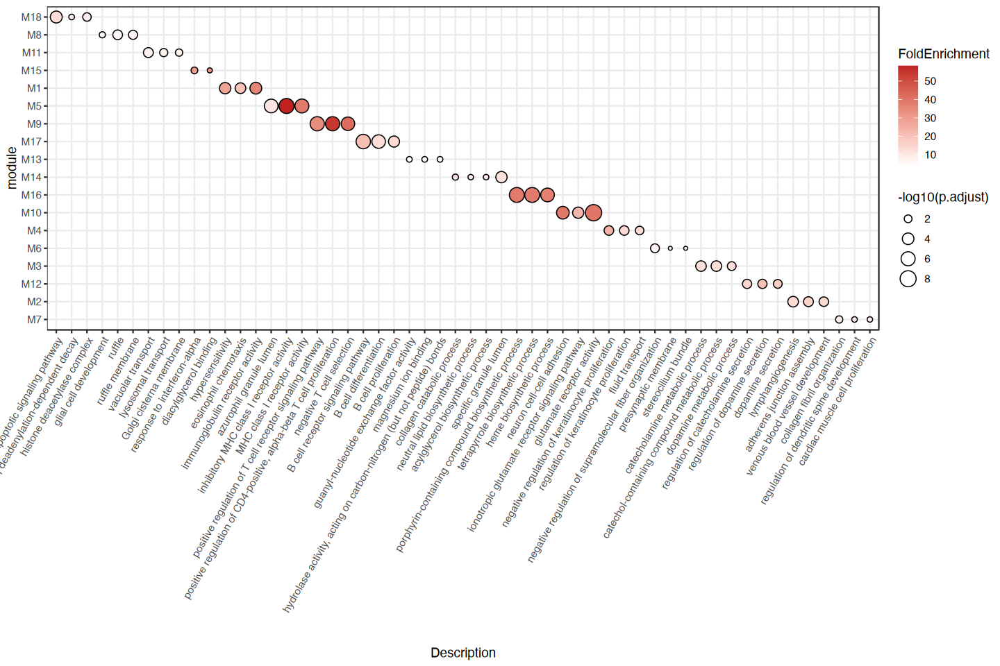

In [49]:
options(repr.plot.width=12, repr.plot.height=8)
all_module_go_sig = all_module_go %>% filter(p.adjust<0.05,Count>=5)

all_module_go_sig2 = all_module_go %>% filter(p.adjust<0.05,Count>=3, module==15)

all_module_go_sig = rbind(all_module_go_sig,all_module_go_sig2)

all_module_go_sig = all_module_go_sig %>%
    group_by(module) %>% 
    top_n(3, FoldEnrichment)

a=all_module_go_sig %>%
    mutate(module=factor(module, module_order)) %>%
    arrange(module) %>%
    mutate(Description=factor(Description, levels=Description)) %>%
    mutate(module = paste0('M',module)) %>%
    mutate(module = factor(module,rev(module_order_str))) %>%
    ggplot(aes(y=module, x=Description, size=-log10(p.adjust), fill=FoldEnrichment))+
    geom_point(shape=21)+
    scale_fill_gradientn(colours = c('white', '#bf2221'))+
    #scale_y_reverse()+
    theme_bw()+
    theme(axis.text.x=element_text(angle=60, hjust=1, vjust=1))

 a   

In [50]:
ggsave(glue('{output_dir}/NMF_module_func.pdf'), a,
       width=230, height=150, units='mm', dpi=600, bg='transparent')

In [695]:
write.csv(all_module_go_sig, glue('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_module_GO_sig.csv'),
     row.names=F)

In [267]:
dim(all_module_go_sig)

[1] 54 14

In [710]:
all_module_go_sig = read.csv('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_module_GO_sig.csv')

In [675]:
dim(all_module_go_sig)

[1] 55 14

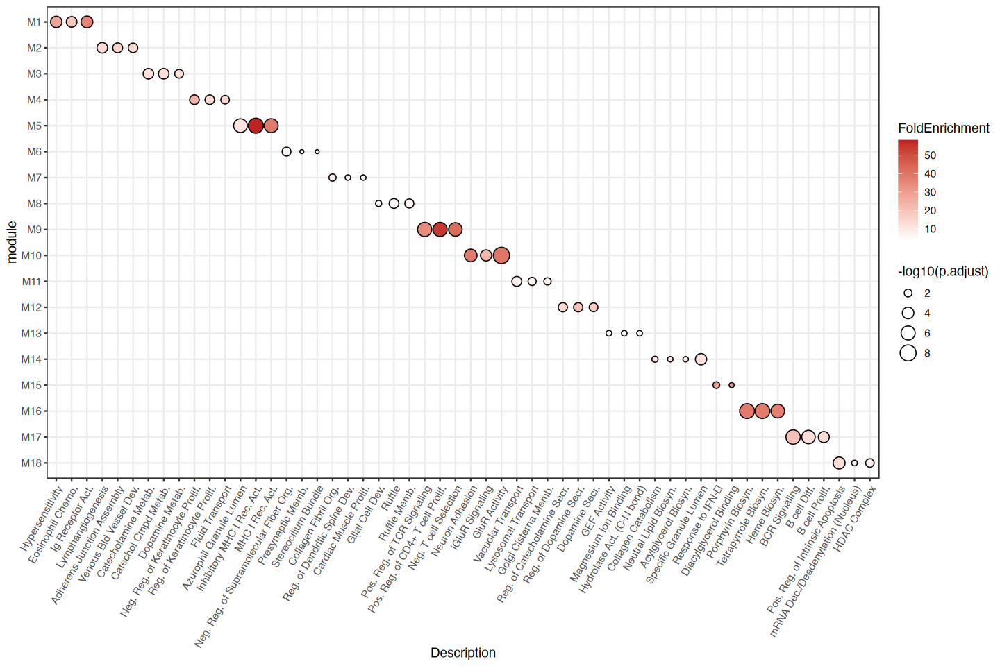

In [705]:
options(repr.plot.width=12, repr.plot.height=8)
a=all_module_go_sig %>%
    mutate(Description=abbr) %>%
    arrange(module) %>%
    mutate(Description=factor(Description, levels=Description)) %>%
    mutate(module = paste0('M',module)) %>%
    mutate(module = factor(module,paste0('M',18:1))) %>%
    ggplot(aes(y=module, x=Description, size=-log10(p.adjust), fill=FoldEnrichment))+
    geom_point(shape=21)+
    #geom_text_repel(aes(label=Description), size=3, box.padding = unit(0.5, "lines"), point.padding = unit(0.5, "lines"),)+
    scale_fill_gradientn(colours = c('white', '#bf2221'))+
    #scale_y_reverse()+
    theme_bw()+
    theme(axis.text.x=element_text(angle=60, hjust=1, vjust=1))

 a   

In [706]:
module_accross = c()
for(i in paste0('M', 1:18)){
    tmp_umap = nmf_umap[, c('Celltype_round1', 'new_name', 'UMAP_2', i)]
    tmp_umap = tmp_umap[tmp_umap[,i]>0,]
    tmp_umap = tmp_umap %>%
        group_by(Celltype_round1,new_name) %>%
        summarise(cell_num=n())
    tmp_umap$module = i
    module_accross = rbind(module_accross, tmp_umap)
}

`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round1'. You can override using the 

`summarise()` has grouped output by 'module'. You can override using the `.groups` argument.


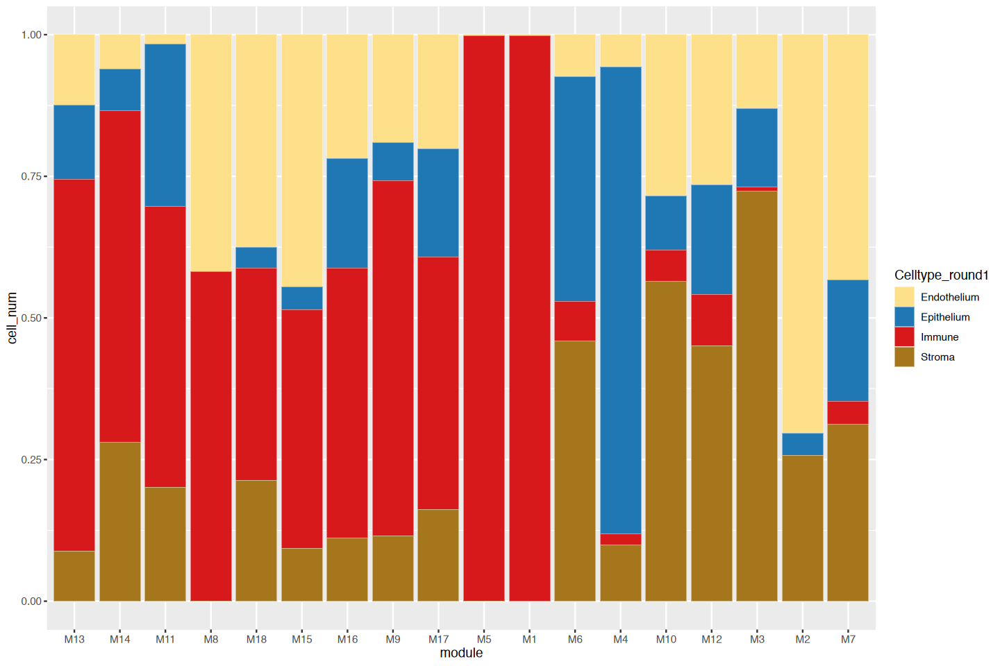

In [707]:
a=module_accross %>%
    group_by(module,Celltype_round1) %>%
    summarise(cell_num=sum(cell_num)) %>%
    mutate(module = factor(module, paste0('M',c(13,14,11,8,18,15,16,9,17,5,1,
                                                6,4,10,12,3,2,7)))) %>%
    ggplot(aes(x=module, y=cell_num, fill=Celltype_round1))+
    geom_bar(stat='identity', position='fill', color='white', size=0.1)+
    scale_fill_manual(values = celltype_round1_color)
a

In [708]:
 ggsave(glue('{output_dir}/NMF_module_cell_prop.pdf'), a,
       width=180, height=80, units='mm', dpi=600, bg='transparent')

In [680]:
tmp_umap = nmf_umap[, c('Celltype_round1', 'new_name', paste0('M', 1:18))]
tmp_umap = melt(tmp_umap, id.vars=c('Celltype_round1', 'new_name'))
tmp_umap = tmp_umap %>%
    group_by(Celltype_round1,new_name, variable) %>%
    summarise(value=mean(value))
plot_list = list()
for(i in paste0('M',c(13,14,11,8,18,15,16,9,17,5,1,6,4,10,12,3,2,7))){
    tmp_umap2 = tmp_umap[tmp_umap$variable==i,]
    a=tmp_umap2 %>% 
        as.data.frame()%>%
        mutate(new_name=fct_reorder(new_name, value)) %>%
        ggplot(aes(x=new_name,y=value, fill=Celltype_round1))+
        geom_bar(stat='identity')+
        labs(title = i, x='Round4_cluster', y='Mean module score')+
        scale_fill_manual(values = celltype_round1_color)+
        theme_bw()+
        theme(axis.text.x=element_blank(),
            axis.ticks.x=element_blank(),
            plot.title=element_text(hjust=0.5),
            plot.background = element_rect(fill = 'white', color = NA),
            panel.grid = element_blank(),
            axis.title = element_text(siz=6)
            )
    plot_list[[i]]=a+NoLegend()
}  

`summarise()` has grouped output by 'Celltype_round1', 'new_name'. You can override using the `.groups` argument.


In [681]:
ggsave(glue('{output_dir}/NMF_module_cluster.pdf'), cowplot::plot_grid(plotlist = plot_list, ncol=6),
       width=230, height=120, units='mm', dpi=600, bg='transparent')

In [682]:
tmp_umap = nmf_umap[, c('Celltype_round1', 'new_name', paste0('M', 1:18))]
tmp_umap = melt(tmp_umap, id.vars=c('Celltype_round1', 'new_name'))
tmp_umap = tmp_umap %>%
    group_by(Celltype_round1,new_name, variable) %>%
    summarise(value=mean(value))
plot_list = list()
for(i in paste0('M',c(13,14,11,8,18,15,16,9,17,5,1,6,4,10,12,3,2,7))){
    tmp_umap2 = tmp_umap[tmp_umap$variable==i,]
    a=tmp_umap2 %>% 
        as.data.frame()%>%
        mutate(new_name=fct_reorder(new_name, value)) %>%
        ggplot(aes(x=new_name,y=value, fill=Celltype_round1))+
        geom_bar(stat='identity', color=NA)+
        labs(title = i, x='Round4_cluster', y='Mean module score')+
        scale_fill_manual(values = celltype_round1_color)+
        theme_bw()+
        theme(axis.text=element_blank(),
            axis.ticks=element_blank(),
            plot.title=element_text(hjust=0.5),
            plot.background = element_blank(),
            panel.grid = element_blank(),
            axis.title = element_blank(),
            )
    plot_list[[i]]=a+NoLegend()

}  
ggsave(glue('{output_dir}/NMF_module_cluster2.pdf'), cowplot::plot_grid(plotlist = plot_list, ncol=6),
       width=230, height=60, units='mm', dpi=600, bg='transparent')

`summarise()` has grouped output by 'Celltype_round1', 'new_name'. You can override using the `.groups` argument.


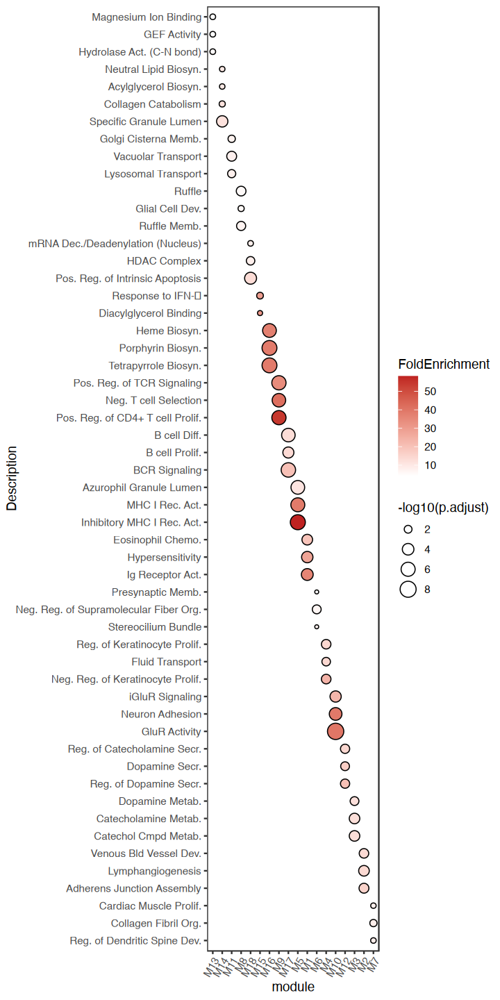

In [719]:
options(repr.plot.width=6, repr.plot.height=12)
mudule_order = paste0('M',c(13,14,11,8,18,15,16,9,17,5,1,6,4,10,12,3,2,7))

xx = all_module_go_sig %>%
    mutate(Description=abbr) %>%
    mutate(module = paste0('M',module)) %>%
    mutate(module = factor(module,mudule_order)) %>%
    arrange(module, FoldEnrichment)
Description_order = rev(xx$Description)
a=all_module_go_sig %>%
    mutate(Description=as.vector(abbr)) %>%
    mutate(module = paste0('M',module)) %>%
    mutate(module = factor(module,mudule_order)) %>%
    arrange(module) %>%
    mutate(Description=factor(Description, levels=Description_order)) %>%
    ggplot(aes(x=module, y=Description, size=-log10(p.adjust), fill=FoldEnrichment))+
    geom_point(shape=21)+
    #geom_text(aes(label=Description), size=3, vjust=1,hjust=1 , angle=90)+
    scale_fill_gradientn(colours = c('white', '#bf2221'))+
    theme_bw()+
    theme(axis.text.x=element_text(angle=60, hjust=1, vjust=1),
     panel.grid = element_blank())

 a   
 ggsave(glue('{output_dir}/NMF_module_func2.pdf'), a,
       width=150, height=230, units='mm', dpi=600, bg='transparent')
 

In [643]:
xx = all_module_go_sig %>%
    mutate(Description=as.vector(go_abbr[Description,'Abbreviation'])) %>%
    mutate(module = paste0('M',module)) %>%
    mutate(module = factor(module,mudule_order)) %>%
    arrange(module)
rev(xx$Description)

[1] "ATPase lipid transporter"         "C–N hydrolase (cyclic amidine)"  
 [3] "C–N hydrolase"                    "granule lumen"                   
 [5] "mitotic exit"                     "collagen catabolism"             
 [7] "endosome lumen"                   "lysosome transport"              
 [9] "vacuolar transport"               "cell trailing edge"              
[11] "early phagosome"                  "uropod"                          
[13] "DAG binding"                      "IFN-α response"                  
[15] "heme a metabolism"                "heme A biosynthesis"             
[17] "PPIX metabolism"                  "IL-2 response"                   
[19] "T cell selection"                 "CD4⁺ T cell prolif "             
[21] "MHC-II receptor"                  "MHC-II peptide assembly"         
[23] "MHC-II assembly"                  "MHC-I receptor"                  
[25] "MHC-I inhibitory receptor"        "IL-10 signaling"                 
[27] "IgG binding"                      "Ig receptor activity"            
[29] "hypersensitivity regulation"      "ADCC"                            
[31] "MAP4K binding"                    "ER stress apoptosis "            
[33] "mRNA decay "                      "stereocilium bundle"             
[35] "presynaptic membrane"             "fiber organization"              
[37] "TLR3 signaling regulation"        "cadherin adhesion"               
[39] "Henle loop dev"                   "Glu-Ca²⁺ channel"                
[41] "Glu receptor"                     "neuron adhesion"                 
[43] "tertiary alcohol biosynthesis"    "kidney dev "                     
[45] "cortisol biosynthesis"            "postsynaptic Ca²⁺ regulation"    
[47] "catecholamine catabolism"         "dopamine catabolism"             
[49] "catechol catabolism"              "cyclic nt transport"             
[51] "retina vasculature morphogenesis" "GTP transport"                   
[53] "NO metabolism"                    "NO biosynthesis"                 
[55] "epinephrine response"

In [73]:
name_order

[1] "Myeloid_Neutrophils_Cpne8"     "Myeloid_Eosinophilic_Mybpc3"  
  [3] "ILC2"                          "Monocytes_NonClassical_Fabp4" 
  [5] "Myeloid_Macorphage_Ccl20"      "Myeloid_Macorphage_Cyp27a1"   
  [7] "Myeloid_Neutrophils_Ccl6"      "Myeloid_Neutrophils_Daam2"    
  [9] "Myeloid_Neutrophils_Scimp"     "Myeloid_DC_Tpsb2"             
 [11] "Erythroid_Definitive"          "Erythroid_primitive"          
 [13] "Myeloid_Eosinophilic"          "Myeloid_Eosinophilic_Ly6g5b"  
 [15] "ImmatureB"                     "preAndProB"                   
 [17] "Cd8_Tex"                       "NK_Fcrl6"                     
 [19] "MatureB_(Cd5+)Dusp2"           "MatureB(Cd5-)"                
 [21] "Myeloid_pDC_Mgl2"              "Myeloid_pDC_Mzb1"             
 [23] "ILC1"                          "Treg_Pdzrn3"                  
 [25] "Monocytes_NonClassical_Adra2b" "Myeloid_Macorphage_Cxcl10"    
 [27] "Monocytes_NonClassical"        "Monocytes_NonClassical_Ces1a" 
 [29] "Monocytes_NonClassical_Ccdc8"  "Monocytes_NonClassical_Cd160" 
 [31] "Myeloid_Neutrophils_Camp"      "Myeloid_DC_Ctla2a"            
 [33] "NK_Spon2"                      "Monocytes_Classical_Csf3"     
 [35] "Myeloid_Macorphage_Ybx2"       "NKT"                          
 [37] "NKT_Stac"                      "NK_Cd82"                      
 [39] "Myeloid_Macorphage"            "Myeloid_aDC2"                 
 [41] "Myeloid_Basophilc_Cyp46a1"     "Treg_Cnnm2"                   
 [43] "Cd8_Gas7"                      "Cd8_Teff"                     
 [45] "Treg_C1ql3"                    "Cd4_c0"                       
 [47] "Myeloid_Macorphage_Spp1"       "Cd4_Tn"                       
 [49] "MatureB_(Cd5+)Ccl22"           "Myeloid_pDC_Oas2"             
 [51] "Cd8_Mgme1"                     "ILC3"                         
 [53] "NKT_Kcnn4"                     "Cd4_Rara"                     
 [55] "Cd8_Scrib"                     "Myeloid_aDC1"                 
 [57] "Myeloid_Basophilc_Mefv"        "Monocytes_Classical_Bend7"    
 [59] "Monocytes_Classical"           "Myeloid_Macorphage_Apoe"      
 [61] "SMG_Rnase1"                    "SMG_Oit1"                     
 [63] "Tip"                           "AT1_Mfrp"                     
 [65] "AT1_Agt"                       "Airway_Acp7"                  
 [67] "Airway_Cilitated_Lypd2"        "Airway_Club_Sftpb"            
 [69] "AT1_Tldc2"                     "AT1"                          
 [71] "AT2_Gfra1"                     "AT2_Sgta"                     
 [73] "AT2"                           "Airway_Cilitated_Muc16"       
 [75] "Airway_Club_Scgb1a1"           "Airway_Spock3"                
 [77] "AT1_Nek10"                     "Fibroblast_Wnt2_Mki67_Sesn1"  
 [79] "Fibroblast_Wnt2_Mki67_Mgp"     "Fibroblast_Wnt2_Mki67_Crlf1"  
 [81] "Alveolar_Fibro_Serpina3n"      "Stroma_Myofibroblast_Slc17a8" 
 [83] "Stroma_SMC_vascular_Mall"      "Stroma_Pericyte_Lsmem1"       
 [85] "Stroma_Pericyte_Slc51b"        "Stroma_Mesothelial_Kcne1"     
 [87] "Stroma_Mesothelial"            "Stroma_Mesothelial_Cntnap4"   
 [89] "Stroma_Adventitial_Fibroblast" "Stroma_Airway_Fibroblast"     
 [91] "Stroma_Myofibroblast_Cdh26"    "Stroma_Fibroblast_Cntnap2"    
 [93] "Alveolar_Fibro_Gpr111"         "Alveolar_Fibro_Irx3"          
 [95] "Stroma_Pericyte_Fxyd7"         "Stroma_Fibroblast"            
 [97] "Stroma_Fibroblast_Marcksl1"    "Stroma_Mesothelial_Cga"       
 [99] "Stroma_Pericyte"               "Stroma_SMC_vascular_Actc1"    
[101] "Stroma_Myofibroblast_Actc1"    "Stroma_SMC_airway"            
[103] "EC_aCap_Dapk1"                 "EC_early"                     
[105] "Endothelium"                   "EC_gCap_Kit"                  
[107] "EC_Venous_Cdh13"               "EC_Venous_Bcorl1"             
[109] "EC_Vwf"                        "EC_gCap_Tubb2b"               
[111] "EC_endo"                       "EC_Venous"                    
[113] "EC_gCap_Itpr2"                 "EC_aCap_Rtn2"                 
[115] "EC_aC

In [ ]:
#mudule_order = paste0('M',c(13,14,11,8,18,15,16,9,17,5,1,6,4,10,12,3,2,7))

In [177]:
Nek10_module_score = nmf_umap %>%
    group_by(Time) %>%
    dplyr::summarise(M15=mean(M15), M1=mean(M1), M5=mean(M5), M9=mean(M9), M17=mean(M17))# %>%
    #filter(Celltype_round4%in%c('AT1_Nek10'))
Nek10_module_score

Time,M15,M1,M5,M9,M17
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
P0,-0.51585994,-0.99770166,-0.85900025,-0.82752930,-0.48421155
P1,-0.21101412,-1.89461403,-1.10731602,-0.68091762,-0.25939065
P10,-0.01689966,-0.07537324,-0.27480772,-0.44011713,-0.44059001
P11,0.16600619,0.98014959,0.36493132,-0.03780684,-0.33043229
P12,0.79468953,2.18141236,1.81968816,1.16469004,1.18788881
P13,0.47508308,1.45561362,1.35478129,0.94749564,0.39999248
P14,0.61909113,1.53545826,1.80837276,1.87887876,1.74405099
P2,-0.35385192,-2.88598365,-1.80738186,-0.84440548,-0.39589261
P3,-0.51121201,-1.42949285,-1.13439000,-0.77585058,-0.42976391


In [147]:
nmf_umap2 = nmf_umap[, c(module_order_str, 'Celltype_round4')]

In [86]:
nmf_umap2 = nmf_umap[, c(module_order_str, 'Celltype_round4')]
nmf_umap2 = melt(nmf_umap2, id.vars='Celltype_round4')

In [89]:
head(nmf_umap2)

,Celltype_round4,variable,value
,<chr>,<fct>,<dbl>
1,Myeloid_Macorphage_Cxcl10,M18,1.4215227
2,Monocytes_NonClassical_Cd160,M18,0.9944611
3,EC_Arterial_Col4a1,M18,2.4471846
4,EC_Grid1,M18,5.0684152
5,Stroma_Myofibroblast_Cdh26,M18,-0.5005034
6,Myeloid_Macorphage_Ybx2,M18,-1.8769178


In [ ]:
nmf_umap2= nmf_umap2 %>%
    left_join(nmf_umap2 %>%
        group_by(Celltype_round4, variable) %>%
        dplyr::summarise(mean_value=mean(value)) %>%
        mutate(mean_value_scale=scales::rescale(mean_value))
        )

ERROR: [1m[33mError[39m in `left_join()`:[22m
[1m[22m[33m![39m `by` must be supplied when `x` and `y` have no common variables.
[36mℹ[39m Use `cross_join()` to perform a cross-join.


In [82]:
head(nmf_umap2)

,Celltype_round4,variable,value,mean_value,mean_value_scale
,<chr>,<fct>,<dbl>,<dbl>,<dbl>
1,Myeloid_Macorphage_Cxcl10,M18,1.4215227,0.3010841,0.3411690
2,Monocytes_NonClassical_Cd160,M18,0.9944611,1.5293467,0.3824483
3,EC_Arterial_Col4a1,M18,2.4471846,1.3480677,0.3763559
4,EC_Grid1,M18,5.0684152,2.1491780,0.4032796
5,Stroma_Myofibroblast_Cdh26,M18,-0.5005034,-0.1039217,0.3275576
6,Myeloid_Macorphage_Ybx2,M18,-1.8769178,1.4702307,0.3804616


In [83]:
nmf_umap2 %>%
    filter(variable %in% c('M13','M14')) %>%
    mutate(Celltype_round4=factor(Celltype_round4, name_order)) %>%
    group_by(Celltype_round4, variable) %>%
    mutate(mean_value = scales::rescale(mean_value)) %>% head()

Celltype_round4,variable,value,mean_value,mean_value_scale
<fct>,<fct>,<dbl>,<dbl>,<dbl>
Myeloid_Macorphage_Cxcl10,M13,3.146049,0.51726937,0.4647207
Monocytes_NonClassical_Cd160,M13,3.609683,0.54771722,0.4793664
EC_Arterial_Col4a1,M13,-1.890751,0.21368552,0.3186946
EC_Grid1,M13,-1.348338,0.06459562,0.2469812
Stroma_Myofibroblast_Cdh26,M13,-1.174113,0.15037033,0.2882395
Myeloid_Macorphage_Ybx2,M13,-1.348468,0.22198795,0.3226881


In [84]:


aa = nmf_umap2 %>%
    #filter(variable %in% c('M13','M14')) %>%
    mutate(Celltype_round4=factor(Celltype_round4, name_order)) %>%
    ggplot(aes(y=Celltype_round4, x=value,fill=mean_value_scale))+
    geom_violin(color='black',size=0.1, scale='width')+
    #scale_fill_manual(values = round4_color) + 
    scale_fill_gradientn(colours = c("#91BFDB","#E0F3F8",  "#FFFFFF", "#FC8D59", "#D73027"))+
    facet_wrap(~variable, nrow=1, scales = 'free_x')+
    theme_bw() + 
    labs(title = "#Cell(log10)") + 
    theme(panel.grid = element_blank(), 
          axis.title = element_blank(),
          axis.text.y = element_blank(),
          plot.title=element_text(hjust=0.5),
         legend.position='none')
#aa

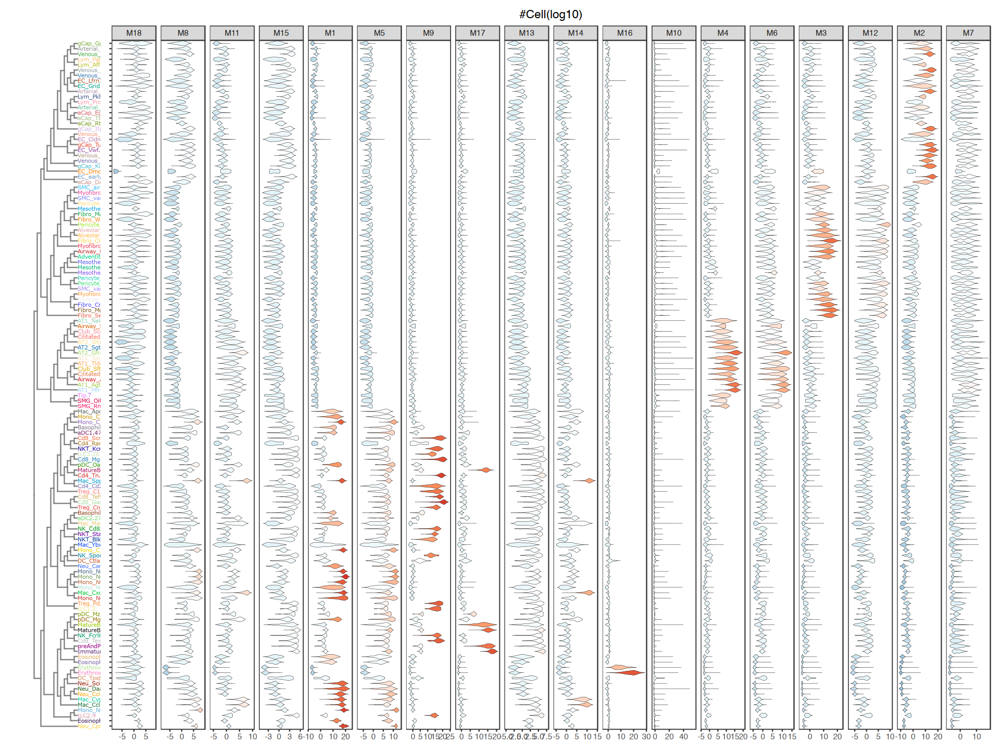

In [85]:
options(repr.plot.width=16, repr.plot.height=12)
( celltype_tree2 | aa ) + 
    plot_layout(guides='collect', widths=c(1,10))

In [75]:
ggsave(glue('{output_dir}/NMF_module_cluster3.pdf'), ( celltype_tree2 | aa ) + 
       plot_layout(guides='collect', widths=c(1,10)),
       width=16, height=12, units='in', dpi=600, bg='transparent')

In [ ]:
#representativepeakplot

In [872]:
gene_mat2 = t(gene_mat)

In [966]:
xx = table(nmf_umap$Celltype_round4, nmf_umap$NMF_modules)

In [970]:
xx = xx[rownames(gene_mat2),]

In [975]:
xx = t(apply(xx, 1, function(x)x/sum(x)))

In [992]:
ra = rowAnnotation(modules=anno_barplot(xx, gp=gpar(fill=module_color),
                                       width=unit(20,'mm'), bar_width=1
                                       ))

In [993]:
options(repr.plot.width=6, repr.plot.height=8)

ht = Heatmap(gene_mat2,#[get_order(o,1),],
             cluster_rows=F, cluster_columns=F,
             show_row_names=F, show_column_names=F,
             col=circlize::colorRamp2(c(-2,-1,0,1,2), c("#91BFDB","#E0F3F8",  "#FFFFFF", "#FC8D59", "#D73027")),
             right_annotation=ra
             #heatmap_legend_param=list('title'='%Cell\n(z-score)')
             #column_names_rot=0 
)

`use_raster` is automatically set to TRUE for a matrix with more than
2000 columns You can control `use_raster` argument by explicitly
setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



In [994]:
pdf(glue('{output_dir}/NMFplots_and_accessibility.pdf'), width = 6,height = 8)
draw(ht)
dev.off()

pdf 
  2

In [512]:
module_gene = read.csv('./placeholder_root/mouse_lung_project/pycode//round_cluster02/merge/NMF_diffgene_sample20wcells.csv')

module_gene_filter = module_gene %>% filter(module!=(-1)) 

# new_name = paste0('M', 1:18)
#names(new_name) = as.character(new_name)

module_gene_filter$module_name = paste0('M', module_gene_filter$module)#new_name#[as.character(module_gene_filter$module)]

module_gene_filter2 = module_gene_filter %>% 
    filter(Gene%in%Annotation(pseudoObj_cells)$gene_name) %>%
    filter(FDR<0.05) %>%
    filter(!grepl('Rik?',Gene)) %>%
    filter(!grepl('^Gm',Gene)) %>%
    dplyr::group_by(module_name) %>%
    dplyr::top_n(Z, n=2)

In [513]:
module_gene_filter2

Gene,C,Z,Pval,FDR,module,module_name
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Pcdha9,0.9282891,1758.7148,0,0,10,M10
Pcdha8,0.9303643,1758.0753,0,0,10,M10
Pcdhgb5,0.8902485,1750.1212,0,0,7,M7
Pcdhgb4,0.8891117,1747.3208,0,0,7,M7
Ugt1a8,0.6710981,1248.7742,0,0,14,M14
Ugt1a9,0.6630792,1241.8806,0,0,14,M14
Slc4a1,0.5521543,1151.2312,0,0,16,M16
Itgb2,0.5284551,1093.6107,0,0,1,M1
Ncf4,0.5250125,1082.2415,0,0,1,M1


# cell_proportion_change_patterns

In [93]:
umap = read.csv('./placeholder_analysis/round_cluster02/merge/cell_meta.csv')
sample_info = read.csv('./placeholder_data/sample_information/sample_information.csv',row.names = 1)
umap$sample_id = factor(sample_info[umap$sample, 'sample_time'], levels=sample_levels)
umap$Time = factor(sample_info[umap$sample, 'Time'], levels=time_levels)
rownames(umap) = umap$X

In [336]:
# new_celltype = read.csv('./placeholder_analysis/round_cluster02/merge/celltype_modify.csv')
# rownames(new_celltype) = new_celltype$Celltype_round4
# new_celltype$new_name = paste0(new_celltype$MainType,'_', new_celltype$SubType, '.', new_celltype$cluster_num)

# new_celltype$new_name2 = paste0(new_celltype$MainType,'_', new_celltype$SubType)

In [94]:
new_celltype = read.csv('./placeholder_analysis/round_cluster02/merge/celltype_modify.csv')
rownames(new_celltype) = new_celltype$Celltype_round4

new_celltype$modify_name = new_celltype$Celltype_round4_new
# new_celltype$modify_name = gsub('^Myeloid_', '',new_celltype$modify_name)
# new_celltype$modify_name = gsub('^Stroma_', '',new_celltype$modify_name)
# new_celltype$modify_name = gsub('^Fibroblast_', 'Fibro_',new_celltype$modify_name)
# new_celltype$modify_name = gsub('^Monocytes_', 'Mono_',new_celltype$modify_name)
# new_celltype$modify_name = gsub('^Macorphage_', 'Mac_',new_celltype$modify_name)
# 
# new_celltype$modify_name = gsub('^Myofibroblast_', 'Myofibro_',new_celltype$modify_name)
# new_celltype$modify_name = gsub('^EC_', '',new_celltype$modify_name)
# new_celltype$modify_name = gsub('^Airway_', '',new_celltype$modify_name)

new_celltype$new_name = paste0(new_celltype$modify_name,'.', new_celltype$cluster_num)

In [85]:
500/775

[1] 0.6451613

In [95]:
round4_color_new = round4_color

names(round4_color_new) = new_celltype[names(round4_color), 'new_name']

In [81]:
round4_color

Airway_Acp7        Airway_Cilitated_Lypd2 
                    "#D7191C"                     "#E6804D" 
       Airway_Cilitated_Muc16           Airway_Club_Scgb1a1 
                    "#FF6F61"                     "#F18A99" 
            Airway_Club_Sftpb                 Airway_Spock3 
                    "#E6AB02"                     "#D95F02" 
        Alveolar_Fibro_Gpr111           Alveolar_Fibro_Irx3 
                    "#FFB347"                     "#E4A8A3" 
     Alveolar_Fibro_Serpina3n                           AT1 
                    "#EBEBEB"                     "#FADFC3" 
                      AT1_Agt                      AT1_Mfrp 
                    "#A6CD48"                     "#A0D6F7" 
                    AT1_Nek10                     AT1_Tldc2 
                    "#94D3B6"                     "#FDAE61" 
                          AT2                     AT2_Gfra1 
                    "#FEE08B"                     "#A6D96A" 
                     AT2_Sgta                        Cd4_c0 
                    "#1F78B4"                     "#7570B3" 
                     Cd4_Rara                        Cd4_Tn 
                    "#A6761D"                     "#D73027" 
                     Cd8_Gas7                     Cd8_Mgme1 
                    "#ABDDA4"                     "#2B83BA" 
                    Cd8_Scrib                      Cd8_Teff 
                    "#F46D43"                     "#D8B365" 
                      Cd8_Tex                       EC_aCap 
                    "#BDBDBD"                     "#A6BD8B" 
                EC_aCap_Dapk1                 EC_aCap_Egfl7 
                    "#C9948B"                     "#D6616B" 
                 EC_aCap_Rtn2            EC_Arterial_Col4a1 
                    "#7B9E23"                     "#B69DAE" 
            EC_Arterial_Gria2             EC_Arterial_Lypd6 
                    "#73C2A3"                     "#969696" 
                     EC_early                       EC_endo 
                    "#6A9AC4"                     "#B97CAA" 
                      EC_gCap                 EC_gCap_Itpr2 
                    "#7AAE3C"                     "#D5B8E5" 
                  EC_gCap_Kit                EC_gCap_Tubb2b 
                  "#4DBBD5FF"                   "#E64B35FF" 
                     EC_Grid1                      EC_Lfrn1 
                  "#00A087FF"                     "#A65628" 
                 EC_Lymphatic             EC_Lymphatic_Aff3 
                  "#FF95A8FF"                   "#BCBD22FF" 
            EC_Lymphatic_Palm          EC_Lymphatic_Pkhd1l1 
                    "#FDBF6F"                   "#3C5488FF" 
                    EC_Venous              EC_Venous_Bcorl1 
                  "#F39B7FFF"                   "#B09C85FF" 
              EC_Venous_Cdh13                EC_Venous_Jak1 
                  "#7876B1FF"                     "#377EB8" 
              EC_Venous_Jazf1               EC_Venous_Prkce 
                    "#4DAF4A"                   "#97A1A7FF" 
                       EC_Vwf                   Endothelium 
                    "#984EA3"                     "#FF7F00" 
         Erythroid_Definitive           Erythroid_primitive 
                    "#F781BF"                     "#B2DF8A" 
  Fibroblast_Wnt2_Mki67_Crlf1     Fibroblast_Wnt2_Mki67_Mgp 
                  "#5050FFFF"                   "#82581FFF" 
  Fibroblast_Wnt2_Mki67_Sesn1                          ILC1 
                  "#E5614CFF"                   "#F0E685FF" 
                         ILC2                          ILC3 
                  "#D595A7FF"                   "#CDDEB7FF" 
                    ImmatureB           MatureB_(Cd5+)Ccl22 
                  "#612A79FF"                   "#AE1F63FF" 
          MatureB_(Cd5+)Dusp2                 MatureB(Cd5-) 
                  "#1B1919FF"                   "#99CC00FF" 
          Monocytes_Classical     Monocytes_Classical_Bend7 
                  "#CC9900FF"                   "#946

In [96]:
all_cell_prop = c()
for(i in unique(umap$Celltype_round1)){
    tmp_umap = umap[umap$Celltype_round1==i,]
    tmp_count_mat = tmp_umap %>% 
        dplyr::group_by(Celltype_round4, Time) %>%
        dplyr::summarise(n=n()) %>%
        reshape2::acast(Celltype_round4~Time, value.var = 'n', fill=0)
    tmp_prop = t(t(tmp_count_mat)/colSums(tmp_count_mat))
    tmp_prop = melt(tmp_prop)
    colnames(tmp_prop) = c('Celltype_round4', 'Time', 'prop')
    tmp_prop$Celltype_round1 = i
    all_cell_prop = rbind(all_cell_prop, tmp_prop)
}

`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'Celltype_round4'. You can override using
the `.groups` argument.


In [97]:
all_cell_prop$new_name = new_celltype[as.vector(all_cell_prop$Celltype_round4), 'new_name']

In [98]:
umap$new_name = new_celltype[as.vector(umap$Celltype_round4), 'new_name']

In [99]:
umap$new_name2 = new_celltype[as.vector(umap$Celltype_round4), 'new_name2']

## cell_proportion_heatmap

In [100]:
library(seriation)

register_DendSer()



Attaching package: 'seriation'


The following object is masked from 'package:igraph':

    permute


The following object is masked from 'package:gtools':

    permute


Registered S3 method overwritten by 'gclus':
  method         from     
  reorder.hclust seriation

Registering new seriation method 'DendSer' for 'dist'register_DendSer()

Registering new seriation method 'DendSer_BAR' for 'dist'register_DendSer()

Registering new seriation method 'DendSer_PL' for 'dist'register_DendSer()

Registering new seriation method 'DendSer_LPL' for 'dist'register_DendSer()

Registering new seriation method 'DendSer_ARc' for 'dist'register_DendSer()

Registering new seriation criteron 'ARc' for 'dist' using register_DendSer()



In [101]:
cell_prop_mat = umap %>%
  dplyr::group_by(Time, Celltype_round4) %>%
  dplyr::summarise(cell_num=n()) %>%
  reshape2::acast(Time~Celltype_round4, fill=0)
cell_prop_mat = cell_prop_mat / rowSums(cell_prop_mat)
tmp_mat = t(apply(t(cell_prop_mat),1,scale))

`summarise()` has grouped output by 'Time'. You can override using the
`.groups` argument.
Using cell_num as value column: use value.var to override.



In [102]:
cell_prop_mat = reshape2::acast(all_cell_prop,Time~new_name, value.var = 'prop')

In [103]:
cell_prop_mat = cell_prop_mat / rowSums(cell_prop_mat)
tmp_mat = t(apply(t(cell_prop_mat),1,scale))
#tmp_mat = t(apply(t(cell_prop_mat),1,function(x)(x-min(x))/(max(x)-min(x))))

In [104]:
min(cell_prop_mat)

[1] 0

In [349]:
#tmp_mat = t(apply(cell_prop_mat,2, function(x)(x-min(x))/(max(x)-min(x))))

In [105]:
predict_seq = seq(1,15,1)
tmp_mat_smmoth = t(apply(tmp_mat, 1, function(x){
    tmp_lm = loess(formula = y~x, data=data.frame(x=1:15,y=x))
    predict(tmp_lm, predict_seq)
}))
colnames(tmp_mat_smmoth) = sapply(predict_seq, function(x)ifelse(x%in%1:15, x, ''))
o = seriate(tmp_mat_smmoth,method='Heatmap', 
            #margin=1,
            seriation_method = 'DendSer_BAR',dist_fun=dist)

In [106]:
colnames(tmp_mat_smmoth) = paste0('P', as.numeric(colnames(tmp_mat_smmoth))-1)

In [107]:
tmp_meta = umap[,c('Celltype_round1', 'new_name')] %>% unique()
rownames(tmp_meta) = tmp_meta$new_name

In [108]:
leftanno = rowAnnotation(
    df=data.frame(
        Celltype_round1=tmp_meta[rownames(tmp_mat_smmoth),'Celltype_round1']
    ),
    col=list(
        Celltype_round1=celltype_round1_color
    ),
    show_legend = TRUE,
    show_annotation_name = FALSE
)

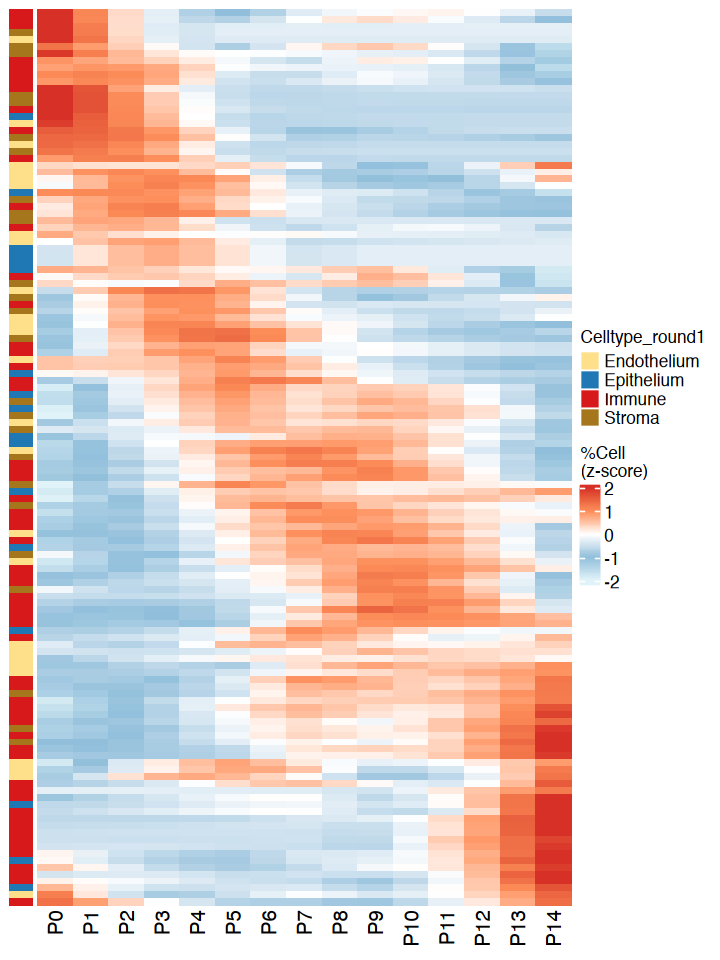

In [127]:
options(repr.plot.width=6, repr.plot.height=8)

ht = Heatmap(tmp_mat_smmoth,#[get_order(o,1),],
             cluster_rows=stats::as.dendrogram(o[[1]]),
             left_annotation=leftanno, 
             cluster_columns=F,
             show_row_names=F,
             show_column_dend=F,
             show_row_dend = F,
             col=circlize::colorRamp2(c(-2,-1,0,1,2), c("#E0F3F8", "#91BFDB", "#FFFFFF", "#FC8D59", "#D73027")),
             heatmap_legend_param=list('title'='%Cell\n(z-score)')
             #column_names_rot=0 
)
ht

In [99]:
pdf(glue('{output_dir}/cell_proportion_heatmap15.pdf'), width = 6,height = 8)
draw(ht)
dev.off()

pdf 
  2

In [128]:
saveRDS(list('smooth'=tmp_mat_smmoth,
             'raw'=t(cell_prop_mat),
             'cell_order'=rownames(tmp_mat_smmoth)[row_order(ht)]),
       '../out_data/cell_prop_time_mat.rds')

In [270]:
predict_seq = seq(1,15,0.01)
tmp_mat_smmoth = t(apply(tmp_mat, 1, function(x){
    tmp_lm = loess(formula = y~x, data=data.frame(x=1:15,y=x))
    predict(tmp_lm, predict_seq)
}))
colnames(tmp_mat_smmoth) = sapply(predict_seq, function(x)ifelse(x%in%1:15, x, ''))
#o = seriate(tmp_mat_smmoth,method='Heatmap', 
#            margin=1,
#            seriation_method = 'DendSer_BAR',dist_fun=dist)

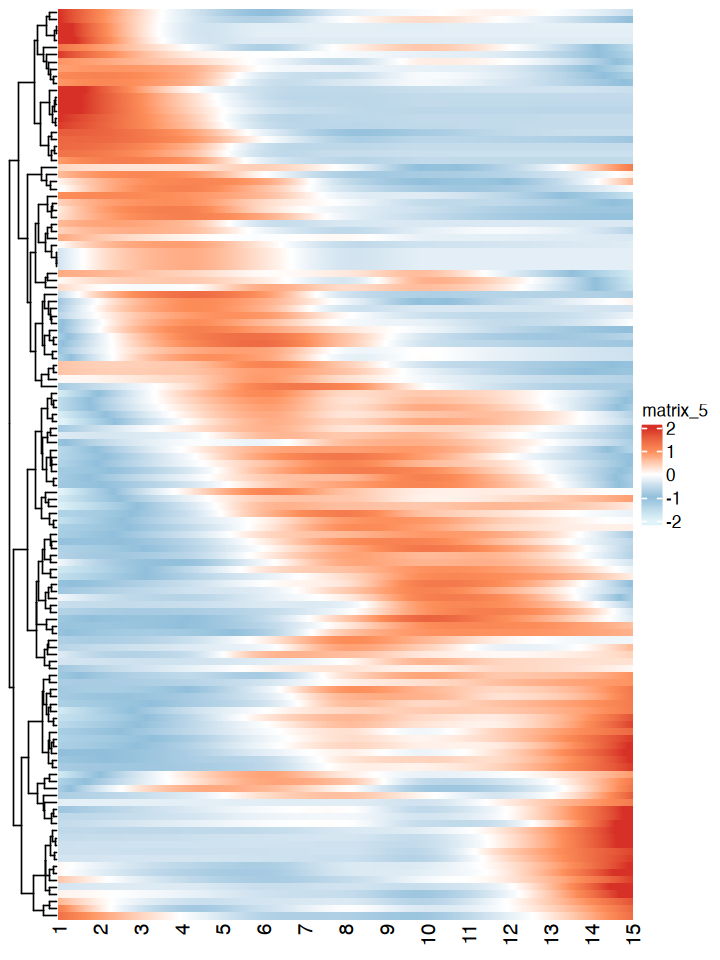

In [405]:
options(repr.plot.width=6, repr.plot.height=8)

ht = Heatmap(tmp_mat_smmoth,#[get_order(o,1),],
             cluster_rows=stats::as.dendrogram(o[[1]]), 
             cluster_columns=F,
             show_row_names=F,
             show_column_dend=F,
             col=circlize::colorRamp2(c(-2,-1,0,1,2), c("#E0F3F8", "#91BFDB", "#FFFFFF", "#FC8D59", "#D73027")),
             #column_names_rot=0 
)
ht

In [810]:
pdf(glue('{output_dir}/cell_proportion_heatmap150.pdf'), width = 6,height = 8)
draw(ht)
dev.off()

pdf 
  2

In [110]:
la = data.frame(stage = cutree(o[[1]], 3))
la$stage = paste0('C',la$stage)
la_col = pal_igv()(20)[1:length(unique(la$stage))]
names(la_col) = unique(la$stage)
la = rowAnnotation(df=la,
                  col=list('stage'=la_col))

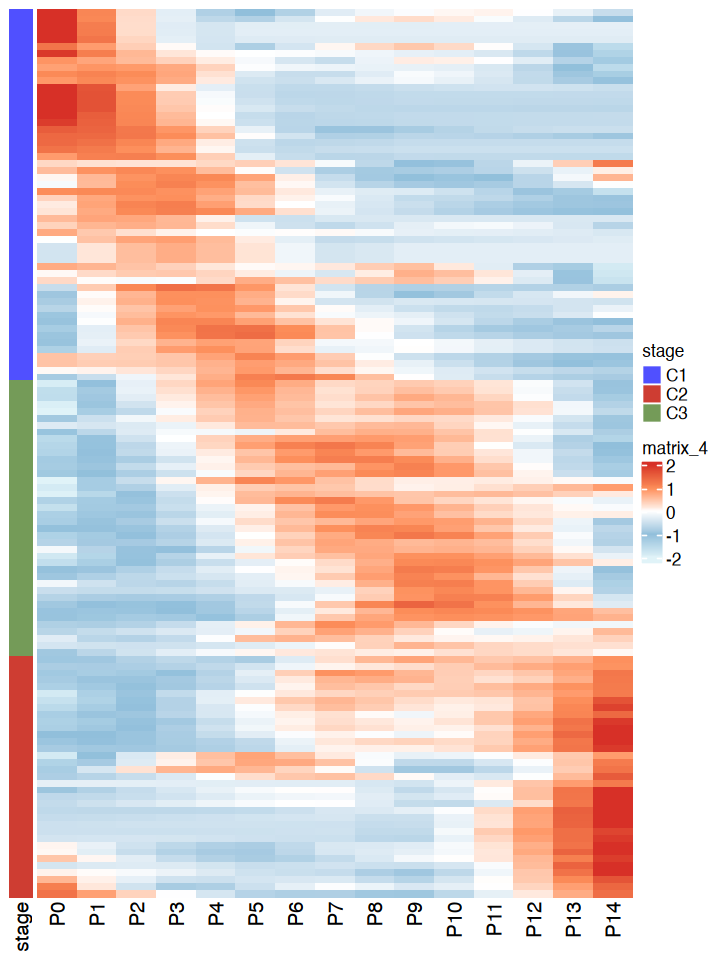

In [111]:

options(repr.plot.width=6, repr.plot.height=8)

ht = Heatmap(tmp_mat_smmoth,#[get_order(o,1),],
             cluster_rows=stats::as.dendrogram(o[[1]]), 
             cluster_columns=F,
             show_row_names=F,
             show_column_dend=F,
             show_row_dend=F,
             col=circlize::colorRamp2(c(-2,-1,0,1,2), c("#E0F3F8", "#91BFDB", "#FFFFFF", "#FC8D59", "#D73027")),
             left_annotation=la
)
draw(ht)

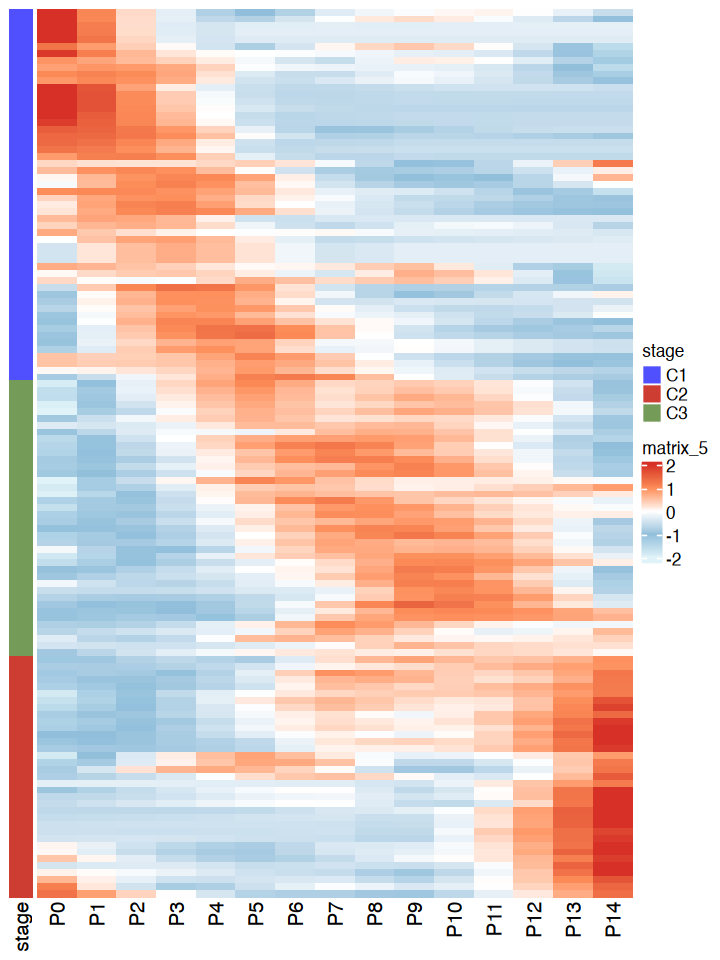

In [285]:
draw(ht)

In [541]:
pdf(glue('{output_dir}/cell_proportion_heatmap150(cluster).pdf'), width = 6,height = 8)
draw(ht)
dev.off()

pdf 
  2

## cell_proportion_density_plot

In [112]:
la = data.frame(stage = cutree(o[[1]], 3))
la$stage = paste0('C',la$stage)

In [113]:
all_prop = melt(tmp_mat_smmoth) 
colnames(all_prop) = c('Celltype', 'Time', 'prop')
all_prop$cluster = la[all_prop$Celltype, 'stage']
#all_prop$Time = all_prop$Time - 1

In [114]:
data_summary2 <- function(data, varname, groupnames){
  require(plyr)
  summary_func <- function(x, col){
    c(mean = median(x[[col]], na.rm=TRUE),
      sd = sd(x[[col]], na.rm=TRUE))
  }
  data_sum<-ddply(data, groupnames, .fun=summary_func,
                  varname)
  #print(data_sum)
  data_sum <- plyr::rename(data_sum, c("mean" = varname))
  return(data_sum)
}

all_prop_error <- data_summary2(all_prop, varname="prop", 
                    groupnames=c("Time", 'cluster'))



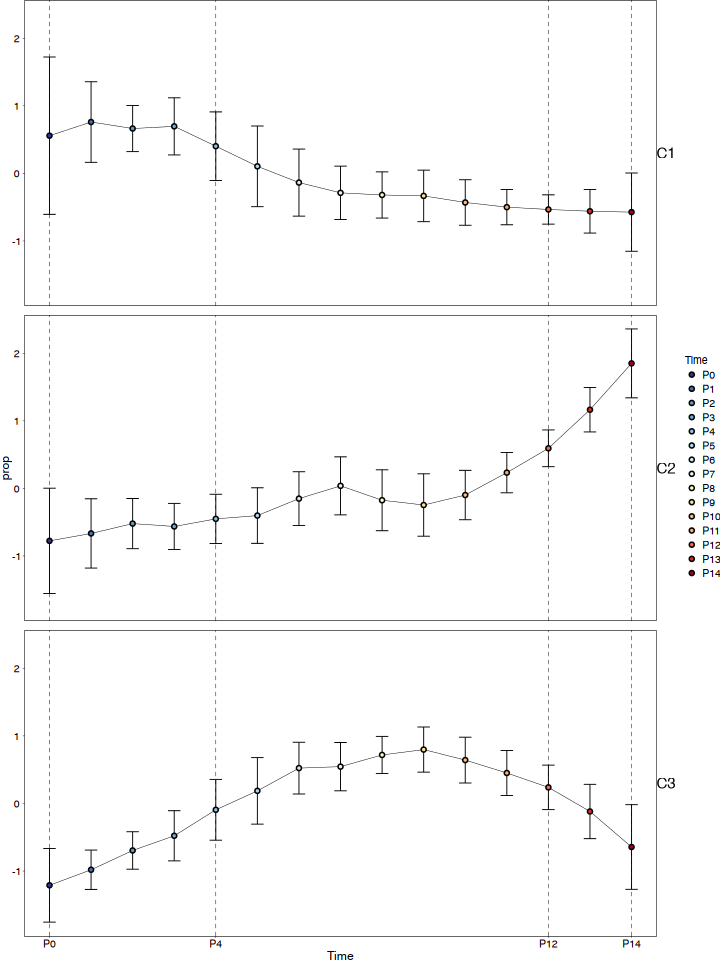

In [114]:
a=all_prop_error %>%
    mutate(cluster=factor(cluster, c('C1', 'C3', 'C2'))) %>%
  ggplot(aes(x=Time, y=prop))+
  geom_line(aes(group=1), size=0.1)+
  geom_errorbar(aes(x=Time,ymin=prop-sd,ymax=prop+sd),data=all_prop_error, width=0.3,size=0.2,
                inherit.aes = F)+
      facet_wrap(~cluster, ncol=1,strip.position = 'right')+
  geom_point(aes(fill=Time), shape=21, size=0.8, strokes=0.1)+
  scale_x_discrete(breaks =c('P0', 'P4', 'P12', 'P14'))+
  scale_fill_manual(values = time_color2)+
   mytheme+
    theme(panel.grid.major.y = element_blank(),
          panel.grid.minor.y = element_blank(),
          panel.grid.minor.x=element_blank(),
          panel.grid.major.x=element_line(color='black', size=0.1, linetype = 'dashed'))
a

In [771]:
ggsave(glue('{output_dir}/cell_proportion_heatmapclusterline_plot.pdf'), a,
       width=45, height=85, units='mm', dpi=600, bg='transparent')

In [118]:
new_celltype

,Celltype_round1,Celltype_round2,Celltype_round3,Celltype_round4,n,cluster_num,MainType,SubType,Celltype_round4_new,modify_name,new_name
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
EC_Arterial_Col4a1,Endothelium,EC_Arterial,EC_Arterial_Col4a1,EC_Arterial_Col4a1,9502,86,EC,Arterial,Arterial_Col4a1,Arterial_Col4a1,Arterial_Col4a1.86
EC_Arterial_Gria2,Endothelium,EC_Arterial,EC_Arterial_Gria2,EC_Arterial_Gria2,1025,25,EC,Arterial,Arterial_Gria2,Arterial_Gria2,Arterial_Gria2.25
EC_Arterial_Lypd6,Endothelium,EC_Arterial,EC_Arterial_Lypd6,EC_Arterial_Lypd6,12609,104,EC,Arterial,Arterial_Lypd6,Arterial_Lypd6,Arterial_Lypd6.104
EC_Grid1,Endothelium,EC_Grid1,EC_Grid1,EC_Grid1,73130,128,EC,EC,EC_Grid1,EC_Grid1,EC_Grid1.128
EC_Lfrn1,Endothelium,EC_Lfrn1,EC_Lfrn1,EC_Lfrn1,21577,117,EC,EC,EC_Lfrn1,EC_Lfrn1,EC_Lfrn1.117
EC_Venous,Endothelium,EC_Venous,EC_Venous,EC_Venous,3406,54,EC,Venous,Venous,Venous,Venous.54
EC_Venous_Bcorl1,Endothelium,EC_Venous,EC_Venous_Bcorl1,EC_Venous_Bcorl1,2978,51,EC,Venous,Venous_Bcorl1,Venous_Bcorl1,Venous_Bcorl1.51
EC_Venous_Cdh13,Endothelium,EC_Venous,EC_Venous_Cdh13,EC_Venous_Cdh13,535,13,EC,Venous,Venous_Cdh13,Venous_Cdh13,Venous_Cdh13.13
EC_Venous_Jak1,Endothelium,EC_Venous,EC_Venous_Jak1,EC_Venous_Jak1,869,23,EC,Venous,Venous_Jak1,Venous_Jak1,Venous_Jak1.23


In [115]:
tmp_meta = umap[,c('Celltype_round1', 'new_name')] %>% unique()
rownames(tmp_meta) = tmp_meta$new_name

In [116]:
all_prop$Celltype_round1 = tmp_meta[as.vector(all_prop$Celltype), 'Celltype_round1']
head(all_prop)

,Celltype,Time,prop,cluster,Celltype_round1
,<fct>,<fct>,<dbl>,<chr>,<chr>
1,aCap_Dapk1.29,P0,2.6077660,C1,Endothelium
2,aCap_Egfl7.91,P0,-1.2803416,C2,Endothelium
3,aCap_Rtn2.43,P0,0.3447562,C1,Endothelium
4,aCap_Tbx2.64,P0,-1.3822811,C2,Endothelium
5,aDC1.47,P0,-0.8140677,C2,Immune
6,aDC2.27,P0,-1.6380860,C3,Immune


`geom_smooth()` using formula = 'y ~ x'


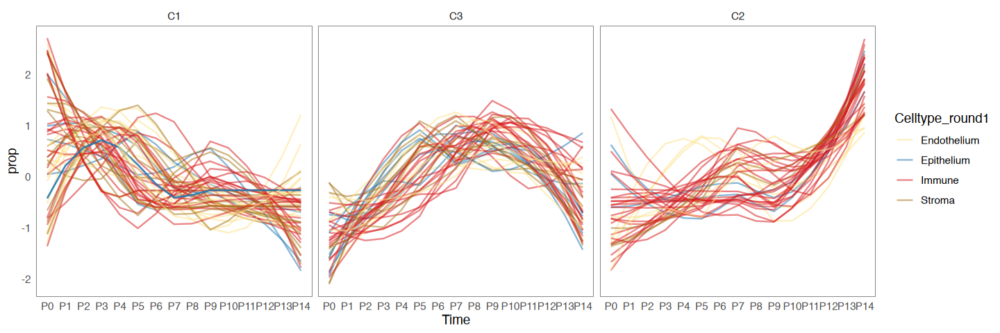

In [125]:
options(repr.plot.width=12, repr.plot.height=4)
a=all_prop %>%
    mutate(cluster=factor(cluster, c('C1', 'C3', 'C2'))) %>%
    ggplot(aes(x=Time, y=prop))+
    geom_line(aes(group=Celltype, color=Celltype_round1), linewidth=0.5, alpha=0.53)+
    geom_smooth(method='loess', color='black', se=F)+
    facet_wrap(~cluster, ncol=3)+
    scale_color_manual(values = celltype_round1_color)+
    #scale_color_manual(values = c('C2'='#313695', 'C1'='#74ADD1', 'C3'='#FEE090', 'C4'='#F46D43'))+
    #scale_x_discrete(breaks = c('P4', 'P2'), labels = c('P0', 'P3', 'P7', 'P13'))+
    theme_minimal()+
    theme(panel.grid = element_blank(),
          #panel.grid.minor.y = element_blank(),
          #panel.grid.minor.x=element_blank(),
          #panel.grid.major.x=element_line(color='black', size=0.1),
          #panel.grid.major.y
         strip.background = element_blank(),
         panel.border=element_rect(size=0.1, fill=NA))
a

In [126]:
ggsave(glue('{output_dir}/cell_proportion_heatmapclusterline_plot(2).pdf'), a,
       width=240, height=70, units='mm', dpi=600, bg='transparent')

`geom_smooth()` using formula = 'y ~ x'


In [117]:
umap_meta = umap[, c('Celltype_round1','new_name')] %>% unique()
rownames(umap_meta) = umap_meta$new_name

In [118]:
la$Celltype_round1 = umap_meta[rownames(la), 'Celltype_round1']

In [302]:
xx = table(la$stage, la$Celltype_round1)
xx = xx / rowSums(xx)
xx_ypos = melt(apply(xx,1, cumsum))
colnames(xx_ypos) = c('Celltype_round1', 'stage', 'ypos')

xx = melt(xx)


colnames(xx) = c('stage', 'Celltype_round1', 'prop')
xx$label = paste0(round(xx$prop,4)*100, '%')

xx = left_join(xx, xx_ypos)

Joining with `by = join_by(stage, Celltype_round1)`


In [247]:
xx

stage,Celltype_round1,prop,label,ypos
<fct>,<fct>,<dbl>,<chr>,<dbl>
C1,Endothelium,0.25925926,25.93%,0.2592593
C2,Endothelium,0.17142857,17.14%,0.1714286
C3,Endothelium,0.17500000,17.5%,0.1750000
C1,Epithelium,0.12962963,12.96%,0.3888889
C2,Epithelium,0.08571429,8.57%,0.2571429
C3,Epithelium,0.17500000,17.5%,0.3500000
C1,Immune,0.35185185,35.19%,0.7407407
C2,Immune,0.65714286,65.71%,0.9142857
C3,Immune,0.45000000,45%,0.8000000


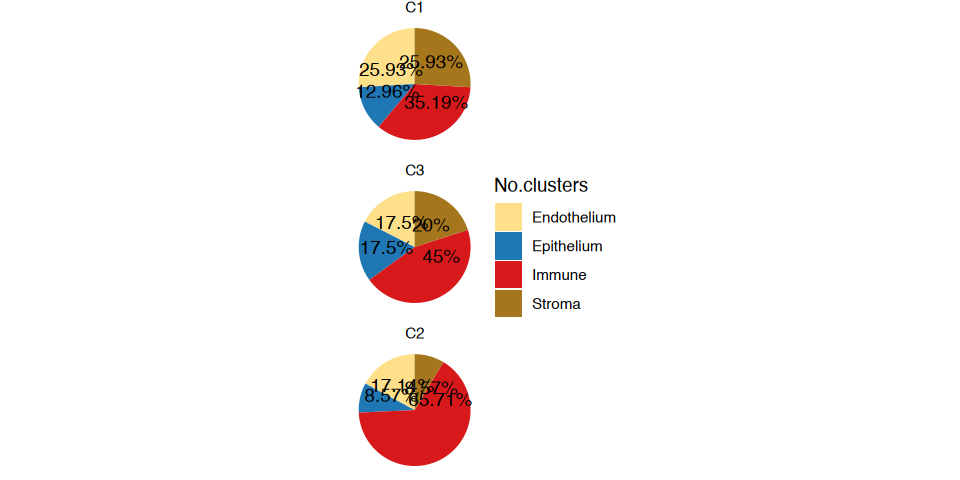

In [248]:
options(repr.plot.width=8, repr.plot.height=4)
a=xx %>% 
    mutate(stage=factor(stage, c('C1', 'C3', 'C2'))) %>%
    ggplot(aes(x="", y=prop, fill=Celltype_round1))+
    geom_bar(width = 1, stat = "identity")+
    geom_text(aes(y=1-ypos+0.1, label=label))+
    coord_polar("y", start=0)+
    facet_wrap("~ stage",ncol = 1, scale = 'free') +
    theme_void()+
    scale_fill_manual(name='No.clusters', values=celltype_round1_color)+
    #labs(title = 'Non-overlap cCREs') +
    theme( plot.title = element_text(hjust = 0.5))
a

In [749]:
ggsave(glue('{output_dir}/cell_proportion_heatmapclusterpie_chart.pdf'), a+NoLegend(),
       width=60, height=100, units='mm', dpi=600, bg='transparent')

## similar_patterns_per_time_point

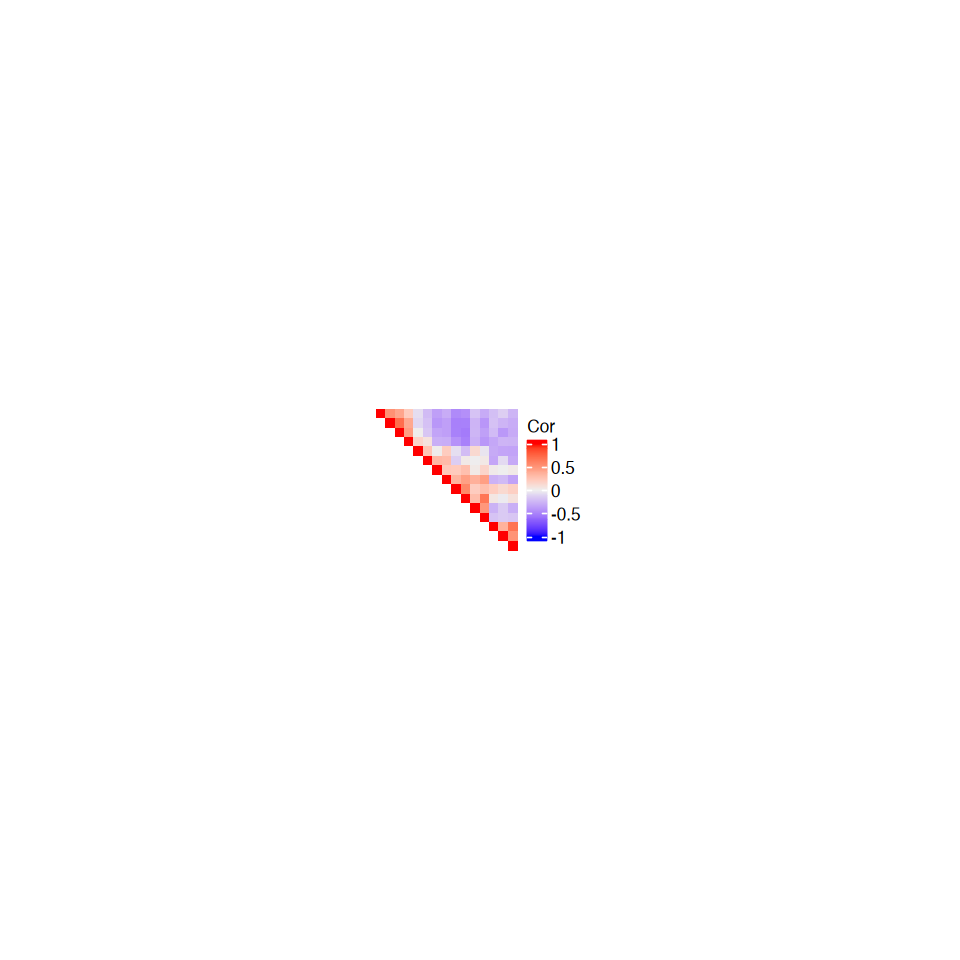

In [120]:
options(repr.plot.width=8, repr.plot.height=8)
sample_cor = cor(tmp_mat)
sample_cor[lower.tri(sample_cor,diag = F)] = NA

ht = Heatmap(sample_cor, 
        #col = circlize::colorRamp2(c(0,1),c("white","#a50f15")),
        cluster_rows = F, cluster_columns = F,show_column_names = F,
        na_col = 'white',
        width = ncol(sample_cor)*unit(2, "mm"), # width
        height = nrow(sample_cor)*unit(2, "mm"), # height
        #row_names_gp = gpar(col=time_color,fontsize=12, font='bold'),
        heatmap_legend_param = list(title='Cor')
        )
ht

In [760]:
pdf(glue('{output_dir}/cell_proportion_time_similarity.pdf'), width = 3,height = 3)
draw(ht)
dev.off()

pdf 
  2

## clusterinterval_similarity

In [121]:
la

,stage,Celltype_round1
,<chr>,<chr>
aCap_Dapk1.29,C1,Endothelium
aCap_Egfl7.91,C2,Endothelium
aCap_Rtn2.43,C1,Endothelium
aCap_Tbx2.64,C2,Endothelium
aDC1.47,C2,Immune
aDC2.27,C3,Immune
Adventitial_Fibro.70,C1,Stroma
Airway_Acp7.75,C3,Epithelium
Airway_Fibro.97,C1,Stroma


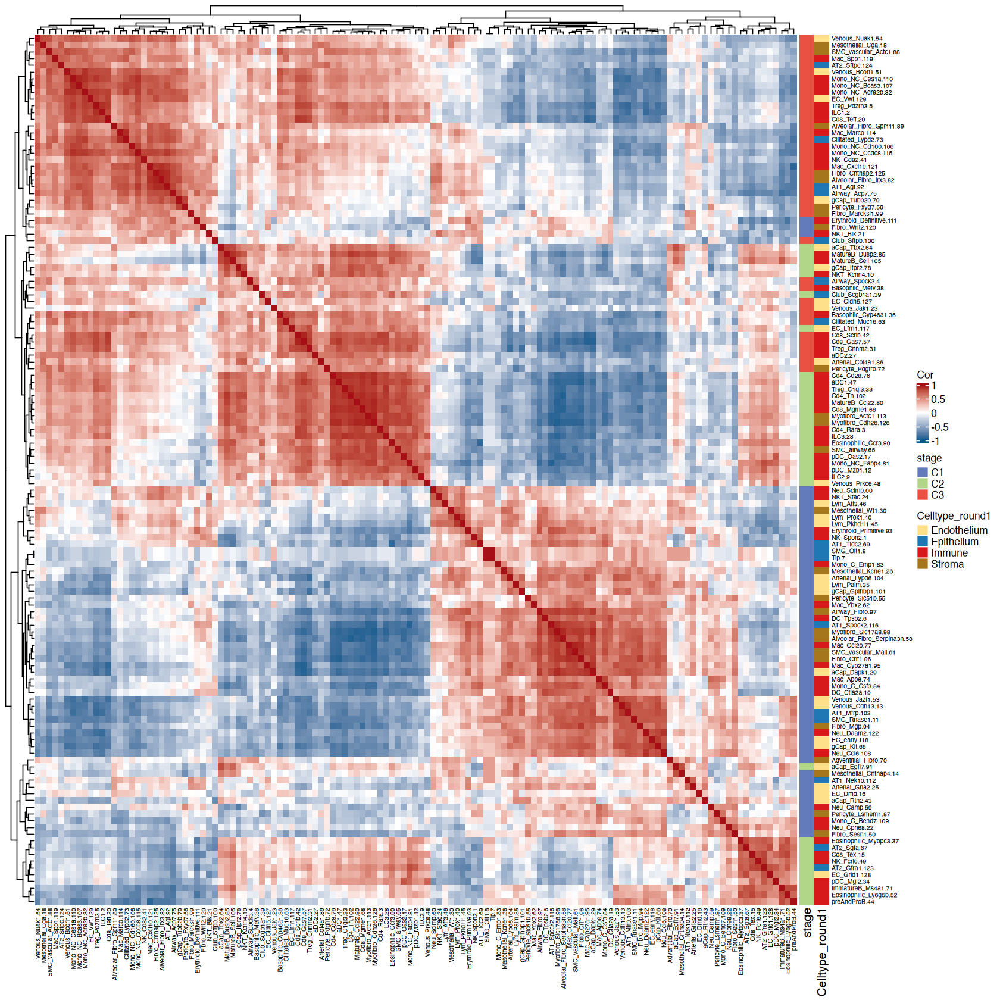

In [129]:
# between_subtypespropsimilarity
sample_cor = cor(t(tmp_mat), method='spearman')


options(repr.plot.width=14, repr.plot.height=14)
ht=Heatmap(sample_cor, 
        col = circlize::colorRamp2(c(-1,0,1),c("#045a8d","white","#a50f15")),
        cluster_rows = T, cluster_columns =T,show_column_names = T,
        #row_split=r4_relation[rownames(sample_cor), 'Celltype_round1'],
        #column_split=r4_relation[rownames(sample_cor), 'Celltype_round1'],
        na_col = 'white',
        #width = ncol(sample_cor)*unit(2, "mm"), # width
        #height = nrow(sample_cor)*unit(2, "mm"), # height
        row_names_gp = gpar(fontsize=6, font='bold'),
        column_names_gp = gpar(fontsize=6, font='bold'),
        heatmap_legend_param = list(title='Cor'),
        right_ann=rowAnnotation(df=la,
                               col=list('stage'=c('C1'='#637abb','C2'='#b2d688','C3'='#ea5142'), 
                                        'Celltype_round1'=celltype_round1_color))
)
ht

In [130]:
tmp_mat

aCap_Dapk1.29,3.59400550,0.12611980,-0.2404596,-0.27152593,-0.28991604,-0.289441666,-0.290132217,-0.28999478,-0.29266502,-0.29266502,-0.2926650,-0.29266502,-0.29266502,-0.29266502,-0.29266502
aCap_Egfl7.91,-1.70050480,0.40786878,-0.2382638,1.49098441,-0.22076753,1.026106453,1.076644599,-0.90564078,-0.37651019,-0.10406053,-1.3314639,-1.09093805,-0.18946272,1.30770892,0.84829917
aCap_Rtn2.43,0.55090167,0.42516752,-0.3214658,-0.29083115,0.17508259,1.373800541,-0.143684406,-0.14043326,-0.55081599,-0.72818069,-1.4507992,-0.81235208,-0.80481127,2.66849680,0.04992472
aCap_Tbx2.64,-1.17235057,-0.70652918,-1.0179738,0.21208231,-0.17861871,1.847909572,0.626030053,-0.01317040,0.24307333,0.06381682,-1.5226745,-0.76648688,0.02857535,2.03263820,0.32367850
aDC1.47,-0.87504736,-0.55088105,-1.4441483,-0.78057365,-0.47724799,-0.426419839,0.464542552,-0.46545886,1.83961785,1.20219534,-0.4121297,-0.36287746,0.59226570,-0.26404499,1.96020779
aDC2.27,-1.67597208,-0.96730684,-1.4190340,-0.09644854,0.13729547,0.081329829,0.215157419,0.16282293,2.08227143,1.33952071,0.2532333,-1.07977188,0.78346368,0.35945223,-0.17601368
Adventitial_Fibro.70,-0.20865288,-0.44106529,-0.5538424,2.68918929,-0.36107659,2.130444582,-0.195961135,-0.10430342,-0.21483409,-0.28716033,-0.7217262,-0.58344639,-0.51416864,-0.47499614,-0.15840036
Airway_Acp7.75,-1.55458532,-0.80560888,-0.3425494,-0.67079638,0.66768963,0.959024743,0.261288715,1.78588841,0.32486963,0.34114585,0.9377913,1.17801610,-0.80120873,-1.21568604,-1.06527965
Airway_Fibro.97,0.37517708,0.45250444,0.5953571,2.67411273,0.19611227,1.292910009,-0.217195301,-0.03685012,-0.50846549,-0.59210399,-0.5365555,-0.70602491,-1.08601578,-1.00145165,-0.90151088
Airway_Spock3.4,-0.39396297,-1.17133834,-1.2697362,0.38715033,-0.93476151,1.019292161,-0.727349208,1.51289604,1.84756874,0.66363480,-1.2696196,0.64900073,-0.18401034,0.09500722,-0.22377182
Alveolar_Fibro_Gpr111.89,-1.61718635,-1.24828875,-1.6361910,-0.27237227,0.84179566,2.133874025,0.461814824,0.18338201,0.43201168,-0.09164386,0.3854343,0.31543881,-0.28897531,0.89301072,-0.49210444


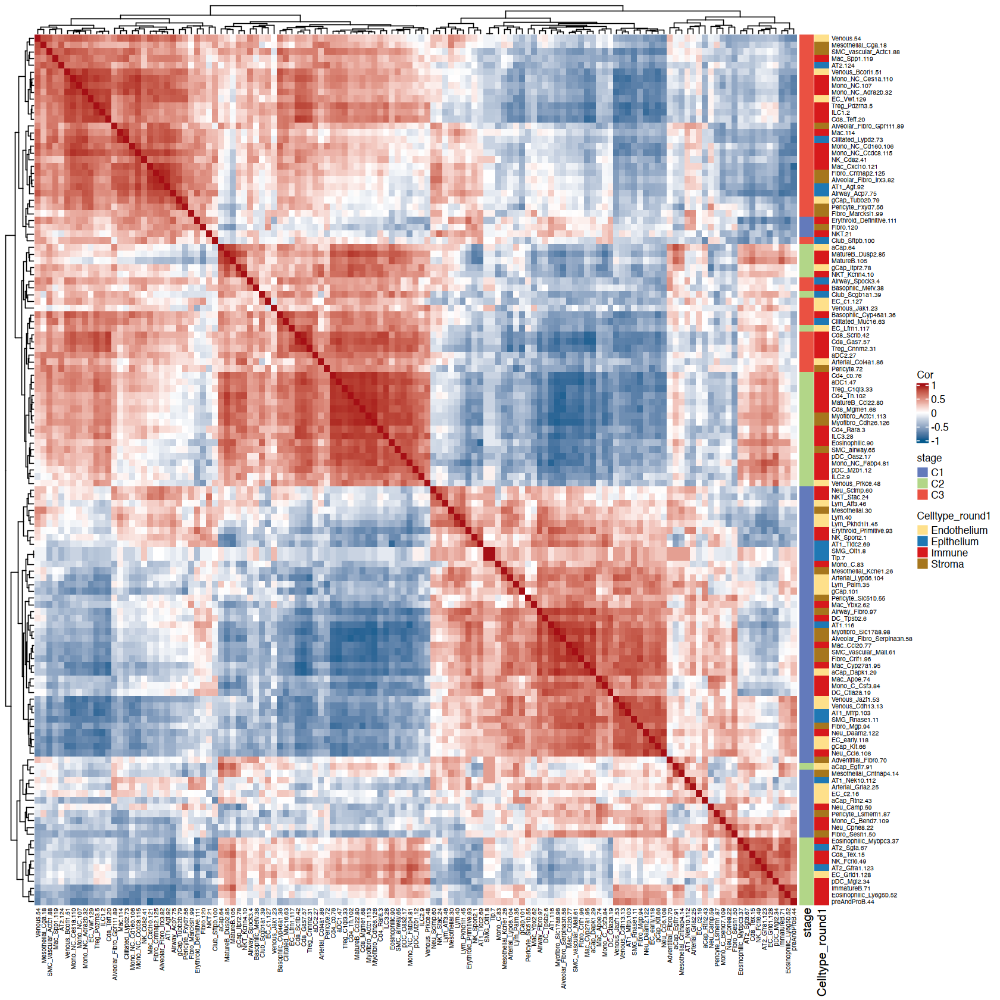

In [290]:
draw(ht)

In [291]:
pdf(glue('{output_dir}/cell_proportion_similarity_heatmap(clustering).pdf'), width = 12,height = 10)
draw(ht)
dev.off()

pdf 
  2

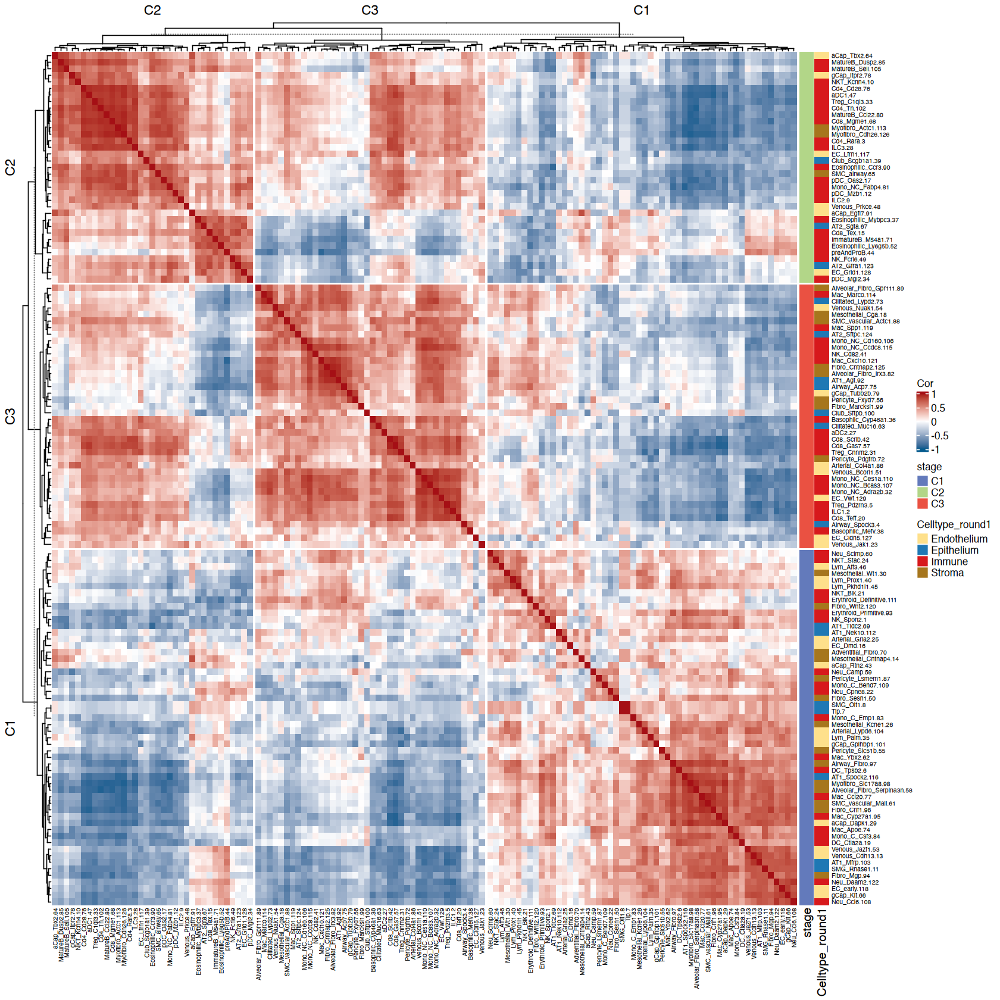

In [123]:
# between_subtypespropsimilarity
sample_cor = cor(t(tmp_mat), method='spearman')


options(repr.plot.width=14, repr.plot.height=14)
ht=Heatmap(sample_cor, 
        col = circlize::colorRamp2(c(-1,0,1),c("#045a8d","white","#a50f15")),
        cluster_rows = T, cluster_columns =T,show_column_names = T,
        row_split=la$stage,
        column_split=la$stage,
        na_col = 'white',
        #width = ncol(sample_cor)*unit(2, "mm"), # width
        #height = nrow(sample_cor)*unit(2, "mm"), # height
        row_names_gp = gpar(fontsize=6, font='bold'),
        column_names_gp = gpar(fontsize=6, font='bold'),
        heatmap_legend_param = list(title='Cor'),
        right_ann=rowAnnotation(df=la,
                               col=list('stage'=c('C1'='#637abb','C2'='#b2d688','C3'='#ea5142'), 
                                        'Celltype_round1'=celltype_round1_color))
)
ht

In [124]:
pdf(glue('{output_dir}/cell_proportion_similarity_heatmap(stagegrouping).pdf'), width = 12,height = 10)
draw(ht)
dev.off()

agg_record_1294831552 
                    2

## major_subcluster_proportion_trends

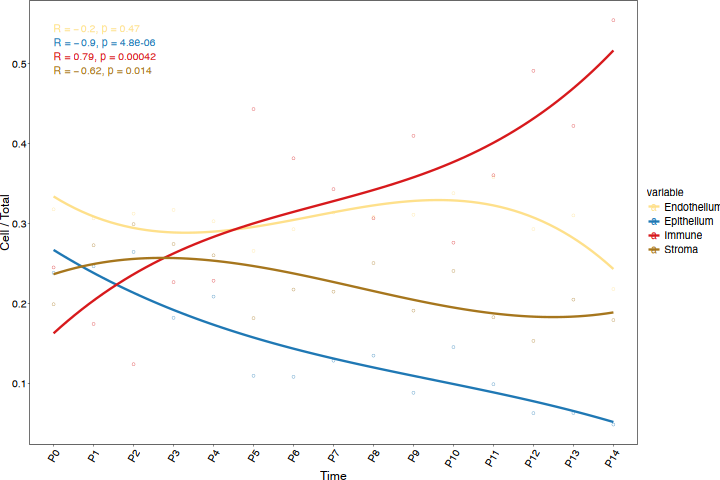

In [143]:
orig_df = as.data.frame.matrix(table(umap[,'Time'], umap[,'Celltype_round1']))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))

options(repr.plot.width=6, repr.plot.height=4)
a=orig_df %>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / Total')+
    scale_color_manual(values = c('Immune'='#D7191C',
                 'Epithelium'='#1F78B4',
                 'Endothelium'='#FEE08B',
                 'Stroma'='#A6761D'))+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a

In [340]:
ggsave(glue('{output_dir}/cell_proportion_changes_major_subclusters.pdf'), a+NoLegend(),
       width=40, height=40, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/cell_proportion_changes_major_subclusters_legend.pdf'), get_legend(a),
       width=40, height=40, units='mm', dpi=600, bg='transparent')


In [146]:
Immune_prop = orig_df %>% filter(variable=='Immune')

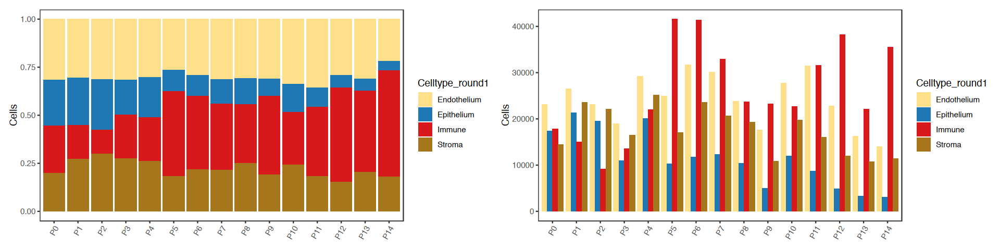

In [305]:
options(repr.plot.width=16, repr.plot.height=4)
a1=distribution_func(umap, 'Time', 'Celltype_round1',c('Immune'='#D7191C',
                 'Epithelium'='#1F78B4',
                 'Endothelium'='#FEE08B',
                 'Stroma'='#A6761D'))
a2=distribution_func(umap, 'Time', 'Celltype_round1',c('Immune'='#D7191C',
                 'Epithelium'='#1F78B4',
                 'Endothelium'='#FEE08B',
                 'Stroma'='#A6761D'), 'dodge')
a1+a2

In [308]:
ggsave(glue('{output_dir}/cell_proportion_changes_major_subclustersbar.pdf'), a1+a2,
       width=210, height=40, units='mm', dpi=600, bg='transparent')

`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.


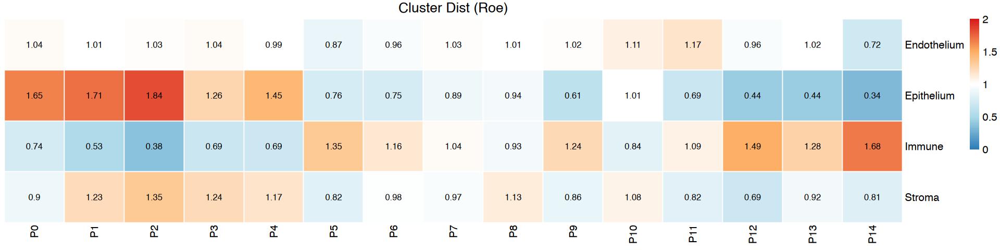

In [357]:
options(repr.plot.width=16, repr.plot.height=4)
res=distribution_Roe_func(umap, 'Celltype_round1','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)

In [973]:
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_major_subclusters_Roe.pdf'), width = 8,height = 2)
res=distribution_Roe_func(umap, 'Celltype_round1','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

pdf 
  3

`summarise()` has grouped output by 'Celltype_round1'. You can override using the `.groups` argument.


pdf 
  3

# subcluster_change_patterns

In [131]:
round4_color = readRDS('./placeholder_analysis/round_cluster02/merge/round4_color.rds')
round4_num = readRDS('./placeholder_analysis/round_cluster02/merge/round4_cluster_num.rds')
round4_color2 = round4_color
names(round4_color2) = round4_num[names(round4_color2)]

In [132]:
round4_color_new = round4_color

names(round4_color_new) = new_celltype[names(round4_color), 'new_name']

## Epithelium

In [133]:
tmp_umap = umap[umap$Celltype_round1=='Epithelium',]
tmp_umap = tmp_umap%>% filter(!Celltype_round3%in%c('Tip', 'SMG_Oit1', 'SMG_Rnase1'))
tmp_round='Celltype_round2'

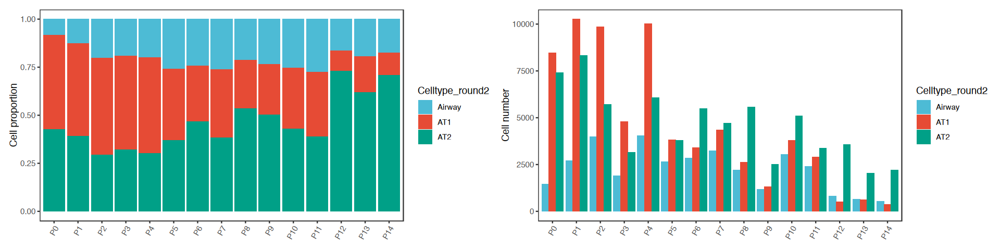

In [134]:
options(repr.plot.width=16, repr.plot.height=4)
#a=distribution_func(tmp_umap, 'Time', tmp_round)
#a

a1=distribution_func(tmp_umap, 'Time', tmp_round)+labs(y='Cell proportion')
a2=distribution_func(tmp_umap, 'Time', tmp_round, , position = 'dodge')+labs(y='Cell number')
a1+a2
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}.pdf'), a1+a2,
       width=210, height=40, units='mm', dpi=600, bg='transparent')

In [ ]:
#ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}.pdf'), a,
#       width=8, height=6, units='in', dpi=600, bg='transparent')

In [323]:
options(jupyter.plot_mimetypes = "image/png")

`summarise()` has grouped output by 'Celltype_round2'. You can override using the `.groups` argument.


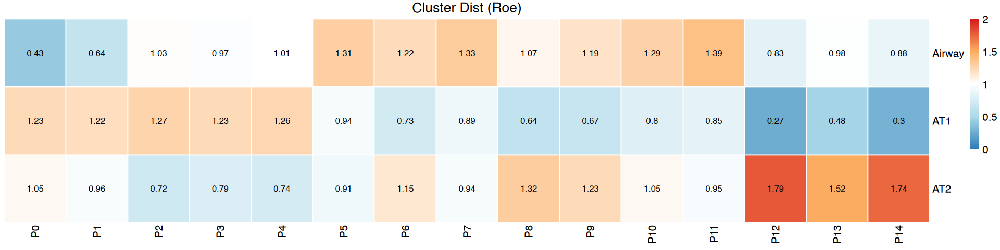

In [324]:
tmp_umap2 = tmp_umap%>% filter(!Celltype_round3%in%c('Tip', 'SMG_Oit1', 'SMG_Rnase1'))
res=distribution_Roe_func(tmp_umap2, tmp_round,'Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)

In [325]:
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}_Roe.pdf'), width = 8,height = 2)
res=distribution_Roe_func(tmp_umap2, tmp_round,'Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

pdf 
  3

`summarise()` has grouped output by 'Celltype_round2'. You can override using the `.groups` argument.


pdf 
  3

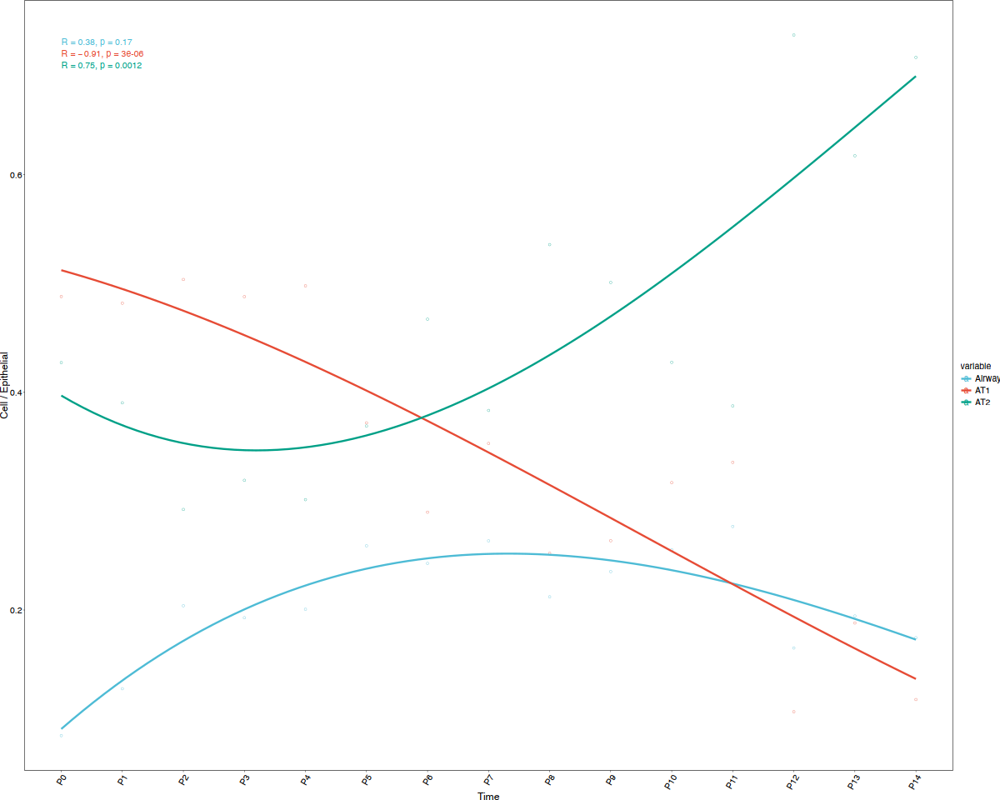

In [348]:
orig_df = as.data.frame.matrix(table(tmp_umap[,'Time'], tmp_umap[,tmp_round]))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))


options(repr.plot.width=10, repr.plot.height=8)
# a=orig_df %>%
#     mutate(Time=factor(Time, levels = time_levels)) %>%
#     ggplot()+
#     #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
#     geom_point(mapping = aes(x=Time, y=value,color=variable),  size=2)+
#     stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
#     geom_smooth(mapping = aes(x=x, y=value,color=variable),
#                 method = 'glm' , formula = 'y ~ poly(x,3)', se=F,  size=1)+
#     scale_color_manual(values = expanded_colors2)+
#     labs(y='Cell / Epithelial')+
#     theme_classic()+
#     mytheme
# a
a=orig_df %>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / Epithelial')+
    scale_color_manual(values = expanded_colors2)+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}_line_plot.pdf'), a+NoLegend(),
       width=40, height=40, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}_line_plot_legend.pdf'), get_legend(a),
       width=40, height=40, units='mm', dpi=600, bg='transparent')

In [ ]:
# ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}_line_plot.pdf'), a,
#        width=70, height=50, units='mm', dpi=600, bg='transparent')

In [128]:
tmp_umap = umap[umap$Celltype_round1=='Epithelium',]
tmp_umap = tmp_umap%>% filter(!Celltype_round3%in%c('Tip', 'SMG_Oit1', 'SMG_Rnase1'))
tmp_round='new_name'

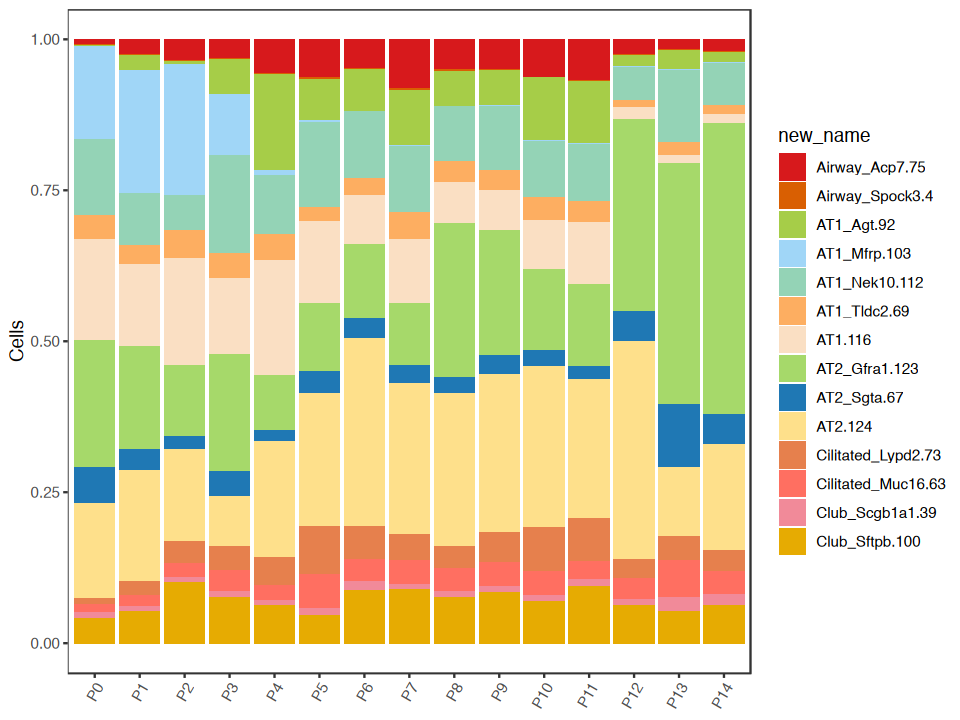

In [129]:
options(repr.plot.width=8, repr.plot.height=6)
a=distribution_func(tmp_umap, 'Time', tmp_round, color=round4_color_new)
a

In [307]:
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}.pdf'), a,
       width=8, height=6, units='in', dpi=600, bg='transparent')

`summarise()` has grouped output by 'new_name'. You can override using the `.groups` argument.


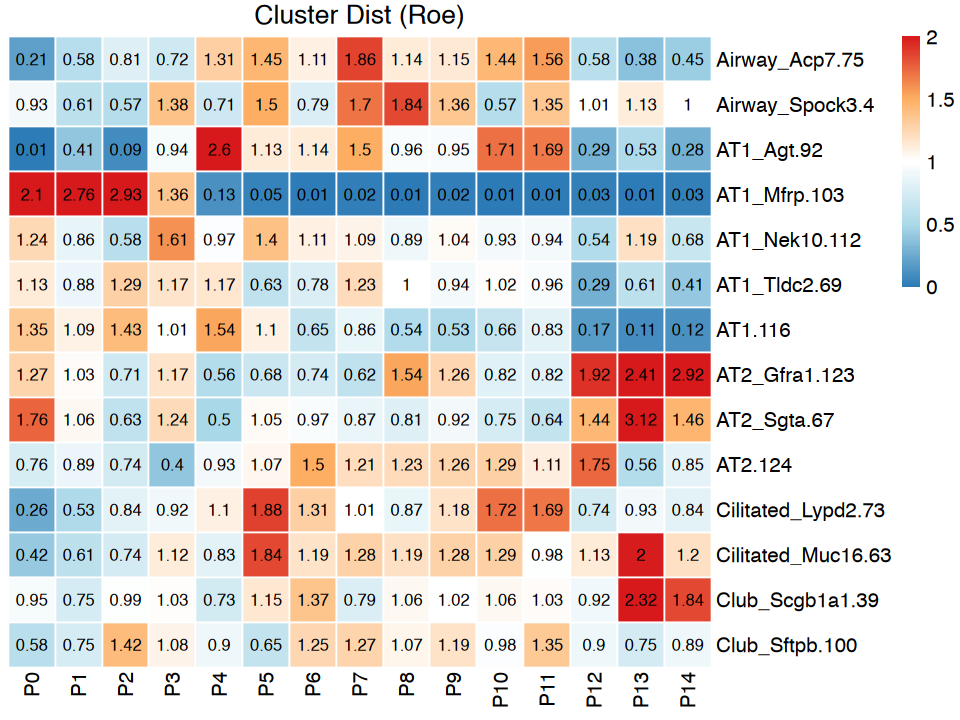

In [297]:
tmp_umap2 = tmp_umap%>% filter(!Celltype_round3%in%c('Tip', 'SMG_Oit1', 'SMG_Rnase1'))
res=distribution_Roe_func(tmp_umap2, tmp_round,'Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)

In [298]:
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}_Roe.pdf'), width = 8,height = 6)
res=distribution_Roe_func(tmp_umap2, tmp_round,'Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

pdf 
  3

`summarise()` has grouped output by 'new_name'. You can override using the `.groups` argument.


pdf 
  3

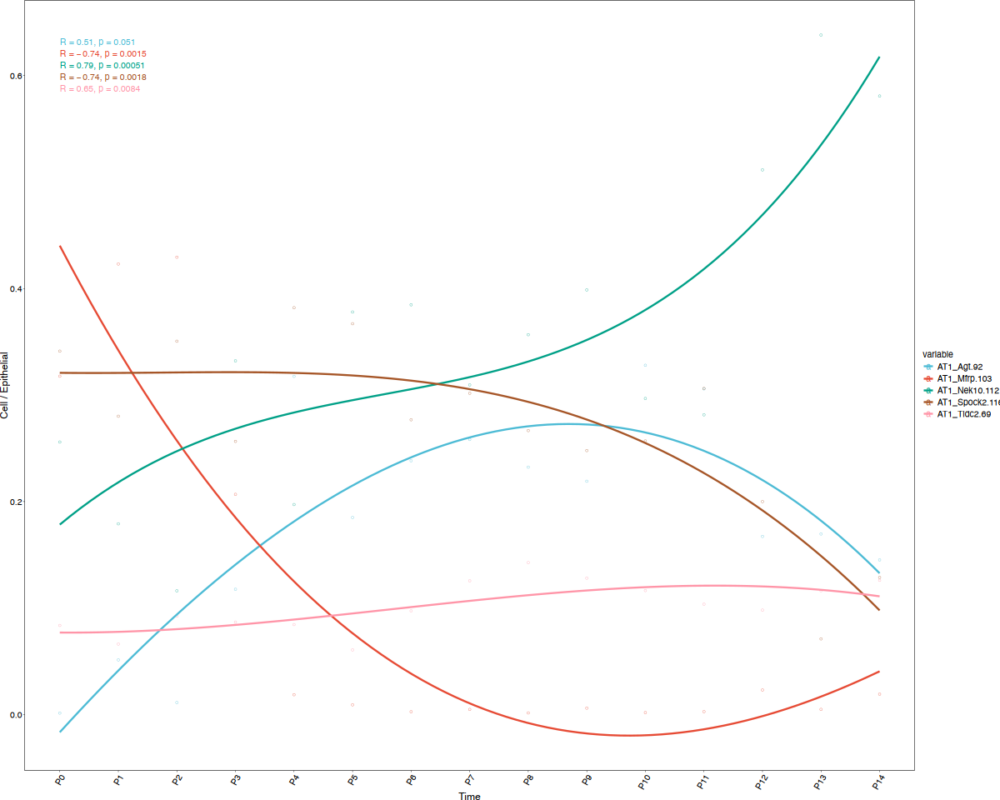

In [135]:
tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='AT1')
orig_df = as.data.frame.matrix(table(tmp_umap1[,'Time'], tmp_umap1[,'new_name']))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))


options(repr.plot.width=10, repr.plot.height=8)
# a=orig_df %>%
#     mutate(Time=factor(Time, levels = time_levels)) %>%
#     ggplot()+
#     #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
#     geom_point(mapping = aes(x=Time, y=value,color=variable),  size=2)+
#     stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
#     geom_smooth(mapping = aes(x=x, y=value,color=variable),
#                 method = 'glm' , formula = 'y ~ poly(x,3)', se=F,  size=1)+
#     scale_color_manual(values = expanded_colors2)+
#     labs(y='Cell / Epithelial')+
#     theme_classic()+
#     mytheme
# a
a=orig_df %>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / Epithelial')+
    scale_color_manual(values = expanded_colors2)+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a
# ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}_line_plot.pdf'), a+NoLegend(),
#        width=40, height=40, units='mm', dpi=600, bg='transparent')
# ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_{tmp_round}_line_plot_legend.pdf'), get_legend(a),
#        width=40, height=40, units='mm', dpi=600, bg='transparent')

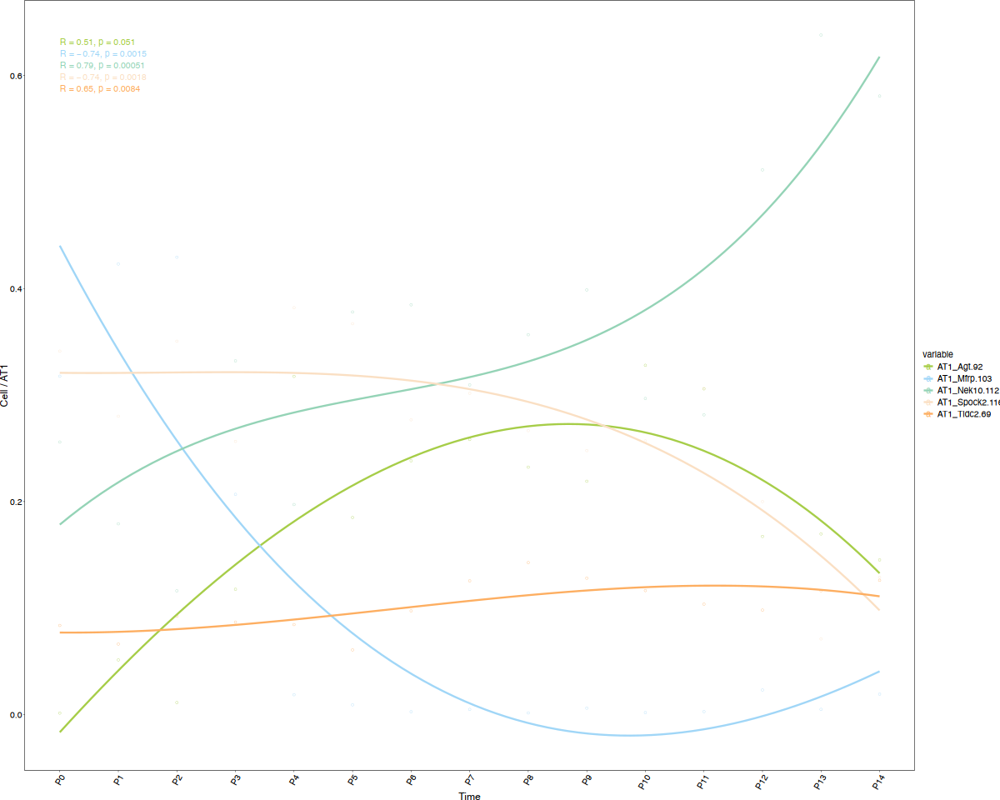

In [136]:
# tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='AT1')
# orig_df = melt(cell_prop_mat[,unique(tmp_umap1$new_name)])
# colnames(orig_df) = c('Time', 'Celltype', 'value')
# orig_df$x = as.numeric(gsub('P','',orig_df$Time))+1

tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='AT1')
orig_df = as.data.frame.matrix(table(tmp_umap1[,'Time'], tmp_umap1[,'new_name']))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))

options(repr.plot.width=10, repr.plot.height=8)
# a=orig_df %>%
#     mutate(Time=factor(Time, levels = time_levels)) %>%
#     ggplot()+
#     #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
#     geom_point(mapping = aes(x=Time, y=value,color=Celltype),  size=1)+
#     stat_cor(mapping = aes(x=x, y=value,color=Celltype), size=label_size(6))+
#     geom_smooth(mapping = aes(x=x, y=value,color=Celltype),
#                 method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=1)+
#     scale_color_manual(values = round4_color_new)+
#     labs(y='Cell / AT1')+
#     theme_classic()+
#     mytheme
# a

a=orig_df %>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / AT1')+
    scale_color_manual(values = round4_color_new)+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_AT1_major_subclusters.pdf'), a+NoLegend(),
       width=40, height=40, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_AT1_major_subclusters_legend.pdf'), get_legend(a),
       width=40, height=40, units='mm', dpi=600, bg='transparent')


In [142]:
nek10_prop = orig_df %>% filter(variable%in%c('AT1_Nek10.112'))
mfrp_prop = orig_df %>% filter(variable%in%c('AT1_Mfrp.103'))

In [178]:
Nek10_module_score=Nek10_module_score %>% 
    mutate(Time=factor(Time, time_levels)) %>%
    arrange(Time)
Nek10_module_score

Time,M15,M1,M5,M9,M17
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
P0,-0.51585994,-0.99770166,-0.85900025,-0.82752930,-0.48421155
P1,-0.21101412,-1.89461403,-1.10731602,-0.68091762,-0.25939065
P2,-0.35385192,-2.88598365,-1.80738186,-0.84440548,-0.39589261
P3,-0.51121201,-1.42949285,-1.13439000,-0.77585058,-0.42976391
P4,-0.26654561,-1.33212633,-0.93156011,-0.47614377,-0.31347047
P5,-0.22807143,1.24966090,0.43893317,-0.09972711,-0.08634252
P6,-0.03772695,0.62658751,0.31335353,0.18520791,0.14112728
P7,-0.02524103,-0.17739612,-0.12006112,-0.09392790,-0.20699833
P8,0.18518038,0.02612661,0.07962869,0.31227882,-0.01014988


In [179]:
all_merge_df = cbind(nek10_prop,mfrp_prop$value, Immune_prop$value)
all_merge_df = cbind(all_merge_df,Nek10_module_score[, c('M15', 'M1', 'M5', 'M9', 'M17')])
colnames(all_merge_df) = c('Time', 'x', 'Nek10', 'Nek10_prop', 'Mfrp_prop', 'Immune_prop', 'M15', 'M1', 'M5', 'M9', 'M17')
all_merge_df = melt(all_merge_df, id.vars = c('Time', 'x', 'Nek10', 'Nek10_prop'))
all_merge_df %>% head()

,Time,x,Nek10,Nek10_prop,variable,value
,<chr>,<int>,<fct>,<dbl>,<fct>,<dbl>
1,P0,1,AT1_Nek10.112,0.2559102,Mfrp_prop,0.317730496
2,P1,2,AT1_Nek10.112,0.1791350,Mfrp_prop,0.423144360
3,P2,3,AT1_Nek10.112,0.1161893,Mfrp_prop,0.429514524
4,P3,4,AT1_Nek10.112,0.3321533,Mfrp_prop,0.206788838
5,P4,5,AT1_Nek10.112,0.1972070,Mfrp_prop,0.018653367
6,P5,6,AT1_Nek10.112,0.3780105,Mfrp_prop,0.009162304


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


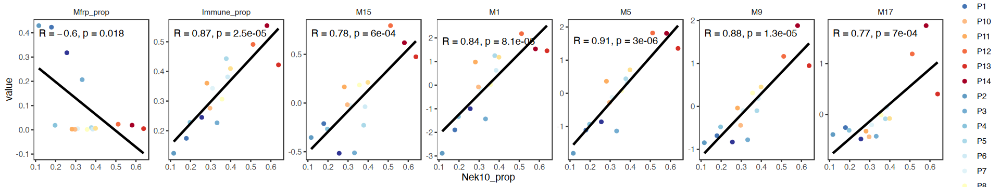

In [187]:
options(repr.plot.width=16, repr.plot.height=3)
a=all_merge_df %>%
    ggplot(aes(x=Nek10_prop, y=value))+
    geom_point(aes(, color=Time))+
    geom_smooth(se=F, method='lm', color='black')+
    stat_cor()+
    facet_wrap(~variable, scales = 'free_y', nrow=1)+
    scale_color_manual(values = time_color2)+
    theme_bw()+
    theme(panel.grid = element_blank(), strip.background = element_blank())
a
ggsave(glue('{output_dir}/cell_proportion_changes_Nek10_Immune_cor.pdf'), a,
       width=280, height=50, units='mm', dpi=600, bg='transparent')

In [366]:
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_AT1_major_subclusters.pdf'), a,
       width=80, height=50, units='mm', dpi=600, bg='transparent')

`summarise()` has grouped output by 'new_name'. You can override using the `.groups` argument.


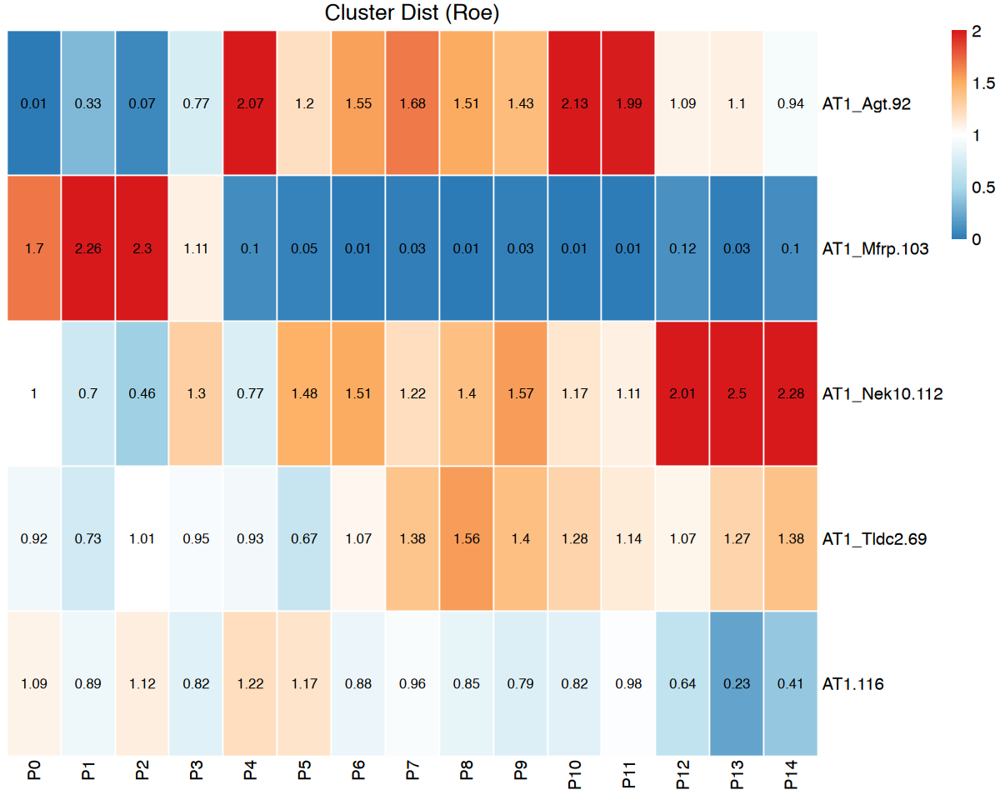

In [352]:
res=distribution_Roe_func(tmp_umap1, 'new_name','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)

In [357]:
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_Epithelium_AT1_Roe.pdf'), width = 8,height = 3)
res=distribution_Roe_func(tmp_umap1, 'new_name','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

pdf 
  3

`summarise()` has grouped output by 'new_name'. You can override using the `.groups` argument.


pdf 
  3

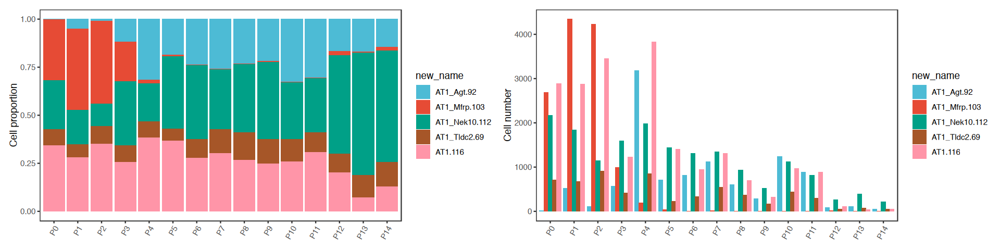

In [358]:
options(repr.plot.width=16, repr.plot.height=4)
#a=distribution_func(tmp_umap, 'Time', tmp_round)
#a

a1=distribution_func(tmp_umap1, 'Time', 'new_name')+labs(y='Cell proportion')
a2=distribution_func(tmp_umap1, 'Time', 'new_name', , position = 'dodge')+labs(y='Cell number')
a1+a2
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_AT1.pdf'), a1+a2,
       width=210, height=40, units='mm', dpi=600, bg='transparent')

In [397]:
tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='AT2')

In [402]:
table(tmp_umap1$new_name)
xx=table(tmp_umap1$new_name)/nrow(tmp_umap1)
xx
xx[1]+xx[3]


AT2_Gfra1.123   AT2_Sgta.67       AT2.124 
        28072          5691         35205 


AT2_Gfra1.123   AT2_Sgta.67       AT2.124 
   0.40702935    0.08251653    0.51045412 

AT2_Gfra1.123 
    0.9174835

In [407]:
late_tmp_umap1 = tmp_umap1 %>% filter(Time%in%c('P12','P13','P14'))
table(late_tmp_umap1$new_name)
xx=table(late_tmp_umap1$new_name)/nrow(late_tmp_umap1)
xx

late_tmp_umap1 = tmp_umap1 %>% filter(Time%in%c('P14'))
table(late_tmp_umap1$new_name)
xx=table(late_tmp_umap1$new_name)/nrow(late_tmp_umap1)
xx


AT2_Gfra1.123   AT2_Sgta.67       AT2.124 
         4358           732          2693 


AT2_Gfra1.123   AT2_Sgta.67       AT2.124 
   0.55993833    0.09405114    0.34601054 


AT2_Gfra1.123   AT2_Sgta.67       AT2.124 
         1497           152           546 


AT2_Gfra1.123   AT2_Sgta.67       AT2.124 
   0.68200456    0.06924829    0.24874715 

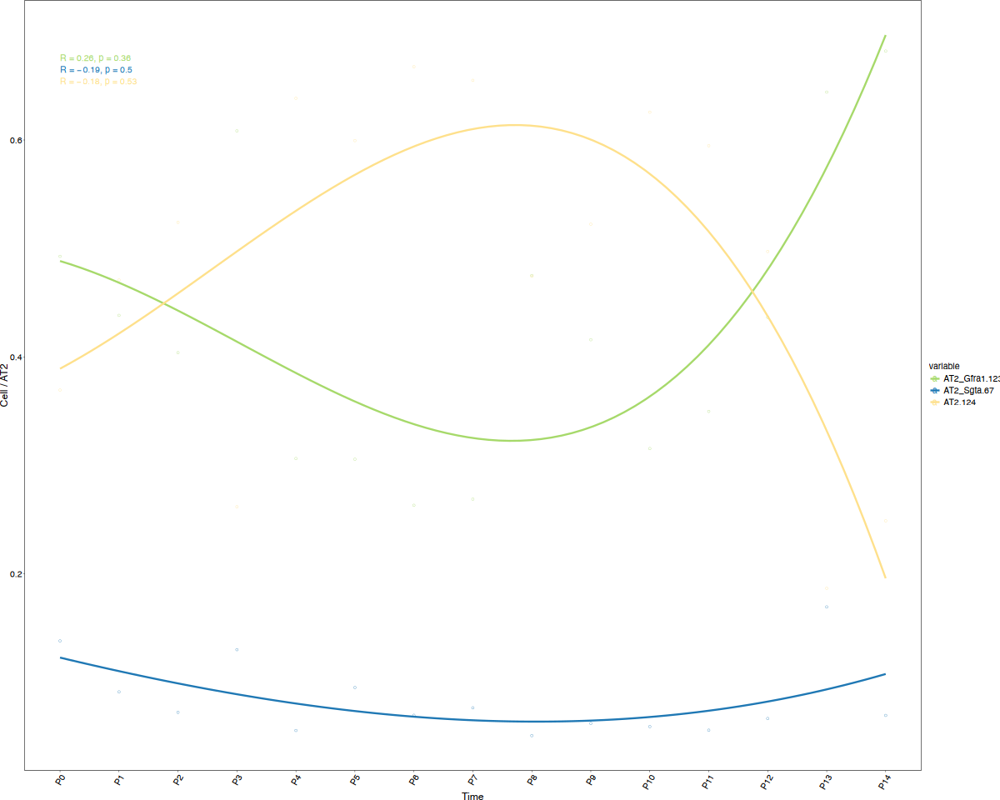

In [136]:
# tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='AT2')
# orig_df = melt(cell_prop_mat[,unique(tmp_umap1$new_name)])
# colnames(orig_df) = c('Time', 'Celltype', 'value')
# orig_df$x = as.numeric(gsub('P','',orig_df$Time))+1
tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='AT2')
orig_df = as.data.frame.matrix(table(tmp_umap1[,'Time'], tmp_umap1[,'new_name']))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))

options(repr.plot.width=10, repr.plot.height=8)
# a=orig_df %>%
#     mutate(Time=factor(Time, levels = time_levels)) %>%
#     ggplot()+
#     #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
#     geom_point(mapping = aes(x=Time, y=value,color=Celltype),  size=1)+
#     stat_cor(mapping = aes(x=x, y=value,color=Celltype), size=label_size(6))+
#     geom_smooth(mapping = aes(x=x, y=value,color=Celltype),
#                 method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=1)+
#     scale_color_manual(values = round4_color_new)+
#     labs(y='Cell / AT2')+
#     theme_classic()+
#     mytheme
# a
a=orig_df %>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / AT2')+
    scale_color_manual(values = round4_color_new)+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_AT2_major_subclusters.pdf'), a+NoLegend(),
       width=40, height=40, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_AT2_major_subclusters_legend.pdf'), get_legend(a),
       width=40, height=40, units='mm', dpi=600, bg='transparent')

`summarise()` has grouped output by 'new_name'. You can override using the `.groups` argument.


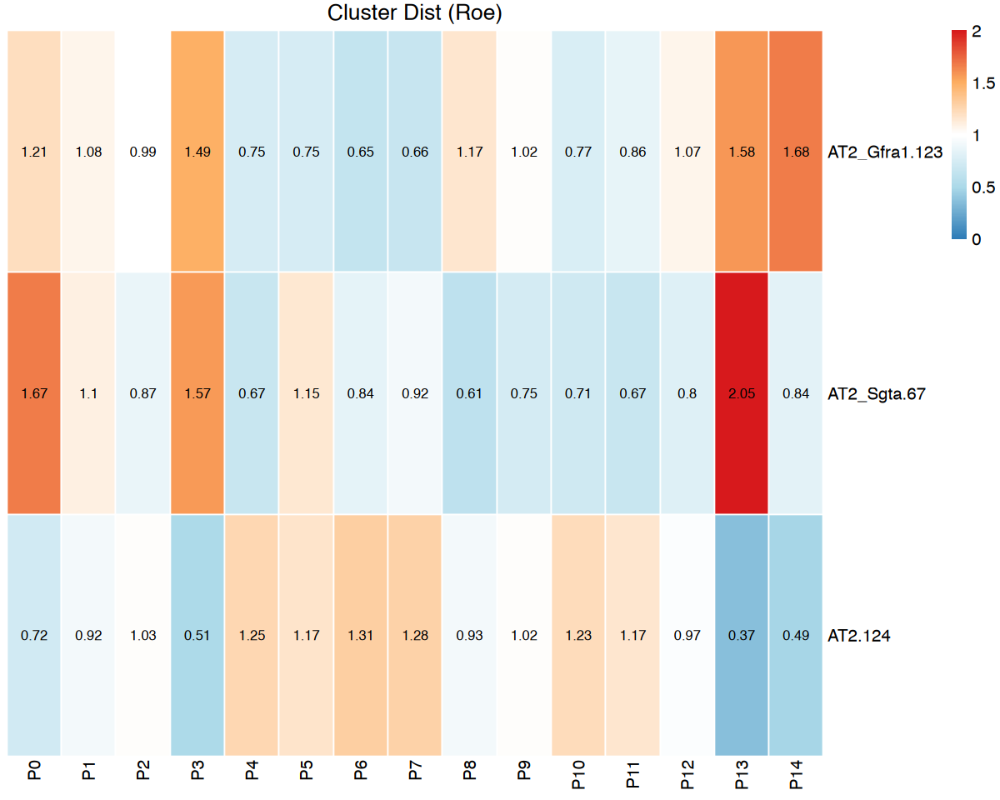

In [360]:
res=distribution_Roe_func(tmp_umap1, 'new_name','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)

In [361]:
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_Epithelium_AT2_Roe.pdf'), width = 8,height = 2)
res=distribution_Roe_func(tmp_umap1, 'new_name','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

pdf 
  3

`summarise()` has grouped output by 'new_name'. You can override using the `.groups` argument.


pdf 
  3

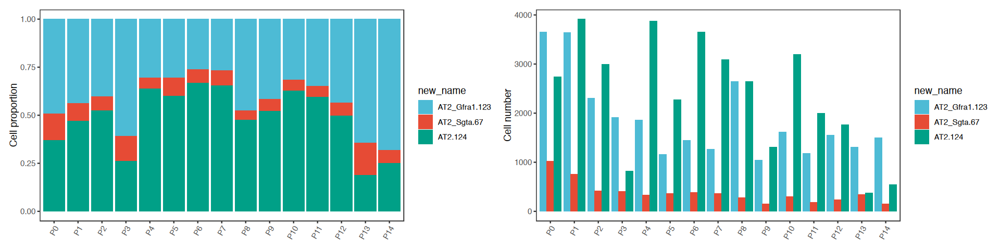

In [362]:
options(repr.plot.width=16, repr.plot.height=4)
#a=distribution_func(tmp_umap, 'Time', tmp_round)
#a

a1=distribution_func(tmp_umap1, 'Time', 'new_name')+labs(y='Cell proportion')
a2=distribution_func(tmp_umap1, 'Time', 'new_name', , position = 'dodge')+labs(y='Cell number')
a1+a2
ggsave(glue('{output_dir}/cell_proportion_changes_Epithelium_AT2.pdf'), a1+a2,
       width=210, height=40, units='mm', dpi=600, bg='transparent')

## Immune

In [10]:
tmp_umap = umap[umap$Celltype_round1=='Immune',]
#tmp_umap[tmp_umap$]
tmp_round='Celltype_round2'
tmp_umap[tmp_umap$Celltype_round3%in%c('NK'), tmp_round]='NK'
#tmp_umap[tmp_umap$Celltype_round3%in%c('NKT'), tmp_round]='NKT'

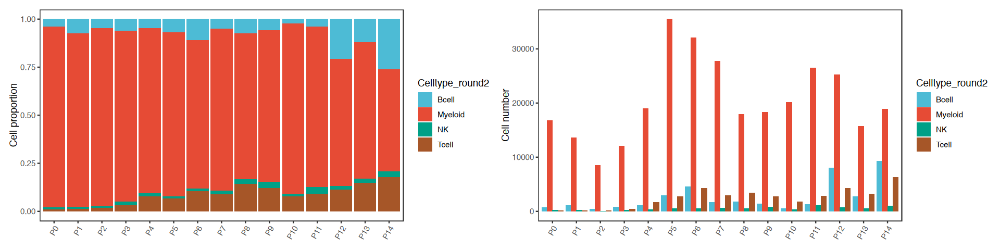

In [365]:
options(repr.plot.width=12, repr.plot.height=6)
#a=distribution_func(tmp_umap, 'Time', tmp_round)
#a

options(repr.plot.width=16, repr.plot.height=4)
#a=distribution_func(tmp_umap, 'Time', tmp_round)
#a

a1=distribution_func(tmp_umap, 'Time', tmp_round)+labs(y='Cell proportion')
a2=distribution_func(tmp_umap, 'Time', tmp_round, , position = 'dodge')+labs(y='Cell number')
a1+a2
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_{tmp_round}.pdf'), a1+a2,
       width=210, height=40, units='mm', dpi=600, bg='transparent')

`summarise()` has grouped output by 'Celltype_round2'. You can override using the `.groups` argument.


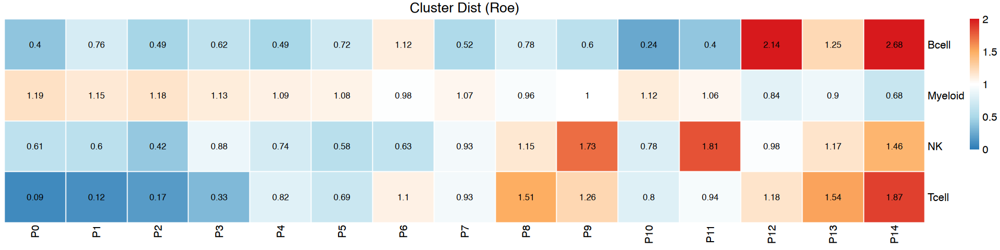

In [366]:
tmp_umap2 = tmp_umap%>% filter(!Celltype_round3%in%c('Tip', 'SMG_Oit1', 'SMG_Rnase1'))
res=distribution_Roe_func(tmp_umap2, tmp_round,'Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)

In [367]:
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_Immune_{tmp_round}_Roe.pdf'), width = 8,height = 2)
res=distribution_Roe_func(tmp_umap2, tmp_round,'Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

pdf 
  3

`summarise()` has grouped output by 'Celltype_round2'. You can override using the `.groups` argument.


pdf 
  3

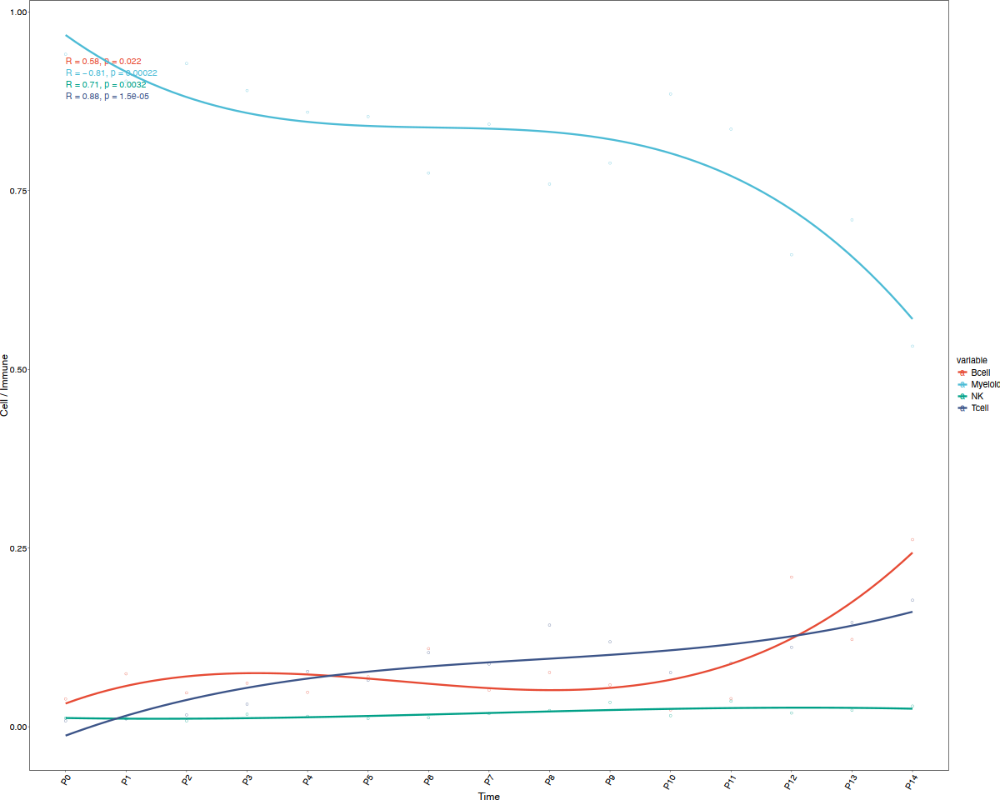

In [369]:
orig_df = as.data.frame.matrix(table(tmp_umap[,'Time'], tmp_umap[,tmp_round]))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))

options(repr.plot.width=10, repr.plot.height=8)
# a=orig_df %>%
#     mutate(Time=factor(Time, levels = time_levels)) %>%
#     ggplot()+
#     #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
#     geom_point(mapping = aes(x=Time, y=value,color=variable),  size=2)+
#     stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
#     geom_smooth(mapping = aes(x=x, y=value,color=variable),
#                 method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=1)+
#     scale_color_npg()+
#     labs(y='Cell / Immune')+
#     theme_classic()+
#     mytheme
# a

a=orig_df %>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / Immune')+
    scale_color_npg()+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_{tmp_round}_line_plot.pdf'), a+NoLegend(),
       width=40, height=40, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_{tmp_round}_line_plot_legend.pdf'), get_legend(a),
       width=40, height=40, units='mm', dpi=600, bg='transparent')

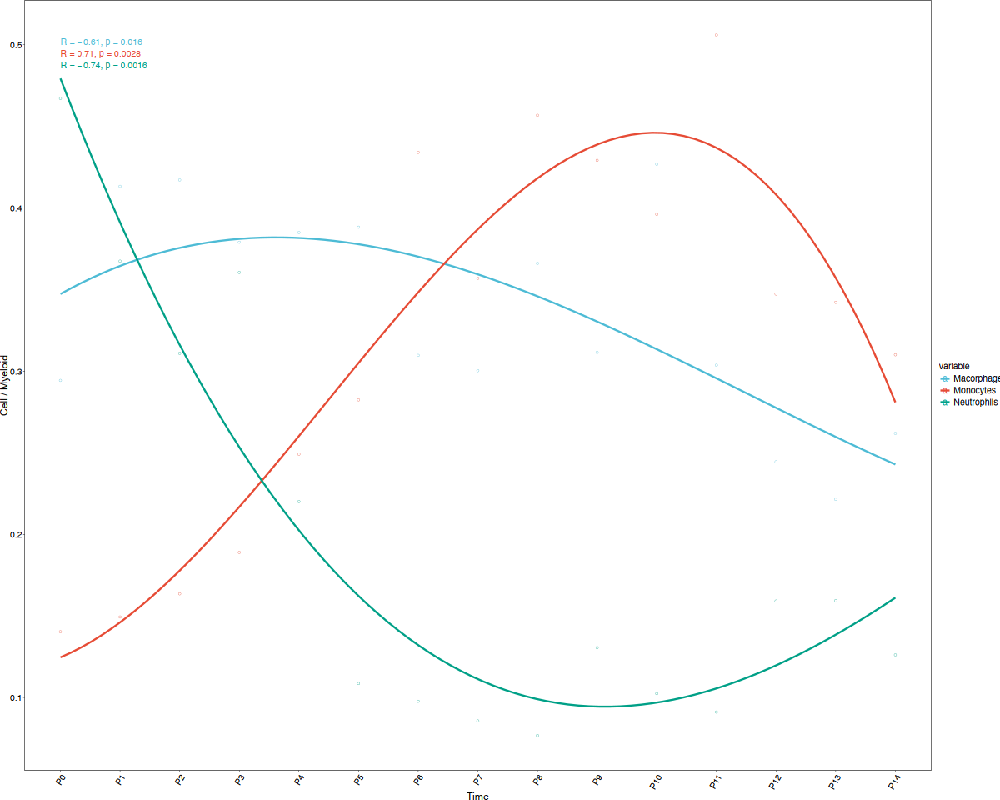

In [371]:
tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='Myeloid') 
orig_df = as.data.frame.matrix(table(tmp_umap1[,'Time'], tmp_umap1[,'Celltype_round3']))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))

options(repr.plot.width=10, repr.plot.height=8)
# a=orig_df %>%
#     filter(variable%in%c('Macorphage', 'Monocytes', 'Neutrophils'))%>%
#     mutate(Time=factor(Time, levels = time_levels)) %>%
#     ggplot()+
#     #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
#     geom_point(mapping = aes(x=Time, y=value,color=variable),  size=2)+
#     stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
#     geom_smooth(mapping = aes(x=x, y=value,color=variable),
#                 method = 'glm' , formula = 'y ~ poly(x,3)', se=F,  size=1)+
#     scale_color_manual(values = expanded_colors2)+
#     labs(y='Cell / Myeloid')+
#     theme_classic()+
#     mytheme
# a

a=orig_df %>%
    filter(variable%in%c('Macorphage', 'Monocytes', 'Neutrophils'))%>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / Myeloid')+
    scale_color_manual(values = expanded_colors2)+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_round3_myeloid_line_plot.pdf'), a+NoLegend(),
       width=40, height=40, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_round3_myeloid_line_plot_legend.pdf'), get_legend(a),
       width=40, height=40, units='mm', dpi=600, bg='transparent')

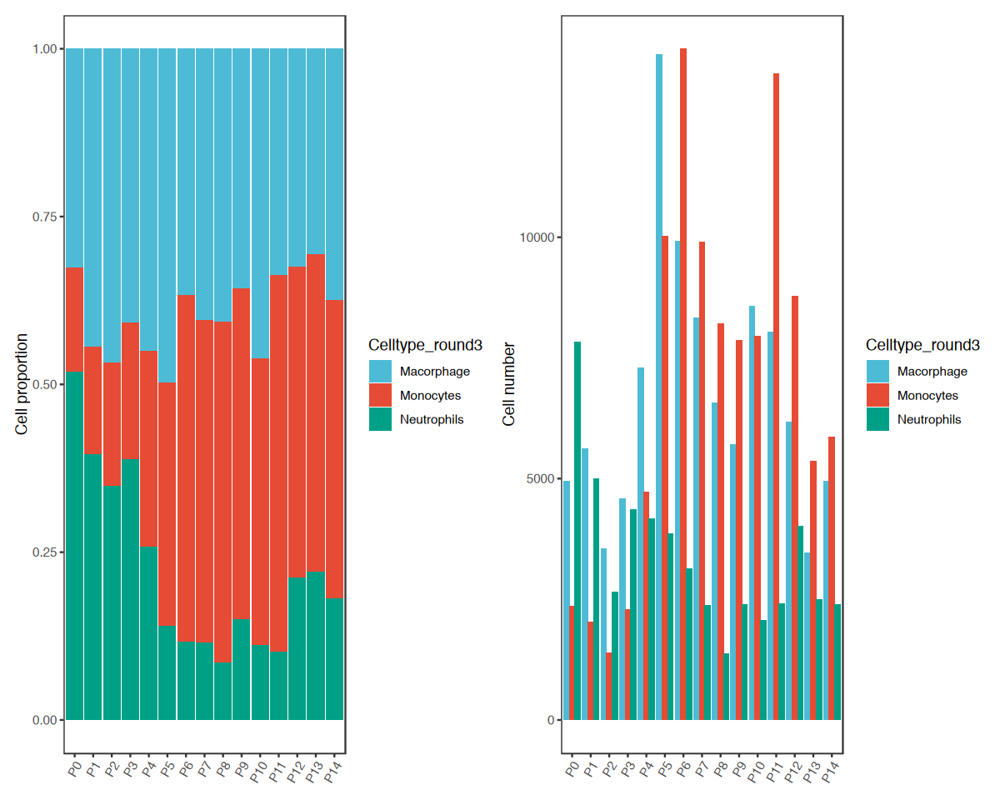

In [374]:
a1=distribution_func(tmp_umap1%>%filter(Celltype_round3%in%c('Macorphage', 'Monocytes', 'Neutrophils')), 'Time', 'Celltype_round3')+labs(y='Cell proportion')
a2=distribution_func(tmp_umap1%>%filter(Celltype_round3%in%c('Macorphage', 'Monocytes', 'Neutrophils')), 'Time', 'Celltype_round3', , position = 'dodge')+labs(y='Cell number')
a1+a2
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_Myeloid_{tmp_round}.pdf'), a1+a2,
       width=210, height=40, units='mm', dpi=600, bg='transparent')

`summarise()` has grouped output by 'Celltype_round3'. You can override using the `.groups` argument.


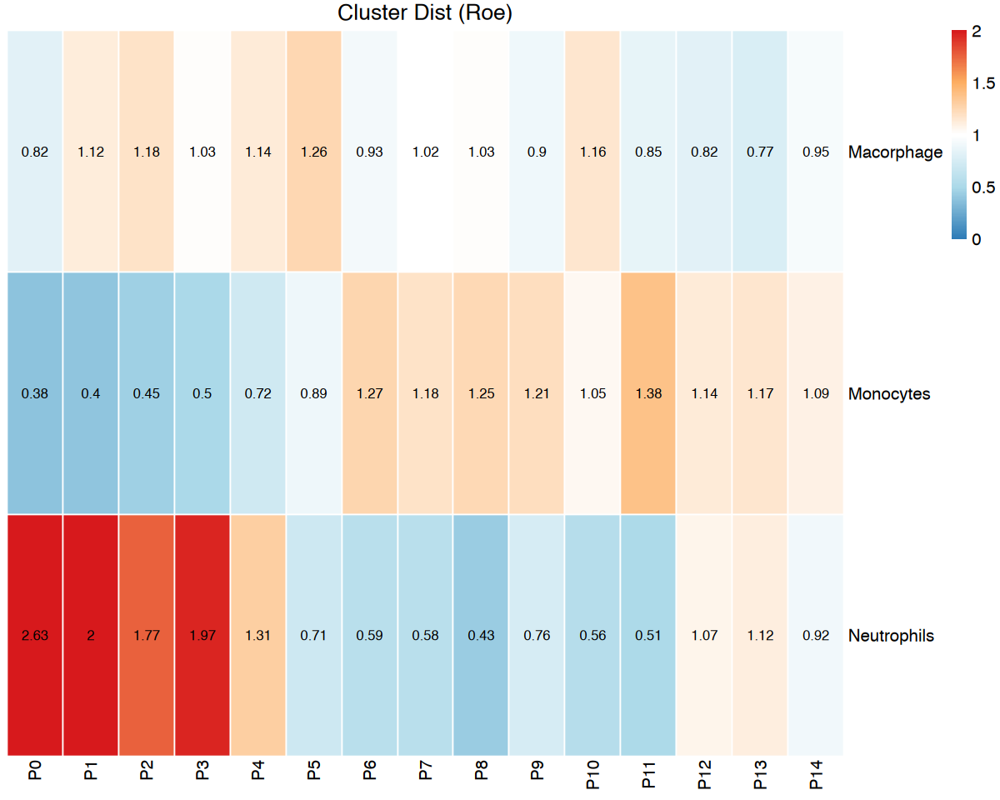

In [375]:
tmp_umap2 = tmp_umap%>% filter(Celltype_round3%in%c('Macorphage', 'Monocytes', 'Neutrophils'))
res=distribution_Roe_func(tmp_umap2, 'Celltype_round3','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)

In [ ]:
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_Immune_Myeloid_{tmp_round}_Roe.pdf'), width = 8,height = 2)
res=distribution_Roe_func(tmp_umap2, 'Celltype_round3','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

pdf 
  3

`summarise()` has grouped output by 'Celltype_round3'. You can override using the `.groups` argument.


pdf 
  3

In [388]:
tmp_umap1 = tmp_umap %>% 
    filter(Celltype_round2=='Tcell') %>%
    filter(!Celltype_round4%in%c('ILC1','ILC2', 'ILC3') )
tmp_umap1[tmp_umap1$Celltype_round3=='Treg', 'Celltype_round3'] = 'CD4'
tmp_umap1[tmp_umap1$Celltype_round3%in%c('NKT'), 'Celltype_round3']='NKT'

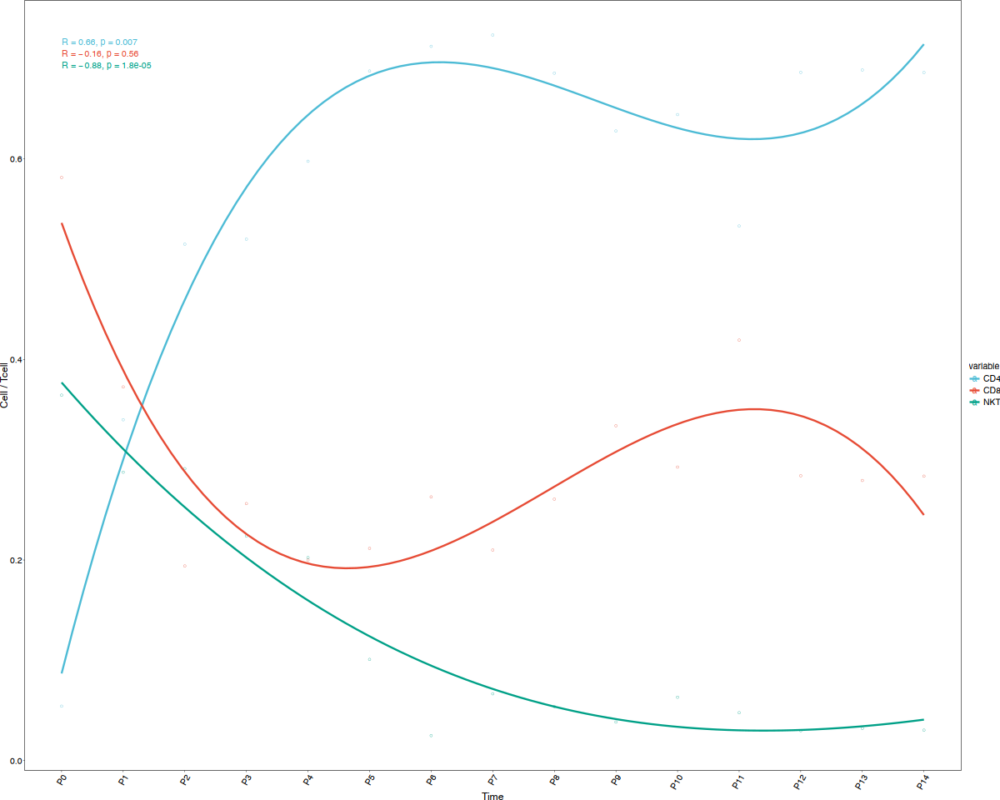

In [381]:
#tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='Tcell') 
orig_df = as.data.frame.matrix(table(tmp_umap1[,'Time'], tmp_umap1[,'Celltype_round3']))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))

options(repr.plot.width=10, repr.plot.height=8)
# a=orig_df %>%
#     filter(!variable%in%c('ILCs'))%>%
#     mutate(Time=factor(Time, levels = time_levels)) %>%
#     ggplot()+
#     #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
#     geom_point(mapping = aes(x=Time, y=value,color=variable),  size=2)+
#     stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
#     geom_smooth(mapping = aes(x=x, y=value,color=variable),
#                 method = 'glm' , formula = 'y ~ poly(x,3)', se=F,  size=1)+
#     scale_color_manual(values = expanded_colors2)+
#     labs(y='Cell / Tcell')+
#     theme_classic()+
#     mytheme
# a
a=orig_df %>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / Tcell')+
    scale_color_manual(values = expanded_colors2)+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_round3_Tcell_line_plot.pdf'), a+NoLegend(),
       width=40, height=40, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_round3_Tcell_line_plot_legend.pdf'), get_legend(a),
       width=40, height=40, units='mm', dpi=600, bg='transparent')

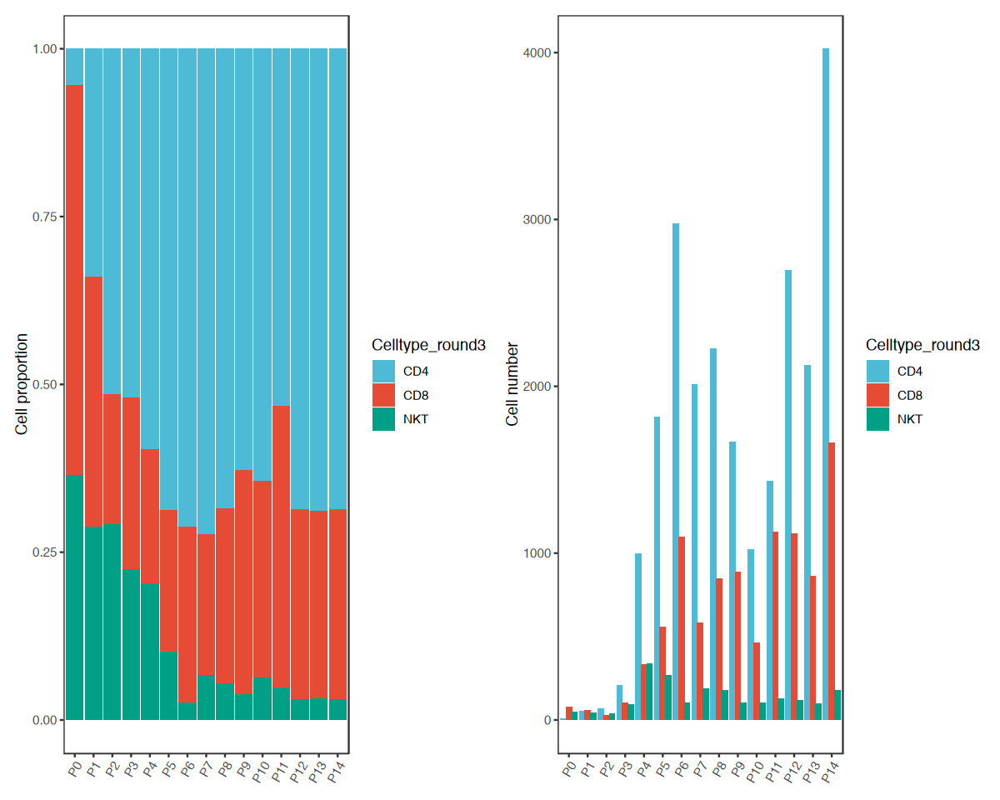

In [382]:
a1=distribution_func(tmp_umap1, 'Time', 'Celltype_round3')+labs(y='Cell proportion')
a2=distribution_func(tmp_umap1, 'Time', 'Celltype_round3', , position = 'dodge')+labs(y='Cell number')
a1+a2
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_Tcell_{tmp_round}.pdf'), a1+a2,
       width=210, height=40, units='mm', dpi=600, bg='transparent')

`summarise()` has grouped output by 'Celltype_round3'. You can override using the `.groups` argument.


pdf 
  3

`summarise()` has grouped output by 'Celltype_round3'. You can override using the `.groups` argument.


pdf 
  3

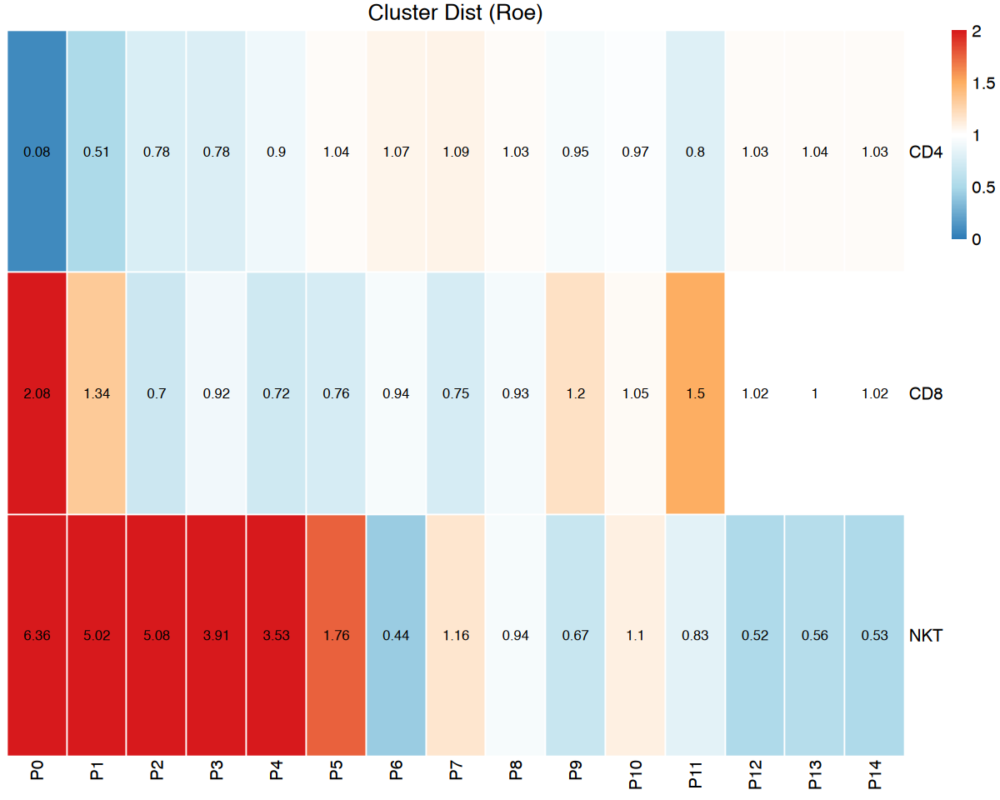

In [390]:
res=distribution_Roe_func(tmp_umap1, 'Celltype_round3','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_Immune_Tcell_{tmp_round}_Roe.pdf'), width = 8,height = 2)
res=distribution_Roe_func(tmp_umap1, 'Celltype_round3','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

In [391]:
tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='Bcell') 
tmp_umap1[tmp_umap1$Celltype_round3%in%c('MatureB_(Cd5+)Ccl22','MatureB_(Cd5+)Dusp2','MatureB(Cd5-)'), 
          'Celltype_round3'] = 'MatureB'

In [415]:
table(tmp_umap1$Celltype_round3)


 ImmatureB    MatureB preAndProB 
      6519      29672       1962 

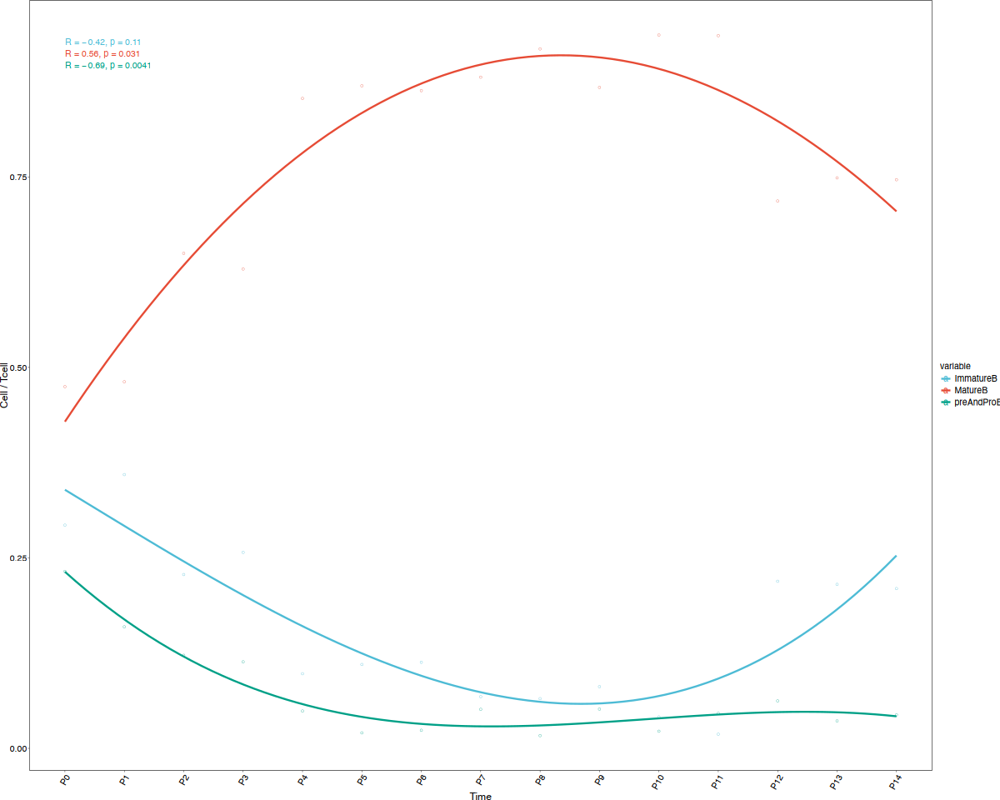

In [385]:
#tmp_umap1 = tmp_umap %>% filter(Celltype_round2=='Bcell') 
orig_df = as.data.frame.matrix(table(tmp_umap1[,'Time'], tmp_umap1[,'Celltype_round3']))
orig_df = orig_df / rowSums(orig_df)
orig_df$x = 1:15
orig_df$Time=rownames(orig_df)
orig_df = melt(orig_df, id.vars=c('Time','x'))

options(repr.plot.width=10, repr.plot.height=8)
# a=orig_df %>%
#     filter(!variable%in%c('ILCs'))%>%
#     mutate(Time=factor(Time, levels = time_levels)) %>%
#     ggplot()+
#     #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
#     geom_point(mapping = aes(x=Time, y=value,color=variable),  size=2)+
#     stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
#     geom_smooth(mapping = aes(x=x, y=value,color=variable),
#                 method = 'glm' , formula = 'y ~ poly(x,3)', se=F,  size=1)+
#     scale_color_manual(values = expanded_colors2)+
#     labs(y='Cell / Bcell')+
#     theme_classic()+
#     mytheme
# a
a=orig_df %>%
    mutate(Time=factor(Time, levels = time_levels)) %>%
    ggplot()+
    #geom_line(mapping = aes(x=Time, y=value,color=variable,group=variable), size=2)+
    geom_point(mapping = aes(x=Time, y=value,color=variable),  size=0.5,fill=NA,shape=21, stroke=0.1)+
    stat_cor(mapping = aes(x=x, y=value,color=variable), size=label_size(6))+
    geom_smooth(mapping = aes(x=x, y=value,color=variable),
                method = 'glm' , formula = 'y ~ poly(x,3)', se=F, size=0.5)+
    labs(y='Cell / Tcell')+
    scale_color_manual(values = expanded_colors2)+
    mytheme+
    theme(axis.text.x = element_text(angle = 60, hjust=1, vjust=1))
a
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_round3_Bcell_line_plot.pdf'), a+NoLegend(),
       width=40, height=40, units='mm', dpi=600, bg='transparent')
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_round3_Bcell_line_plot_legend.pdf'), get_legend(a),
       width=40, height=40, units='mm', dpi=600, bg='transparent')

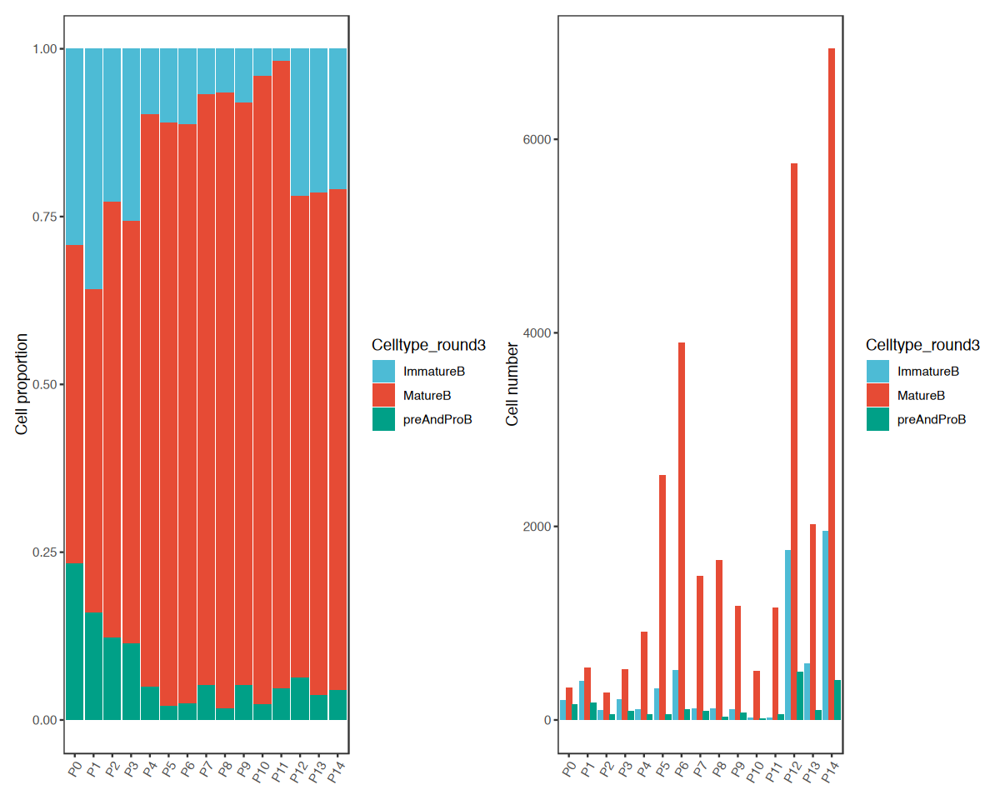

In [393]:
a1=distribution_func(tmp_umap1, 'Time', 'Celltype_round3')+labs(y='Cell proportion')
a2=distribution_func(tmp_umap1, 'Time', 'Celltype_round3', , position = 'dodge')+labs(y='Cell number')
a1+a2
ggsave(glue('{output_dir}/cell_proportion_changes_Immune_Bcell_{tmp_round}.pdf'), a1+a2,
       width=210, height=40, units='mm', dpi=600, bg='transparent')

`summarise()` has grouped output by 'Celltype_round3'. You can override using the `.groups` argument.


pdf 
  3

`summarise()` has grouped output by 'Celltype_round3'. You can override using the `.groups` argument.


pdf 
  3

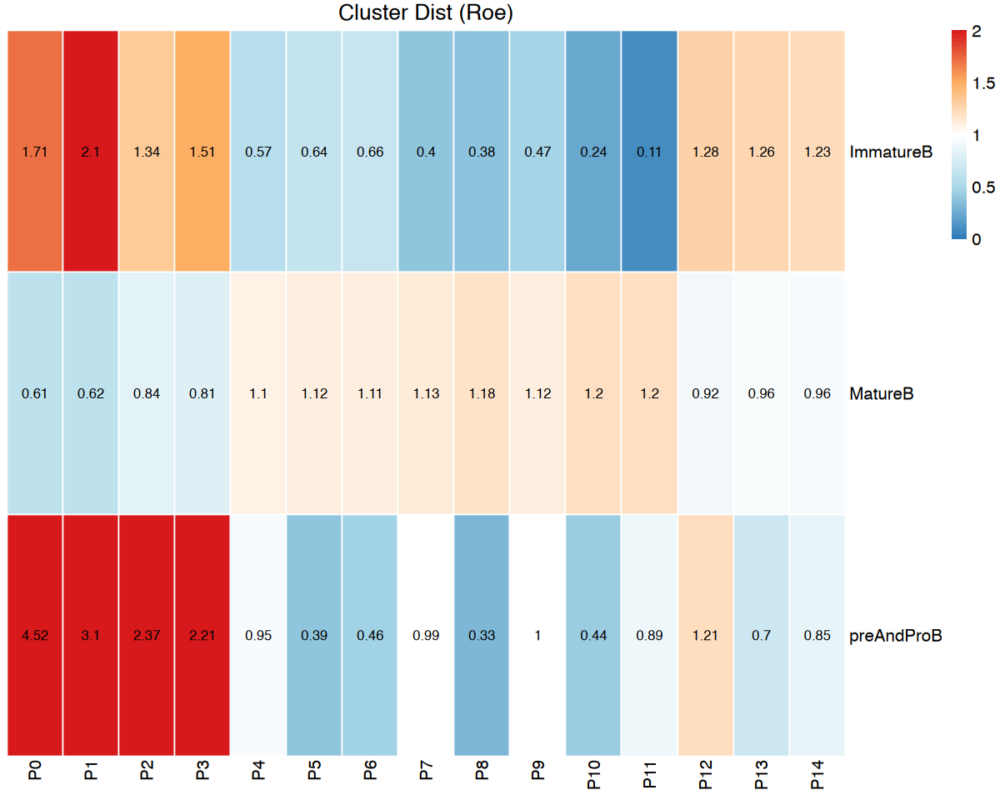

In [392]:
res=distribution_Roe_func(tmp_umap1, 'Celltype_round3','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()
pdf(glue('{output_dir}/cell_proportion_changes_Immune_Bcell_{tmp_round}_Roe.pdf'), width = 8,height = 2)
res=distribution_Roe_func(tmp_umap1, 'Celltype_round3','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)
dev.off()

In [128]:
length(umap$new_name %>% unique())

[1] 129

In [11]:
tmp_umap = umap[umap$Celltype_round1=='Immune',]

`summarise()` has grouped output by 'Celltype_round4'. You can override using the `.groups` argument.


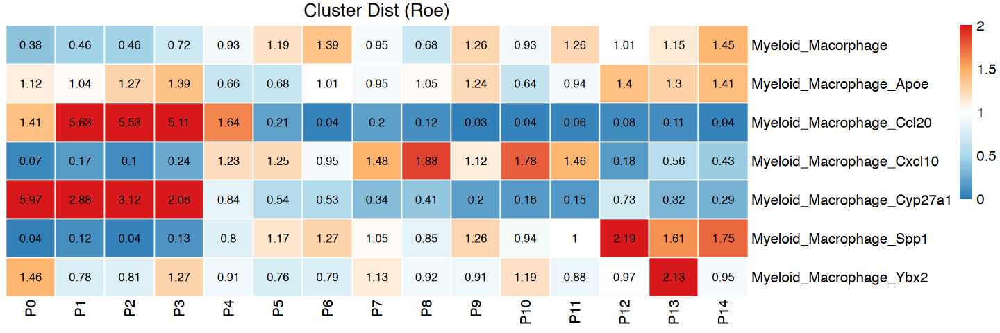

In [15]:
options(repr.plot.width=12, repr.plot.height=4)
tmp_umap2 = tmp_umap%>% filter(Celltype_round3%in%c('Macorphage'))
tmp_umap2$Celltype_round4 = gsub('Macorphage_','Macrophage_', tmp_umap2$Celltype_round4)
res=distribution_Roe_func(tmp_umap2, 'Celltype_round4','Time', obj_is_meta=TRUE, 
                      show.sign = 'value', angle_col = 90,size=12)